In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence
import wandb
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import copy
from torch.cuda.amp import autocast, GradScaler

# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


### Data Loading and Preprocessing

In [2]:
!wget https://storage.googleapis.com/gresearch/dakshina/dakshina_dataset_v1.0.tar
!tar -xf dakshina_dataset_v1.0.tar

# Data paths
train_path = "dakshina_dataset_v1.0/hi/lexicons/hi.translit.sampled.train.tsv"
val_path = "dakshina_dataset_v1.0/hi/lexicons/hi.translit.sampled.dev.tsv"
test_path = "dakshina_dataset_v1.0/hi/lexicons/hi.translit.sampled.test.tsv"

# Load data
train_df = pd.read_csv(train_path, delimiter='\t', names=['hi', 'en', '_'])
val_df = pd.read_csv(val_path, delimiter='\t', names=['hi', 'en', '_'])
test_df = pd.read_csv(test_path, delimiter='\t', names=['hi', 'en', '_'])

print(f"Train samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")

# Check max sequence lengths
src_max_len = max([len(str(text)) for text in train_df['en']])
tgt_max_len = max([len(str(text)) for text in train_df['hi']])
print(f"Max source sequence length: {src_max_len}")
print(f"Max target sequence length: {tgt_max_len}")

--2025-05-17 11:43:26--  https://storage.googleapis.com/gresearch/dakshina/dakshina_dataset_v1.0.tar
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.196.207, 108.177.12.207, 74.125.134.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.196.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2008340480 (1.9G) [application/x-tar]
Saving to: ‘dakshina_dataset_v1.0.tar’

dakshina_dataset_v1 100%[===================>]   1.87G   267MB/s    in 7.4s    

2025-05-17 11:43:33 (258 MB/s) - ‘dakshina_dataset_v1.0.tar’ saved [2008340480/2008340480]

Train samples: 44204
Validation samples: 4358
Test samples: 4502
Max source sequence length: 20
Max target sequence length: 19


### Vocab Creation

In [3]:
def create_vocab(texts, special_tokens=True):
    chars = set()
    for text in texts:
        for char in str(text):
            chars.add(char)
    
    # Create vocabulary dictionary
    if special_tokens:
        vocab = {'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3}
    else:
        vocab = {}
        
    for i, char in enumerate(sorted(list(chars))):
        vocab[char] = i + 4
    
    return vocab

def text_to_indices(text, vocab):
    indices = [vocab['<SOS>']]
    for char in str(text):
        if char in vocab:
            indices.append(vocab[char])
        elif char.lower() in vocab:
            indices.append(vocab[char.lower()])
        else:
            indices.append(vocab['<UNK>'])
    indices.append(vocab['<EOS>'])
    return indices

# Create vocabularies
src_vocab = create_vocab(train_df['en'])
tgt_vocab = create_vocab(train_df['hi'])

# Create reverse mappings for visualization
idx2src = {idx: char for char, idx in src_vocab.items()}
idx2tgt = {idx: char for char, idx in tgt_vocab.items()}

print(f"Source vocabulary size: {len(src_vocab)}")
print(f"Target vocabulary size: {len(tgt_vocab)}")


Source vocabulary size: 30
Target vocabulary size: 67


### Dataset and Dataloader

In [4]:
class TransliterationDataset(Dataset):
    def __init__(self, dataframe, src_vocab, tgt_vocab):
        self.dataframe = dataframe
        self.src_vocab = src_vocab
        self.tgt_vocab = tgt_vocab
        
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        src_text = self.dataframe.iloc[idx]['en']
        tgt_text = self.dataframe.iloc[idx]['hi']
        
        src_indices = text_to_indices(src_text, self.src_vocab)
        tgt_indices = text_to_indices(tgt_text, self.tgt_vocab)
        
        return torch.tensor(src_indices), torch.tensor(tgt_indices)

def collate_fn(batch):
    src_batch, tgt_batch = [], []
    for src, tgt in batch:
        # Safety check for index bounds
        src = torch.clamp(src, 0, len(src_vocab)-1)
        tgt = torch.clamp(tgt, 0, len(tgt_vocab)-1)
        
        # Pad or truncate to max lengths
        src = src[:20]  # Max source length is 20
        tgt = tgt[:19]  # Max target length is 19
        
        src_batch.append(src)
        tgt_batch.append(tgt)
    
    src_batch = pad_sequence(src_batch, batch_first=True, padding_value=src_vocab['<PAD>'])
    tgt_batch = pad_sequence(tgt_batch, batch_first=True, padding_value=tgt_vocab['<PAD>'])
    
    return src_batch, tgt_batch

### Encoder Model

In [5]:
class Encoder(nn.Module):
    def __init__(self, input_vocab_size, embedding_dim, hidden_dim, num_layers, dropout, cell_type):
        super().__init__()
        self.embedding = nn.Embedding(input_vocab_size, embedding_dim)
        self.cell_type = cell_type.lower()
        
        if self.cell_type == "lstm":
            self.rnn = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers, 
                              dropout=dropout if num_layers > 1 else 0, batch_first=True)
        elif self.cell_type == "gru":
            self.rnn = nn.GRU(embedding_dim, hidden_dim, num_layers=num_layers, 
                             dropout=dropout if num_layers > 1 else 0, batch_first=True)
        else:  # rnn
            self.rnn = nn.RNN(embedding_dim, hidden_dim, num_layers=num_layers, 
                             dropout=dropout if num_layers > 1 else 0, batch_first=True)
        
        self.dropout = nn.Dropout(dropout)
        
        # Apply weight initialization
        self._init_weights()
        
    def _init_weights(self):
        for name, param in self.named_parameters():
            if 'weight_ih' in name:
                nn.init.xavier_uniform_(param.data)
            elif 'weight_hh' in name:
                nn.init.orthogonal_(param.data)
            elif 'bias' in name:
                param.data.fill_(0)
        
    def forward(self, src):
        # src: [batch_size, src_len]
        embedded = self.dropout(self.embedding(src))  # [batch_size, src_len, emb_dim]
        
        if self.cell_type == "lstm":
            outputs, (hidden, cell) = self.rnn(embedded)
            return outputs, hidden, cell
        else:
            outputs, hidden = self.rnn(embedded)
            return outputs, hidden, None

### Attention Decoder

In [6]:
class AttentionDecoder(nn.Module):
    def __init__(self, output_vocab_size, embedding_dim, hidden_dim, num_layers, dropout, cell_type):
        super().__init__()
        self.output_vocab_size = output_vocab_size
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(output_vocab_size, embedding_dim)
        self.cell_type = cell_type.lower()
        
        # Attention mechanism
        self.attention = nn.Linear(hidden_dim * 2, hidden_dim)
        self.attention_combine = nn.Linear(hidden_dim + embedding_dim, embedding_dim)
        
        # RNN layer
        if cell_type == "lstm":
            self.rnn = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers, 
                              dropout=dropout if num_layers > 1 else 0, batch_first=True)
        elif cell_type == "gru":
            self.rnn = nn.GRU(embedding_dim, hidden_dim, num_layers=num_layers, 
                             dropout=dropout if num_layers > 1 else 0, batch_first=True)
        else:  # rnn
            self.rnn = nn.RNN(embedding_dim, hidden_dim, num_layers=num_layers, 
                             dropout=dropout if num_layers > 1 else 0, batch_first=True)
        
        self.fc_out = nn.Linear(hidden_dim, output_vocab_size)
        self.dropout = nn.Dropout(dropout)
        
        # Apply weight initialization
        self._init_weights()
        
    def _init_weights(self):
        for name, param in self.named_parameters():
            if 'weight_ih' in name:
                nn.init.xavier_uniform_(param.data)
            elif 'weight_hh' in name:
                nn.init.orthogonal_(param.data)
            elif 'bias' in name:
                param.data.fill_(0)
        
    def forward(self, input, hidden, cell, encoder_outputs):
        # input: [batch_size]
        # hidden: [num_layers, batch_size, hidden_dim]
        # encoder_outputs: [batch_size, src_len, hidden_dim]
        
        input = input.unsqueeze(1)  # [batch_size, 1]
        embedded = self.dropout(self.embedding(input))  # [batch_size, 1, emb_dim]
        
        # Calculate attention weights
        batch_size = encoder_outputs.size(0)
        src_len = encoder_outputs.size(1)
        
        # Use the last layer of hidden state for attention
        attn_hidden = hidden[-1].unsqueeze(1)  # [batch_size, 1, hidden_dim]
        
        # Repeat for each encoder output
        attn_hidden = attn_hidden.repeat(1, src_len, 1)  # [batch_size, src_len, hidden_dim]
        
        # Concatenate encoder outputs and hidden state
        energy = torch.cat((encoder_outputs, attn_hidden), dim=2)  # [batch_size, src_len, 2*hidden_dim]
        energy = self.attention(energy)  # [batch_size, src_len, hidden_dim]
        energy = torch.tanh(energy)
        
        # Calculate attention weights
        attn_weights = torch.sum(energy, dim=2)  # [batch_size, src_len]
        attn_weights = F.softmax(attn_weights, dim=1).unsqueeze(1)  # [batch_size, 1, src_len]
        
        # Apply attention weights to encoder outputs
        context = torch.bmm(attn_weights, encoder_outputs)  # [batch_size, 1, hidden_dim]
        
        # Combine embedded input and context vector
        rnn_input = torch.cat((embedded, context), dim=2)  # [batch_size, 1, emb_dim + hidden_dim]
        rnn_input = self.attention_combine(rnn_input)  # [batch_size, 1, emb_dim]
        
        # Pass through RNN
        if self.cell_type == "lstm":
            output, (hidden, cell) = self.rnn(rnn_input, (hidden, cell))
        else:
            output, hidden = self.rnn(rnn_input, hidden)
            cell = None
            
        # Generate output
        prediction = self.fc_out(output.squeeze(1))  # [batch_size, output_vocab_size]
        
        return prediction, hidden, cell, attn_weights

### Attention Seq2Seq Model

In [7]:
class AttentionSeq2Seq(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.encoder = Encoder(
            config['input_vocab_size'],
            config['embedding_dim'],
            config['hidden_dim'],
            config['num_encoding_layers'],
            config['dropout'],
            config['cell_type']
        )
        self.decoder = AttentionDecoder(
            config['output_vocab_size'],
            config['embedding_dim'],
            config['hidden_dim'],
            config['num_decoding_layers'],
            config['dropout'],
            config['cell_type']
        )
        self.device = config.get('device', device)
        self.teacher_forcing_ratio = config.get('teacher_forcing_ratio', 0.5)
        self.cell_type = config['cell_type'].lower()
        self.config = config
        
    def forward(self, src, trg, teacher_forcing=1):
        batch_size = trg.shape[0]
        trg_len = trg.shape[1]
        trg_vocab_size = self.decoder.output_vocab_size
        
        # Tensor to store decoder outputs
        outputs = torch.zeros(batch_size, trg_len, trg_vocab_size).to(self.device)
        
        # Tensor to store attention weights
        attentions = torch.zeros(batch_size, trg_len, src.shape[1]).to(self.device)
        
        # Encode source sequence
        encoder_outputs, hidden, cell = self.encoder(src)
        
        # Adjust hidden state dimensions if needed
        enc_layers = self.config['num_encoding_layers']
        dec_layers = self.config['num_decoding_layers']
        hidden_size = self.config['hidden_dim']
        
        if enc_layers != dec_layers:
            if self.cell_type != 'lstm':
                # Case 1: Encoder has more layers - take only what we need
                if enc_layers > dec_layers:
                    hidden = hidden[:dec_layers]
                # Case 2: Decoder has more layers - pad with zeros
                else:
                    padding = torch.zeros(dec_layers - enc_layers, batch_size, hidden_size).to(self.device)
                    hidden = torch.cat([hidden, padding], dim=0)
            else:  # LSTM case
                if enc_layers > dec_layers:
                    hidden = hidden[:dec_layers]
                    cell = cell[:dec_layers]
                else:
                    padding = torch.zeros(dec_layers - enc_layers, batch_size, hidden_size).to(self.device)
                    hidden = torch.cat([hidden, padding], dim=0)
                    cell = torch.cat([cell, padding], dim=0)
        
        # First input to decoder is <SOS> token
        input = trg[:, 0]
        
        for t in range(1, trg_len):
            # Get decoder output
            output, hidden, cell, attn_weights = self.decoder(input, hidden, cell, encoder_outputs)
            
            # Store prediction and attention weights
            outputs[:, t, :] = output
            attentions[:, t, :] = attn_weights.squeeze(1)
            
            # Teacher forcing
            teacher_force = random.random() < self.teacher_forcing_ratio * teacher_forcing
            
            # Get highest predicted token
            top1 = output.argmax(1)
            
            # Next input is either ground truth or predicted token
            input = trg[:, t] if teacher_force else top1
            
        return outputs, attentions

### Training and Evaluation

In [8]:

def train_epoch(model, dataloader, optimizer, criterion, scaler=None, clip=1.0):
    model.train()
    epoch_loss = 0
    
    for src, trg in tqdm(dataloader, desc="Training", leave=False):
        src, trg = src.to(device), trg.to(device)
        
        optimizer.zero_grad()
        
        # Mixed precision training
        if scaler:
            with autocast():
                output, _ = model(src, trg)
                
                # Exclude <SOS> token
                output_dim = output.shape[-1]
                output = output[:, 1:].reshape(-1, output_dim)
                trg = trg[:, 1:].reshape(-1)
                
                loss = criterion(output, trg)
                
            # Scale loss and backprop
            scaler.scale(loss).backward()
            
            # Unscale gradients and clip
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
            
            # Update weights
            scaler.step(optimizer)
            scaler.update()
        else:
            output, _ = model(src, trg)
            
            # Exclude <SOS> token
            output_dim = output.shape[-1]
            output = output[:, 1:].reshape(-1, output_dim)
            trg = trg[:, 1:].reshape(-1)
            
            loss = criterion(output, trg)
            loss.backward()
            
            # Clip gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
            
            optimizer.step()
            
        epoch_loss += loss.item()
        
    return epoch_loss / len(dataloader)

In [9]:
def evaluate(model, dataloader, criterion):
    model.eval()
    epoch_loss = 0
    
    # For exact match accuracy
    exact_match_correct = 0
    exact_match_total = 0
    
    # For character-level accuracy
    char_correct = 0
    char_total = 0
    
    with torch.no_grad():
        for src, trg in tqdm(dataloader, desc="Evaluating", leave=False):
            src, trg = src.to(device), trg.to(device)
            
            output, _ = model(src, trg, 0)  # Turn off teacher forcing
            
            # For loss calculation
            output_dim = output.shape[-1]
            output_flat = output[:, 1:].reshape(-1, output_dim)
            trg_flat = trg[:, 1:].reshape(-1)
            
            loss = criterion(output_flat, trg_flat)
            epoch_loss += loss.item()
            
            # Get predictions
            predictions = output.argmax(dim=2)
            
            # Calculate exact match and character-level accuracy
            for i in range(len(predictions)):
                pred_seq = predictions[i, 1:].cpu().numpy()  # Skip <SOS>
                target_seq = trg[i, 1:].cpu().numpy()  # Skip <SOS>
                
                # Get valid sequence (remove padding)
                valid_length = (target_seq != tgt_vocab['<PAD>']).sum()
                pred_clean = pred_seq[:valid_length]
                target_clean = target_seq[:valid_length]
                
                # Check exact match
                if np.array_equal(pred_clean, target_clean):
                    exact_match_correct += 1
                exact_match_total += 1
                
                # Calculate character-level accuracy
                for j in range(valid_length):
                    if pred_seq[j] == target_seq[j]:
                        char_correct += 1
                    char_total += 1
    
    # Calculate metrics
    exact_match_accuracy = exact_match_correct / exact_match_total if exact_match_total > 0 else 0
    char_accuracy = char_correct / char_total if char_total > 0 else 0
    
    return {
        'loss': epoch_loss / len(dataloader),
        'exact_match_accuracy': exact_match_accuracy,
        'char_accuracy': char_accuracy
    }

### Translation and Attention Visualization Functions

In [10]:

def translate_sentence(model, sentence, src_vocab, tgt_vocab, idx2tgt, max_len=50):
    model.eval()
    
    # Convert to indices and add <SOS> and <EOS>
    indices = text_to_indices(sentence, src_vocab)
    src_tensor = torch.LongTensor(indices).unsqueeze(0).to(device)
    
    # Get encoder outputs
    with torch.no_grad():
        encoder_outputs, hidden, cell = model.encoder(src_tensor)
    
    # Adjust hidden state dimensions if needed
    enc_layers = model.config['num_encoding_layers']
    dec_layers = model.config['num_decoding_layers']
    hidden_size = model.config['hidden_dim']
    
    if enc_layers != dec_layers:
        batch_size = 1  # Since we're translating one sentence
        if model.cell_type != 'lstm':
            if enc_layers > dec_layers:
                hidden = hidden[:dec_layers]
            else:
                padding = torch.zeros(dec_layers - enc_layers, batch_size, hidden_size).to(device)
                hidden = torch.cat([hidden, padding], dim=0)
        else:  # LSTM case
            if enc_layers > dec_layers:
                hidden = hidden[:dec_layers]
                cell = cell[:dec_layers]
            else:
                padding = torch.zeros(dec_layers - enc_layers, batch_size, hidden_size).to(device)
                hidden = torch.cat([hidden, padding], dim=0)
                cell = torch.cat([cell, padding], dim=0)
    
    # Start with <SOS> token
    trg_idx = [tgt_vocab['<SOS>']]
    attentions = []
    
    for _ in range(max_len):
        trg_tensor = torch.LongTensor([trg_idx[-1]]).to(device)
        
        with torch.no_grad():
            output, hidden, cell, attn_weights = model.decoder(trg_tensor, hidden, cell, encoder_outputs)
        
        # Store attention weights
        attentions.append(attn_weights.squeeze().cpu().numpy())
        
        pred_token = output.argmax(1).item()
        
        # Stop if <EOS> token
        if pred_token == tgt_vocab['<EOS>']:
            break
        
        trg_idx.append(pred_token)
    
    # Convert indices to characters
    trg_tokens = [idx2tgt[i] for i in trg_idx if i not in [tgt_vocab['<SOS>'], tgt_vocab['<EOS>'], tgt_vocab['<PAD>']]]
    
    return ''.join(trg_tokens), attentions

In [11]:
def plot_attention(sentence, translation, attention, idx2src):
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111)
    
    # Remove special tokens from sentence
    sentence_chars = [idx2src[i] for i in text_to_indices(sentence, src_vocab) 
                     if i not in [src_vocab['<SOS>'], src_vocab['<EOS>'], src_vocab['<PAD>']]]
    
    attention = attention[:len(translation), :len(sentence_chars)]
    
    ax.matshow(attention, cmap='Blues')
    
    ax.set_xticklabels([''] + sentence_chars, rotation=90)
    ax.set_yticklabels([''] + list(translation))
    
    ax.xaxis.set_major_locator(plt.MultipleLocator(1))
    ax.yaxis.set_major_locator(plt.MultipleLocator(1))
    
    plt.tight_layout()
    return fig

In [12]:
def create_attention_grid(model, test_examples, src_vocab, tgt_vocab, idx2src, idx2tgt, rows=3, cols=3):
    """Create a grid of attention visualizations for test examples."""
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    examples = test_examples[:rows*cols]
    
    for i, example in enumerate(examples):
        row = i // cols
        col = i % cols
        
        # Get translation and attention matrix
        translation, attention_matrix = translate_sentence(
            model, example, src_vocab, tgt_vocab, idx2tgt
        )
        
        # Get source and target tokens
        src_tokens = [c for c in example]
        tgt_tokens = [c for c in translation]
        
        # Plot attention matrix
        attention = np.array(attention_matrix)[:len(tgt_tokens), :len(src_tokens)]
        im = axes[row, col].imshow(attention, cmap='Blues')
        
        # Set labels
        axes[row, col].set_xticks(range(len(src_tokens)))
        axes[row, col].set_yticks(range(len(tgt_tokens)))
        axes[row, col].set_xticklabels(src_tokens, fontsize=8, rotation=90)
        axes[row, col].set_yticklabels(tgt_tokens, fontsize=8)
        axes[row, col].set_title(f"{example} → {translation}", fontsize=10)
    
    plt.tight_layout()
    return fig

### W&B Sweep Configuration and Training

In [13]:
!pip install wandb -q

import wandb
wandb.login(key='130161b8988911058327a18dbbdfb663c58411b2')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: da24m005 (da24m005-iit-madras) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. learning_rate uses log_uniform, where min/max specify base-e exponents. Use log_uniform_values to specify limit values.


Create sweep with ID: 6vex8glo
Sweep URL: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/sweeps/6vex8glo


wandb: Agent Starting Run: is2izbts with config:
wandb: 	batch_size: 128
wandb: 	cell_type: gru
wandb: 	dropout: 0.3
wandb: 	embedding_dim: 256
wandb: 	hidden_dim: 256
wandb: 	learning_rate: 0.0006962114122862738
wandb: 	num_decoding_layers: 2
wandb: 	num_encoding_layers: 2
wandb: 	teacher_forcing_ratio: 0.9
wandb: Tracking run with wandb version 0.19.9
wandb: Run data is saved locally in /kaggle/working/wandb/run-20250517_114354-is2izbts
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run frosty-sweep-1
wandb: ⭐️ View project at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: 🧹 View sweep at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/sweeps/6vex8glo
wandb: 🚀 View run at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/is2izbts
/tmp/ipykernel_19/873808521.py:51: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.


Training:   0%|          | 0/346 [00:00<?, ?it/s]

/tmp/ipykernel_19/1710485381.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1566, Val Loss: 1.8481
Exact Match Accuracy: 0.1267, Char Accuracy: 0.5414


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.8312, Val Loss: 1.5287
Exact Match Accuracy: 0.2809, Char Accuracy: 0.6638


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5985, Val Loss: 1.5625
Exact Match Accuracy: 0.3424, Char Accuracy: 0.6889


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5065, Val Loss: 1.4251
Exact Match Accuracy: 0.3674, Char Accuracy: 0.7083


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4557, Val Loss: 1.4579
Exact Match Accuracy: 0.3772, Char Accuracy: 0.7149


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4124, Val Loss: 1.4674
Exact Match Accuracy: 0.3811, Char Accuracy: 0.7211


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3855, Val Loss: 1.4422
Exact Match Accuracy: 0.3896, Char Accuracy: 0.7263


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3661, Val Loss: 1.4071
Exact Match Accuracy: 0.4041, Char Accuracy: 0.7332


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3410, Val Loss: 1.4549
Exact Match Accuracy: 0.4144, Char Accuracy: 0.7348


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3295, Val Loss: 1.4393
Exact Match Accuracy: 0.4080, Char Accuracy: 0.7325


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.3119, Val Loss: 1.4201
Exact Match Accuracy: 0.4284, Char Accuracy: 0.7405


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2965, Val Loss: 1.4536
Exact Match Accuracy: 0.4169, Char Accuracy: 0.7399


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2820, Val Loss: 1.4609
Exact Match Accuracy: 0.4121, Char Accuracy: 0.7409


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2751, Val Loss: 1.4137
Exact Match Accuracy: 0.4227, Char Accuracy: 0.7434


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2726, Val Loss: 1.4303
Exact Match Accuracy: 0.4183, Char Accuracy: 0.7406


/tmp/ipykernel_19/2168023762.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + sentence_chars, rotation=90)
/tmp/ipykernel_19/2168023762.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + list(translation))
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2310 (\N{DEVANAGARI LETTER AA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Matplotlib currently does not support Devanagari natively.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2325 (\N{DEVANAGARI LETTER KA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2369 (\N{DEVANAGARI VOWEL SIGN U}) missing from current font.
  plt.tight_layout(

Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.2642, Val Loss: 1.5618
Exact Match Accuracy: 0.2682, Char Accuracy: 0.6475


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.5804, Val Loss: 1.4862
Exact Match Accuracy: 0.3327, Char Accuracy: 0.6889


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.4798, Val Loss: 1.4580
Exact Match Accuracy: 0.3687, Char Accuracy: 0.6948


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4282, Val Loss: 1.4704
Exact Match Accuracy: 0.3678, Char Accuracy: 0.7040


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3862, Val Loss: 1.4943
Exact Match Accuracy: 0.3814, Char Accuracy: 0.7139


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3612, Val Loss: 1.4924
Exact Match Accuracy: 0.3770, Char Accuracy: 0.7128


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3453, Val Loss: 1.4373
Exact Match Accuracy: 0.3674, Char Accuracy: 0.7141


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3281, Val Loss: 1.5024
Exact Match Accuracy: 0.3743, Char Accuracy: 0.7156


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3155, Val Loss: 1.4563
Exact Match Accuracy: 0.3880, Char Accuracy: 0.7238


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3055, Val Loss: 1.5337
Exact Match Accuracy: 0.3779, Char Accuracy: 0.7205


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2921, Val Loss: 1.5301
Exact Match Accuracy: 0.3850, Char Accuracy: 0.7243


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2827, Val Loss: 1.5682
Exact Match Accuracy: 0.3837, Char Accuracy: 0.7194


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2753, Val Loss: 1.5964
Exact Match Accuracy: 0.3903, Char Accuracy: 0.7247


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2704, Val Loss: 1.5967
Exact Match Accuracy: 0.3942, Char Accuracy: 0.7244


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2639, Val Loss: 1.6082
Exact Match Accuracy: 0.3823, Char Accuracy: 0.7204


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2344 (\N{DEVANAGARI LETTER NA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2360 (\N{DEVANAGARI LETTER SA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2344 (\N{DEVANAGARI LETTER NA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2360 (\N{DEVANAGARI LETTER SA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from 

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.3508, Val Loss: 1.7131
Exact Match Accuracy: 0.1503, Char Accuracy: 0.5799


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.9069, Val Loss: 1.3246
Exact Match Accuracy: 0.2802, Char Accuracy: 0.6613


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6996, Val Loss: 1.2341
Exact Match Accuracy: 0.3148, Char Accuracy: 0.6893


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6232, Val Loss: 1.1367
Exact Match Accuracy: 0.3410, Char Accuracy: 0.7048


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5735, Val Loss: 1.1888
Exact Match Accuracy: 0.3463, Char Accuracy: 0.7024


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.5377, Val Loss: 1.2421
Exact Match Accuracy: 0.3531, Char Accuracy: 0.7041


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.5047, Val Loss: 1.1515
Exact Match Accuracy: 0.3628, Char Accuracy: 0.7187


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.4880, Val Loss: 1.1700
Exact Match Accuracy: 0.3720, Char Accuracy: 0.7175


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.4595, Val Loss: 1.1504
Exact Match Accuracy: 0.3706, Char Accuracy: 0.7195


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.4587, Val Loss: 1.1945
Exact Match Accuracy: 0.3678, Char Accuracy: 0.7177


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.4447, Val Loss: 1.2000
Exact Match Accuracy: 0.3807, Char Accuracy: 0.7208


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.4291, Val Loss: 1.1685
Exact Match Accuracy: 0.3740, Char Accuracy: 0.7242


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.4393, Val Loss: 1.1690
Exact Match Accuracy: 0.3678, Char Accuracy: 0.7235


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.4452, Val Loss: 1.1763
Exact Match Accuracy: 0.3747, Char Accuracy: 0.7205


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.4516, Val Loss: 1.2298
Exact Match Accuracy: 0.3557, Char Accuracy: 0.7081


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2375 (\N{DEVANAGARI VOWEL SIGN E}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2375 (\N{DEVANAGARI VOWEL SIGN E}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2337 (\N{DEVANAGARI LETTER DDA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2364 (\N{DEVANAGARI SIGN NUKTA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2337 (\N{DEVANAGARI LETTER DDA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2364 (\N{DEVANAGARI SIGN NUKTA}) missing fro

Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1705, Val Loss: 2.1395
Exact Match Accuracy: 0.0468, Char Accuracy: 0.4486


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.8315, Val Loss: 2.3108
Exact Match Accuracy: 0.0262, Char Accuracy: 0.4201


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.9504, Val Loss: 2.3927
Exact Match Accuracy: 0.0177, Char Accuracy: 0.3968


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4, Train Loss: 2.0987, Val Loss: 2.4333
Exact Match Accuracy: 0.0220, Char Accuracy: 0.3841


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5, Train Loss: 2.2298, Val Loss: 2.5530
Exact Match Accuracy: 0.0177, Char Accuracy: 0.3625


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6, Train Loss: 2.2991, Val Loss: 2.5320
Exact Match Accuracy: 0.0087, Char Accuracy: 0.3433


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7, Train Loss: 2.3253, Val Loss: 2.5926
Exact Match Accuracy: 0.0078, Char Accuracy: 0.3505


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8, Train Loss: 2.3279, Val Loss: 2.6168
Exact Match Accuracy: 0.0046, Char Accuracy: 0.3401


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9, Train Loss: 2.3903, Val Loss: 2.6987
Exact Match Accuracy: 0.0046, Char Accuracy: 0.3134
Early stopping at epoch 9


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2379 (\N{DEVANAGARI VOWEL SIGN O}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2379 (\N{DEVANAGARI VOWEL SIGN O}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2379 (\N{DEVANAGARI VOWEL SIGN O}) missing from current font.
  plt.tight_layout()
wandb: uploading artifact run-oobf34al-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▂▃▄▅▅▆▇█
wandb:        train_loss ▅▁▂▄▆▇▇▇█
wandb: val_char_accuracy █▇▅▅▄▃▃▂▁
wandb:   val_exact_match █▅▃▄▃▂▂▁▁
wandb:          val_loss ▁▃▄▅▆▆▇▇█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.44858
wandb:   best_exact_match 0.04681
wandb:              epoch 8
wandb:         train_loss 2.39031
w

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.7078, Val Loss: 1.7701
Exact Match Accuracy: 0.1872, Char Accuracy: 0.5873


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.6859, Val Loss: 1.5367
Exact Match Accuracy: 0.3134, Char Accuracy: 0.6608


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5080, Val Loss: 1.5239
Exact Match Accuracy: 0.3389, Char Accuracy: 0.6810


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4151, Val Loss: 1.4944
Exact Match Accuracy: 0.3662, Char Accuracy: 0.6994


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3562, Val Loss: 1.5048
Exact Match Accuracy: 0.3678, Char Accuracy: 0.7033


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3044, Val Loss: 1.5314
Exact Match Accuracy: 0.3901, Char Accuracy: 0.7139


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2771, Val Loss: 1.5305
Exact Match Accuracy: 0.3837, Char Accuracy: 0.7210


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2442, Val Loss: 1.5876
Exact Match Accuracy: 0.3855, Char Accuracy: 0.7194


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2186, Val Loss: 1.5575
Exact Match Accuracy: 0.3850, Char Accuracy: 0.7226


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.1993, Val Loss: 1.6735
Exact Match Accuracy: 0.3857, Char Accuracy: 0.7222


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1813, Val Loss: 1.7052
Exact Match Accuracy: 0.3876, Char Accuracy: 0.7192


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1712, Val Loss: 1.7134
Exact Match Accuracy: 0.3848, Char Accuracy: 0.7181


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1572, Val Loss: 1.7172
Exact Match Accuracy: 0.3885, Char Accuracy: 0.7256


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1493, Val Loss: 1.7992
Exact Match Accuracy: 0.3850, Char Accuracy: 0.7211
Early stopping at epoch 14


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▂▂▃▃▄▄▅▅▆▆▇▇█
wandb:        train_loss █▃▃▂▂▂▂▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇▇████████
wandb:   val_exact_match ▁▅▆▇▇█████████
wandb:          val_loss ▇▂▂▁▁▂▂▃▂▅▆▆▆█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.71391
wandb:   best_exact_match 0.39009
wandb:              epoch 13
wandb:         train_loss 0.14934
wandb:  val_char_accuracy 0.7211
wandb:    val_exact_match 0.38504
wandb:           val_loss 1.79925
wandb: 
wandb: 🚀 View run decent-sweep-5 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/ztr3wcye
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_121135-ztr3wcye/logs
wandb: Agent Starting Run: 9qwqt8bg with config:


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.5900, Val Loss: 1.6357
Exact Match Accuracy: 0.2425, Char Accuracy: 0.6286


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.5799, Val Loss: 1.4367
Exact Match Accuracy: 0.3603, Char Accuracy: 0.6935


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.4437, Val Loss: 1.4669
Exact Match Accuracy: 0.3706, Char Accuracy: 0.7040


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.3720, Val Loss: 1.4146
Exact Match Accuracy: 0.3931, Char Accuracy: 0.7234


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3190, Val Loss: 1.4626
Exact Match Accuracy: 0.3857, Char Accuracy: 0.7194


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.2805, Val Loss: 1.5284
Exact Match Accuracy: 0.3935, Char Accuracy: 0.7244


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2645, Val Loss: 1.5171
Exact Match Accuracy: 0.3802, Char Accuracy: 0.7206


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2402, Val Loss: 1.5544
Exact Match Accuracy: 0.4009, Char Accuracy: 0.7257


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2248, Val Loss: 1.6352
Exact Match Accuracy: 0.3928, Char Accuracy: 0.7234


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2167, Val Loss: 1.6029
Exact Match Accuracy: 0.3894, Char Accuracy: 0.7209


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2071, Val Loss: 1.6714
Exact Match Accuracy: 0.3782, Char Accuracy: 0.7192


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2073, Val Loss: 1.6650
Exact Match Accuracy: 0.3830, Char Accuracy: 0.7226


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1969, Val Loss: 1.7038
Exact Match Accuracy: 0.3782, Char Accuracy: 0.7201


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1945, Val Loss: 1.6989
Exact Match Accuracy: 0.3912, Char Accuracy: 0.7282


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1945, Val Loss: 1.7468
Exact Match Accuracy: 0.3761, Char Accuracy: 0.7210


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▁▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▆█▇█▇██▇▇█▇█▇
wandb:   val_exact_match ▁▆▇█▇█▇██▇▇▇▇█▇
wandb:          val_loss ▆▁▂▁▂▃▃▄▆▅▆▆▇▇█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.72566
wandb:   best_exact_match 0.40087
wandb:              epoch 14
wandb:         train_loss 0.19446
wandb:  val_char_accuracy 0.72097
wandb:    val_exact_match 0.37609
wandb:           val_loss 1.74676
wandb: 
wandb: 🚀 View run pretty-sweep-6 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/9qwqt8bg
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_121825-9qwqt8bg/logs
wandb: Agent Starting Run: jgpsfexg with co

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.7505, Val Loss: 1.6736
Exact Match Accuracy: 0.2212, Char Accuracy: 0.6123


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.6812, Val Loss: 1.4983
Exact Match Accuracy: 0.3378, Char Accuracy: 0.6879


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5161, Val Loss: 1.4194
Exact Match Accuracy: 0.3607, Char Accuracy: 0.7031


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4418, Val Loss: 1.3535
Exact Match Accuracy: 0.3961, Char Accuracy: 0.7248


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3877, Val Loss: 1.3743
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7318


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3641, Val Loss: 1.3145
Exact Match Accuracy: 0.4199, Char Accuracy: 0.7386


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3302, Val Loss: 1.3456
Exact Match Accuracy: 0.4052, Char Accuracy: 0.7301


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3041, Val Loss: 1.3077
Exact Match Accuracy: 0.4172, Char Accuracy: 0.7438


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2813, Val Loss: 1.3528
Exact Match Accuracy: 0.4291, Char Accuracy: 0.7472


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2596, Val Loss: 1.3906
Exact Match Accuracy: 0.4330, Char Accuracy: 0.7466


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2408, Val Loss: 1.3512
Exact Match Accuracy: 0.4305, Char Accuracy: 0.7477


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2286, Val Loss: 1.3889
Exact Match Accuracy: 0.4346, Char Accuracy: 0.7519


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2140, Val Loss: 1.4053
Exact Match Accuracy: 0.4279, Char Accuracy: 0.7470


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1989, Val Loss: 1.5211
Exact Match Accuracy: 0.4229, Char Accuracy: 0.7405


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1926, Val Loss: 1.4761
Exact Match Accuracy: 0.4302, Char Accuracy: 0.7481


wandb: uploading artifact run-jgpsfexg-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▂▂▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇▇▇██████▇█
wandb:   val_exact_match ▁▅▆▇▇█▇▇███████
wandb:          val_loss █▅▃▂▂▁▂▁▂▃▂▃▃▅▄
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.75191
wandb:   best_exact_match 0.4346
wandb:              epoch 14
wandb:         train_loss 0.19261
wandb:  val_char_accuracy 0.74812
wandb:    val_exact_match 0.43024
wandb:           val_loss 1.47607
wandb: 
wandb: 🚀 View run solar-sweep-7 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/jgpsfexg
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_122621-jgpsfexg/lo

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1299, Val Loss: 1.7308
Exact Match Accuracy: 0.1744, Char Accuracy: 0.5798


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7492, Val Loss: 1.5796
Exact Match Accuracy: 0.3137, Char Accuracy: 0.6635


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5386, Val Loss: 1.4059
Exact Match Accuracy: 0.3713, Char Accuracy: 0.7046


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4347, Val Loss: 1.4424
Exact Match Accuracy: 0.3821, Char Accuracy: 0.7172


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3773, Val Loss: 1.4289
Exact Match Accuracy: 0.3931, Char Accuracy: 0.7218


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3368, Val Loss: 1.4296
Exact Match Accuracy: 0.4146, Char Accuracy: 0.7371


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2935, Val Loss: 1.5306
Exact Match Accuracy: 0.4162, Char Accuracy: 0.7327


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2698, Val Loss: 1.5061
Exact Match Accuracy: 0.4078, Char Accuracy: 0.7374


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2470, Val Loss: 1.5448
Exact Match Accuracy: 0.4179, Char Accuracy: 0.7381


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2286, Val Loss: 1.5674
Exact Match Accuracy: 0.4098, Char Accuracy: 0.7361


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2116, Val Loss: 1.5702
Exact Match Accuracy: 0.4137, Char Accuracy: 0.7377


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1967, Val Loss: 1.6136
Exact Match Accuracy: 0.4176, Char Accuracy: 0.7377


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1792, Val Loss: 1.6600
Exact Match Accuracy: 0.4153, Char Accuracy: 0.7382


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1781, Val Loss: 1.6748
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7418


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1653, Val Loss: 1.7457
Exact Match Accuracy: 0.4172, Char Accuracy: 0.7404


wandb: uploading history steps 14-22, summary, console lines 28-29
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇██████████
wandb:   val_exact_match ▁▅▇▇▇██████████
wandb:          val_loss █▅▁▂▁▁▄▃▄▄▄▅▆▇█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73806
wandb:   best_exact_match 0.41785
wandb:              epoch 14
wandb:         train_loss 0.16529
wandb:  val_char_accuracy 0.74037
wandb:    val_exact_match 0.41716
wandb:           val_loss 1.74573
wandb: 
wandb: 🚀 View run silver-sweep-8 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/4cyta1k7
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-202505

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.2515, Val Loss: 1.8335
Exact Match Accuracy: 0.1898, Char Accuracy: 0.5931


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7462, Val Loss: 1.5359
Exact Match Accuracy: 0.3199, Char Accuracy: 0.6701


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5653, Val Loss: 1.4553
Exact Match Accuracy: 0.3653, Char Accuracy: 0.7035


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4831, Val Loss: 1.3932
Exact Match Accuracy: 0.3951, Char Accuracy: 0.7253


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4391, Val Loss: 1.4005
Exact Match Accuracy: 0.3967, Char Accuracy: 0.7218


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3949, Val Loss: 1.4144
Exact Match Accuracy: 0.4112, Char Accuracy: 0.7306


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3640, Val Loss: 1.4495
Exact Match Accuracy: 0.4185, Char Accuracy: 0.7345


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3474, Val Loss: 1.3956
Exact Match Accuracy: 0.4190, Char Accuracy: 0.7399


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3213, Val Loss: 1.4096
Exact Match Accuracy: 0.4353, Char Accuracy: 0.7432


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3105, Val Loss: 1.4057
Exact Match Accuracy: 0.4325, Char Accuracy: 0.7464


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2907, Val Loss: 1.4113
Exact Match Accuracy: 0.4300, Char Accuracy: 0.7474


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2748, Val Loss: 1.4519
Exact Match Accuracy: 0.4257, Char Accuracy: 0.7417


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2663, Val Loss: 1.4209
Exact Match Accuracy: 0.4390, Char Accuracy: 0.7498


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2621, Val Loss: 1.3945
Exact Match Accuracy: 0.4346, Char Accuracy: 0.7478


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2470, Val Loss: 1.4002
Exact Match Accuracy: 0.4296, Char Accuracy: 0.7498


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2313 (\N{DEVANAGARI LETTER U}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2313 (\N{DEVANAGARI LETTER U}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2313 (\N{DEVANAGARI LETTER U}) missing from current font.
  plt.tight_layout()
wandb: uploading artifact run-hhjjpf2a-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▆▇▇▇▇████████
wandb:   val_exact_match ▁▅▆▇▇▇▇▇███████
wandb:          val_loss █▃▂▁▁▁▂▁▁▁▁▂▁▁▁
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.7498
wandb:   best_exact_match 0.43896
wandb:              epoch 14
wandb:         tr

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.8757, Val Loss: 1.7853
Exact Match Accuracy: 0.1836, Char Accuracy: 0.5844


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7176, Val Loss: 1.4951
Exact Match Accuracy: 0.3316, Char Accuracy: 0.6801


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5314, Val Loss: 1.4189
Exact Match Accuracy: 0.3619, Char Accuracy: 0.7023


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4543, Val Loss: 1.4199
Exact Match Accuracy: 0.3869, Char Accuracy: 0.7178


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4069, Val Loss: 1.3554
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7299


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3643, Val Loss: 1.3911
Exact Match Accuracy: 0.4128, Char Accuracy: 0.7291


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3281, Val Loss: 1.3766
Exact Match Accuracy: 0.4211, Char Accuracy: 0.7394


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2989, Val Loss: 1.3989
Exact Match Accuracy: 0.4257, Char Accuracy: 0.7396


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2851, Val Loss: 1.4026
Exact Match Accuracy: 0.4268, Char Accuracy: 0.7427


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2600, Val Loss: 1.3793
Exact Match Accuracy: 0.4259, Char Accuracy: 0.7434


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2437, Val Loss: 1.3821
Exact Match Accuracy: 0.4415, Char Accuracy: 0.7531


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2269, Val Loss: 1.4804
Exact Match Accuracy: 0.4406, Char Accuracy: 0.7458


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2101, Val Loss: 1.4138
Exact Match Accuracy: 0.4520, Char Accuracy: 0.7581


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1887, Val Loss: 1.4598
Exact Match Accuracy: 0.4488, Char Accuracy: 0.7568


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1824, Val Loss: 1.5294
Exact Match Accuracy: 0.4346, Char Accuracy: 0.7488


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2343 (\N{DEVANAGARI LETTER DHA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2343 (\N{DEVANAGARI LETTER DHA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2343 (\N{DEVANAGARI LETTER DHA}) missing from current font.
  plt.tight_layout()
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▆▇▇▇▇▇▇█████
wandb:   val_exact_match ▁▅▆▆▇▇▇▇▇▇█████
wandb:          val_loss █▃▂▂▁▂▁▂▂▁▁▃▂▃▄
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.75808
wandb:   best_exact_match 0.45204
wandb:              epoch 14
wandb:         train_loss 0.18239
wandb:  val_char_accurac

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.5408, Val Loss: 2.4120
Exact Match Accuracy: 0.0493, Char Accuracy: 0.4102


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.9834, Val Loss: 1.6811
Exact Match Accuracy: 0.2480, Char Accuracy: 0.6284


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6363, Val Loss: 1.4563
Exact Match Accuracy: 0.3171, Char Accuracy: 0.6760


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5185, Val Loss: 1.5159
Exact Match Accuracy: 0.3504, Char Accuracy: 0.6933


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4375, Val Loss: 1.4893
Exact Match Accuracy: 0.3745, Char Accuracy: 0.7104


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3836, Val Loss: 1.4890
Exact Match Accuracy: 0.3915, Char Accuracy: 0.7211


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3454, Val Loss: 1.5022
Exact Match Accuracy: 0.3823, Char Accuracy: 0.7173


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3168, Val Loss: 1.5545
Exact Match Accuracy: 0.3942, Char Accuracy: 0.7208


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2846, Val Loss: 1.5104
Exact Match Accuracy: 0.3949, Char Accuracy: 0.7234


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2640, Val Loss: 1.5597
Exact Match Accuracy: 0.4101, Char Accuracy: 0.7306


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2440, Val Loss: 1.5939
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7255


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2263, Val Loss: 1.6228
Exact Match Accuracy: 0.4016, Char Accuracy: 0.7290


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2106, Val Loss: 1.6227
Exact Match Accuracy: 0.4068, Char Accuracy: 0.7298


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2056, Val Loss: 1.6549
Exact Match Accuracy: 0.3967, Char Accuracy: 0.7214


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1904, Val Loss: 1.6850
Exact Match Accuracy: 0.3949, Char Accuracy: 0.7258


wandb: uploading artifact run-4ytdycd8-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▅▆▇▇█▇████████
wandb:          val_loss █▃▁▁▁▁▁▂▁▂▂▂▂▂▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73064
wandb:   best_exact_match 0.41005
wandb:              epoch 14
wandb:         train_loss 0.19038
wandb:  val_char_accuracy 0.72576
wandb:    val_exact_match 0.39491
wandb:           val_loss 1.68497
wandb: 
wandb: 🚀 View run denim-sweep-11 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/4ytdycd8
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_125508-4ytdycd8/

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.6024, Val Loss: 2.3146
Exact Match Accuracy: 0.0606, Char Accuracy: 0.4317


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.9756, Val Loss: 1.5732
Exact Match Accuracy: 0.2781, Char Accuracy: 0.6447


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6332, Val Loss: 1.5611
Exact Match Accuracy: 0.3313, Char Accuracy: 0.6805


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5082, Val Loss: 1.4549
Exact Match Accuracy: 0.3683, Char Accuracy: 0.7015


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4252, Val Loss: 1.4954
Exact Match Accuracy: 0.3857, Char Accuracy: 0.7144


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3805, Val Loss: 1.4221
Exact Match Accuracy: 0.3901, Char Accuracy: 0.7181


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3410, Val Loss: 1.5246
Exact Match Accuracy: 0.3922, Char Accuracy: 0.7180


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3072, Val Loss: 1.4401
Exact Match Accuracy: 0.3981, Char Accuracy: 0.7260


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2823, Val Loss: 1.4857
Exact Match Accuracy: 0.4048, Char Accuracy: 0.7335


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2682, Val Loss: 1.5647
Exact Match Accuracy: 0.4029, Char Accuracy: 0.7272


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2417, Val Loss: 1.5970
Exact Match Accuracy: 0.4034, Char Accuracy: 0.7269


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2297, Val Loss: 1.5949
Exact Match Accuracy: 0.3958, Char Accuracy: 0.7265


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2215, Val Loss: 1.6354
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7312


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2085, Val Loss: 1.6554
Exact Match Accuracy: 0.4075, Char Accuracy: 0.7326


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1994, Val Loss: 1.6590
Exact Match Accuracy: 0.4052, Char Accuracy: 0.7319


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▂▂▁▂▁▂▁▁▂▂▂▃▃▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73117
wandb:   best_exact_match 0.41189
wandb:              epoch 14
wandb:         train_loss 0.19942
wandb:  val_char_accuracy 0.73189
wandb:    val_exact_match 0.40523
wandb:           val_loss 1.65903
wandb: 
wandb: 🚀 View run proud-sweep-12 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/ojuxxzma
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_130239-ojuxxzma/logs
wandb: Agent Starting Run: rd9g7kzq with co

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 3.0383, Val Loss: 3.1530
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1948


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 2.5835, Val Loss: 2.5977
Exact Match Accuracy: 0.0018, Char Accuracy: 0.2944


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.6077, Val Loss: 1.6354
Exact Match Accuracy: 0.1544, Char Accuracy: 0.5919


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.9490, Val Loss: 1.3490
Exact Match Accuracy: 0.2850, Char Accuracy: 0.6697


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.7452, Val Loss: 1.2602
Exact Match Accuracy: 0.3343, Char Accuracy: 0.6946


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.6355, Val Loss: 1.1364
Exact Match Accuracy: 0.3554, Char Accuracy: 0.7084


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.5792, Val Loss: 1.2069
Exact Match Accuracy: 0.3745, Char Accuracy: 0.7201


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.5205, Val Loss: 1.1302
Exact Match Accuracy: 0.3967, Char Accuracy: 0.7288


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.4875, Val Loss: 1.1410
Exact Match Accuracy: 0.4055, Char Accuracy: 0.7334


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.4502, Val Loss: 1.0944
Exact Match Accuracy: 0.3977, Char Accuracy: 0.7358


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.4209, Val Loss: 1.1168
Exact Match Accuracy: 0.4121, Char Accuracy: 0.7440


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.4000, Val Loss: 1.1125
Exact Match Accuracy: 0.4268, Char Accuracy: 0.7479


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.3738, Val Loss: 1.0504
Exact Match Accuracy: 0.4183, Char Accuracy: 0.7485


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.3599, Val Loss: 1.1201
Exact Match Accuracy: 0.4296, Char Accuracy: 0.7524


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.3348, Val Loss: 1.1015
Exact Match Accuracy: 0.4305, Char Accuracy: 0.7557


wandb: uploading history steps 14-22, summary, console lines 28-29
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▇▄▃▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▂▆▇▇▇█████████
wandb:   val_exact_match ▁▁▄▆▆▇▇▇█▇█████
wandb:          val_loss █▆▃▂▂▁▂▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.75567
wandb:   best_exact_match 0.43047
wandb:              epoch 14
wandb:         train_loss 0.33478
wandb:  val_char_accuracy 0.75567
wandb:    val_exact_match 0.43047
wandb:           val_loss 1.10146
wandb: 
wandb: 🚀 View run playful-sweep-13 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/rd9g7kzq
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-2025

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1061, Val Loss: 1.7687
Exact Match Accuracy: 0.1427, Char Accuracy: 0.5518


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.8039, Val Loss: 1.5116
Exact Match Accuracy: 0.2884, Char Accuracy: 0.6566


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5444, Val Loss: 1.4400
Exact Match Accuracy: 0.3646, Char Accuracy: 0.7010


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4419, Val Loss: 1.4464
Exact Match Accuracy: 0.3837, Char Accuracy: 0.7145


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3701, Val Loss: 1.3603
Exact Match Accuracy: 0.4041, Char Accuracy: 0.7292


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3210, Val Loss: 1.4009
Exact Match Accuracy: 0.4162, Char Accuracy: 0.7365


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2798, Val Loss: 1.4669
Exact Match Accuracy: 0.4011, Char Accuracy: 0.7301


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2452, Val Loss: 1.4816
Exact Match Accuracy: 0.4075, Char Accuracy: 0.7315


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2225, Val Loss: 1.5116
Exact Match Accuracy: 0.4084, Char Accuracy: 0.7373


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.1940, Val Loss: 1.5547
Exact Match Accuracy: 0.4071, Char Accuracy: 0.7323


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1733, Val Loss: 1.6058
Exact Match Accuracy: 0.4247, Char Accuracy: 0.7405


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1577, Val Loss: 1.6239
Exact Match Accuracy: 0.4117, Char Accuracy: 0.7373


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1409, Val Loss: 1.6325
Exact Match Accuracy: 0.4096, Char Accuracy: 0.7398


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1340, Val Loss: 1.6357
Exact Match Accuracy: 0.4195, Char Accuracy: 0.7446


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1228, Val Loss: 1.6866
Exact Match Accuracy: 0.4084, Char Accuracy: 0.7389


wandb: uploading history steps 14-22, summary, console lines 28-29
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇█▇████████
wandb:   val_exact_match ▁▅▇▇▇█▇████████
wandb:          val_loss █▄▂▂▁▂▃▃▄▄▅▆▆▆▇
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74053
wandb:   best_exact_match 0.42474
wandb:              epoch 14
wandb:         train_loss 0.1228
wandb:  val_char_accuracy 0.73895
wandb:    val_exact_match 0.40844
wandb:           val_loss 1.68655
wandb: 
wandb: 🚀 View run unique-sweep-14 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/afuf1a98
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-202505

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.4833, Val Loss: 2.7473
Exact Match Accuracy: 0.0163, Char Accuracy: 0.3139


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.0633, Val Loss: 1.7650
Exact Match Accuracy: 0.2152, Char Accuracy: 0.5928


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6542, Val Loss: 1.5567
Exact Match Accuracy: 0.2960, Char Accuracy: 0.6511


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5081, Val Loss: 1.5332
Exact Match Accuracy: 0.3208, Char Accuracy: 0.6679


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4128, Val Loss: 1.5452
Exact Match Accuracy: 0.3474, Char Accuracy: 0.6874


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3587, Val Loss: 1.5509
Exact Match Accuracy: 0.3609, Char Accuracy: 0.6900


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3113, Val Loss: 1.5463
Exact Match Accuracy: 0.3662, Char Accuracy: 0.7024


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2741, Val Loss: 1.5425
Exact Match Accuracy: 0.3687, Char Accuracy: 0.7014


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2397, Val Loss: 1.6445
Exact Match Accuracy: 0.3614, Char Accuracy: 0.6993


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2090, Val Loss: 1.6729
Exact Match Accuracy: 0.3720, Char Accuracy: 0.7078


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1933, Val Loss: 1.7519
Exact Match Accuracy: 0.3616, Char Accuracy: 0.6995


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1736, Val Loss: 1.7285
Exact Match Accuracy: 0.3701, Char Accuracy: 0.7065


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1548, Val Loss: 1.7825
Exact Match Accuracy: 0.3756, Char Accuracy: 0.7117


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1422, Val Loss: 1.8011
Exact Match Accuracy: 0.3600, Char Accuracy: 0.7066


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1295, Val Loss: 1.8116
Exact Match Accuracy: 0.3646, Char Accuracy: 0.7098


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▂▁▁▁▁▁▁▂▂▂▂▂▃▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.71167
wandb:   best_exact_match 0.37563
wandb:              epoch 14
wandb:         train_loss 0.12949
wandb:  val_char_accuracy 0.70982
wandb:    val_exact_match 0.36462
wandb:           val_loss 1.81164
wandb: 
wandb: 🚀 View run gentle-sweep-15 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/vbw8b9jj
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_132543-vbw8b9jj/logs
wandb: Agent Starting Run: kl5e8pr4 with c

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.9119, Val Loss: 3.3229
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1808


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 2.1129, Val Loss: 2.2552
Exact Match Accuracy: 0.0530, Char Accuracy: 0.4447


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.0814, Val Loss: 1.6260
Exact Match Accuracy: 0.2469, Char Accuracy: 0.6233


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.7249, Val Loss: 1.5459
Exact Match Accuracy: 0.2928, Char Accuracy: 0.6634


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5824, Val Loss: 1.5097
Exact Match Accuracy: 0.3318, Char Accuracy: 0.6823


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.5024, Val Loss: 1.5155
Exact Match Accuracy: 0.3508, Char Accuracy: 0.6954


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.4357, Val Loss: 1.4307
Exact Match Accuracy: 0.3674, Char Accuracy: 0.7051


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3874, Val Loss: 1.4255
Exact Match Accuracy: 0.3885, Char Accuracy: 0.7162


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3601, Val Loss: 1.3883
Exact Match Accuracy: 0.3990, Char Accuracy: 0.7261


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3186, Val Loss: 1.4140
Exact Match Accuracy: 0.4025, Char Accuracy: 0.7302


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2882, Val Loss: 1.4361
Exact Match Accuracy: 0.4052, Char Accuracy: 0.7325


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2631, Val Loss: 1.4790
Exact Match Accuracy: 0.4149, Char Accuracy: 0.7343


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2450, Val Loss: 1.4433
Exact Match Accuracy: 0.4071, Char Accuracy: 0.7372


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2273, Val Loss: 1.4738
Exact Match Accuracy: 0.4126, Char Accuracy: 0.7393


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2033, Val Loss: 1.5319
Exact Match Accuracy: 0.4128, Char Accuracy: 0.7345


wandb: uploading artifact run-kl5e8pr4-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▆▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▇▇▇▇█████████
wandb:   val_exact_match ▁▂▅▆▇▇▇████████
wandb:          val_loss █▄▂▂▁▁▁▁▁▁▁▁▁▁▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.7343
wandb:   best_exact_match 0.41487
wandb:              epoch 14
wandb:         train_loss 0.20335
wandb:  val_char_accuracy 0.73453
wandb:    val_exact_match 0.4128
wandb:           val_loss 1.53191
wandb: 
wandb: 🚀 View run lunar-sweep-16 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/kl5e8pr4
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_133232-kl5e8pr4/lo

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.8035, Val Loss: 2.8897
Exact Match Accuracy: 0.0018, Char Accuracy: 0.2724


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.4278, Val Loss: 1.8036
Exact Match Accuracy: 0.1689, Char Accuracy: 0.5726


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.8116, Val Loss: 1.5913
Exact Match Accuracy: 0.2698, Char Accuracy: 0.6430


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6316, Val Loss: 1.5275
Exact Match Accuracy: 0.3222, Char Accuracy: 0.6758


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5344, Val Loss: 1.4852
Exact Match Accuracy: 0.3424, Char Accuracy: 0.6903


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4636, Val Loss: 1.4967
Exact Match Accuracy: 0.3600, Char Accuracy: 0.6990


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.4132, Val Loss: 1.4771
Exact Match Accuracy: 0.3669, Char Accuracy: 0.7040


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3630, Val Loss: 1.5237
Exact Match Accuracy: 0.3665, Char Accuracy: 0.7007


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3317, Val Loss: 1.4586
Exact Match Accuracy: 0.3761, Char Accuracy: 0.7175


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3004, Val Loss: 1.5241
Exact Match Accuracy: 0.3915, Char Accuracy: 0.7191


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2810, Val Loss: 1.4993
Exact Match Accuracy: 0.3880, Char Accuracy: 0.7233


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2562, Val Loss: 1.5398
Exact Match Accuracy: 0.3910, Char Accuracy: 0.7203


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2388, Val Loss: 1.5153
Exact Match Accuracy: 0.3961, Char Accuracy: 0.7319


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2245, Val Loss: 1.5349
Exact Match Accuracy: 0.4075, Char Accuracy: 0.7330


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2076, Val Loss: 1.6214
Exact Match Accuracy: 0.3908, Char Accuracy: 0.7239


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇▇▇█████████
wandb:   val_exact_match ▁▄▆▇▇▇▇▇▇██████
wandb:          val_loss █▃▂▁▁▁▁▁▁▁▁▁▁▁▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73305
wandb:   best_exact_match 0.40753
wandb:              epoch 14
wandb:         train_loss 0.20757
wandb:  val_char_accuracy 0.72394
wandb:    val_exact_match 0.39078
wandb:           val_loss 1.62145
wandb: 
wandb: 🚀 View run eager-sweep-17 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/uawvmn0w
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_134119-uawvmn0w/logs
wandb: Agent Starting Run: 944l417t with co

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.8672, Val Loss: 3.1731
Exact Match Accuracy: 0.0002, Char Accuracy: 0.2213


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.6439, Val Loss: 1.9062
Exact Match Accuracy: 0.1937, Char Accuracy: 0.5974


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.7464, Val Loss: 1.6285
Exact Match Accuracy: 0.3116, Char Accuracy: 0.6777


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5864, Val Loss: 1.4742
Exact Match Accuracy: 0.3398, Char Accuracy: 0.6950


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5209, Val Loss: 1.4316
Exact Match Accuracy: 0.3685, Char Accuracy: 0.7114


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4630, Val Loss: 1.4274
Exact Match Accuracy: 0.3901, Char Accuracy: 0.7181


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.4215, Val Loss: 1.4539
Exact Match Accuracy: 0.3917, Char Accuracy: 0.7209


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3999, Val Loss: 1.4095
Exact Match Accuracy: 0.3834, Char Accuracy: 0.7188


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3718, Val Loss: 1.4201
Exact Match Accuracy: 0.4013, Char Accuracy: 0.7304


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3595, Val Loss: 1.4443
Exact Match Accuracy: 0.4073, Char Accuracy: 0.7330


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.3403, Val Loss: 1.3894
Exact Match Accuracy: 0.4048, Char Accuracy: 0.7340


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.3208, Val Loss: 1.3944
Exact Match Accuracy: 0.4144, Char Accuracy: 0.7373


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2978, Val Loss: 1.4413
Exact Match Accuracy: 0.4144, Char Accuracy: 0.7359


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2888, Val Loss: 1.4677
Exact Match Accuracy: 0.4165, Char Accuracy: 0.7363


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2795, Val Loss: 1.4492
Exact Match Accuracy: 0.4208, Char Accuracy: 0.7384


wandb: uploading artifact run-944l417t-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▅▂▂▂▁▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▄▆▇▇▇█▇███████
wandb:          val_loss █▃▂▁▁▁▁▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73836
wandb:   best_exact_match 0.42084
wandb:              epoch 14
wandb:         train_loss 0.27953
wandb:  val_char_accuracy 0.73836
wandb:    val_exact_match 0.42084
wandb:           val_loss 1.44921
wandb: 
wandb: 🚀 View run winter-sweep-18 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/944l417t
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_135016-944l417t

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.7254, Val Loss: 2.8919
Exact Match Accuracy: 0.0041, Char Accuracy: 0.3151


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.2538, Val Loss: 1.6648
Exact Match Accuracy: 0.2274, Char Accuracy: 0.6074


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6663, Val Loss: 1.5080
Exact Match Accuracy: 0.3316, Char Accuracy: 0.6812


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4983, Val Loss: 1.4429
Exact Match Accuracy: 0.3710, Char Accuracy: 0.7033


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4141, Val Loss: 1.3659
Exact Match Accuracy: 0.3947, Char Accuracy: 0.7240


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3526, Val Loss: 1.3966
Exact Match Accuracy: 0.4094, Char Accuracy: 0.7298


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3050, Val Loss: 1.4680
Exact Match Accuracy: 0.4107, Char Accuracy: 0.7269


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2782, Val Loss: 1.4034
Exact Match Accuracy: 0.4291, Char Accuracy: 0.7386


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2395, Val Loss: 1.4780
Exact Match Accuracy: 0.4247, Char Accuracy: 0.7412


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2191, Val Loss: 1.5280
Exact Match Accuracy: 0.4240, Char Accuracy: 0.7387


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1983, Val Loss: 1.6039
Exact Match Accuracy: 0.4307, Char Accuracy: 0.7417


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1762, Val Loss: 1.5669
Exact Match Accuracy: 0.4195, Char Accuracy: 0.7371


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1630, Val Loss: 1.6168
Exact Match Accuracy: 0.4188, Char Accuracy: 0.7386


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1560, Val Loss: 1.6221
Exact Match Accuracy: 0.4190, Char Accuracy: 0.7440


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1453, Val Loss: 1.6922
Exact Match Accuracy: 0.4201, Char Accuracy: 0.7366


wandb: uploading artifact run-cy9rng5w-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▂▂▁▁▁▁▁▂▂▂▂▂▂▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74165
wandb:   best_exact_match 0.4307
wandb:              epoch 14
wandb:         train_loss 0.14534
wandb:  val_char_accuracy 0.73664
wandb:    val_exact_match 0.42015
wandb:           val_loss 1.69217
wandb: 
wandb: 🚀 View run glorious-sweep-19 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/cy9rng5w
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_135832-cy9rng5

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.9083, Val Loss: 3.5778
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1743


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 2.7342, Val Loss: 3.8703
Exact Match Accuracy: 0.0000, Char Accuracy: 0.0920


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 2.6695, Val Loss: 3.4036
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1666


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 2.6198, Val Loss: 3.6696
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1569


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 2.5759, Val Loss: 3.4581
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1820


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 2.4986, Val Loss: 3.8202
Exact Match Accuracy: 0.0002, Char Accuracy: 0.1312


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 2.4505, Val Loss: 3.9219
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1054


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 2.4236, Val Loss: 3.7836
Exact Match Accuracy: 0.0002, Char Accuracy: 0.1187


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 2.3899, Val Loss: 3.9045
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1125


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 2.3797, Val Loss: 3.9545
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1088


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 2.3600, Val Loss: 3.6833
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1640


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 2.3549, Val Loss: 3.6440
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1422


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 2.3243, Val Loss: 3.7065
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1512


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 2.2948, Val Loss: 3.7429
Exact Match Accuracy: 0.0002, Char Accuracy: 0.1329
Early stopping at epoch 14


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2359 (\N{DEVANAGARI LETTER SSA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2359 (\N{DEVANAGARI LETTER SSA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2305 (\N{DEVANAGARI SIGN CANDRABINDU}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2305 (\N{DEVANAGARI SIGN CANDRABINDU}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2359 (\N{DEVANAGARI LETTER SSA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2305 (\N{DEVANAGARI SIGN CANDRABINDU}) missing from current font.
  plt.tig

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.3892, Val Loss: 2.3337
Exact Match Accuracy: 0.0567, Char Accuracy: 0.4479


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.1026, Val Loss: 1.6686
Exact Match Accuracy: 0.2341, Char Accuracy: 0.6345


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.8044, Val Loss: 1.6697
Exact Match Accuracy: 0.2852, Char Accuracy: 0.6573


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.7021, Val Loss: 1.5575
Exact Match Accuracy: 0.3183, Char Accuracy: 0.6776


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.6347, Val Loss: 1.5584
Exact Match Accuracy: 0.3256, Char Accuracy: 0.6844


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.6036, Val Loss: 1.5696
Exact Match Accuracy: 0.3421, Char Accuracy: 0.6894


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.5774, Val Loss: 1.5618
Exact Match Accuracy: 0.3481, Char Accuracy: 0.6944


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.5395, Val Loss: 1.5450
Exact Match Accuracy: 0.3630, Char Accuracy: 0.7021


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.5344, Val Loss: 1.5253
Exact Match Accuracy: 0.3552, Char Accuracy: 0.6964


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.5218, Val Loss: 1.5052
Exact Match Accuracy: 0.3561, Char Accuracy: 0.6966


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.5107, Val Loss: 1.5076
Exact Match Accuracy: 0.3697, Char Accuracy: 0.7072


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.4954, Val Loss: 1.4990
Exact Match Accuracy: 0.3660, Char Accuracy: 0.7062


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.4889, Val Loss: 1.4831
Exact Match Accuracy: 0.3798, Char Accuracy: 0.7075


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.4843, Val Loss: 1.4913
Exact Match Accuracy: 0.3701, Char Accuracy: 0.7073


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.4791, Val Loss: 1.4493
Exact Match Accuracy: 0.3708, Char Accuracy: 0.7105


/tmp/ipykernel_19/2168023762.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 6))
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2377 (\N{DEVANAGARI VOWEL SIGN CANDRA O}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2377 (\N{DEVANAGARI VOWEL SIGN CANDRA O}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.0345, Val Loss: 1.6584
Exact Match Accuracy: 0.1957, Char Accuracy: 0.5936


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7033, Val Loss: 1.4859
Exact Match Accuracy: 0.3366, Char Accuracy: 0.6802


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5061, Val Loss: 1.4671
Exact Match Accuracy: 0.3644, Char Accuracy: 0.7017


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4241, Val Loss: 1.4207
Exact Match Accuracy: 0.3876, Char Accuracy: 0.7179


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3599, Val Loss: 1.4667
Exact Match Accuracy: 0.4087, Char Accuracy: 0.7294


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3202, Val Loss: 1.4782
Exact Match Accuracy: 0.4055, Char Accuracy: 0.7276


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2881, Val Loss: 1.4935
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7328


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2686, Val Loss: 1.5328
Exact Match Accuracy: 0.4013, Char Accuracy: 0.7322


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2494, Val Loss: 1.5100
Exact Match Accuracy: 0.4151, Char Accuracy: 0.7403


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2251, Val Loss: 1.5386
Exact Match Accuracy: 0.4144, Char Accuracy: 0.7368


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2202, Val Loss: 1.5871
Exact Match Accuracy: 0.4061, Char Accuracy: 0.7368


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2075, Val Loss: 1.6030
Exact Match Accuracy: 0.4165, Char Accuracy: 0.7370


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1940, Val Loss: 1.6272
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7347


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1941, Val Loss: 1.6480
Exact Match Accuracy: 0.4078, Char Accuracy: 0.7366


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1840, Val Loss: 1.6672
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7330


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇▇█████████
wandb:   val_exact_match ▁▅▆▇███████████
wandb:          val_loss █▃▂▁▂▃▃▄▄▄▆▆▇▇█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73704
wandb:   best_exact_match 0.41648
wandb:              epoch 14
wandb:         train_loss 0.18401
wandb:  val_char_accuracy 0.73298
wandb:    val_exact_match 0.405
wandb:           val_loss 1.66724
wandb: 
wandb: 🚀 View run rich-sweep-22 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/fkthg2aq
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_141918-fkthg2aq/logs
wandb: Agent Starting Run: y2nfreow with confi

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.4028, Val Loss: 1.6001
Exact Match Accuracy: 0.2687, Char Accuracy: 0.6389


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.5663, Val Loss: 1.5361
Exact Match Accuracy: 0.3346, Char Accuracy: 0.6849


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.4432, Val Loss: 1.4714
Exact Match Accuracy: 0.3520, Char Accuracy: 0.6961


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.3892, Val Loss: 1.4833
Exact Match Accuracy: 0.3731, Char Accuracy: 0.7115


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3499, Val Loss: 1.5278
Exact Match Accuracy: 0.3678, Char Accuracy: 0.7085


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3232, Val Loss: 1.5671
Exact Match Accuracy: 0.3587, Char Accuracy: 0.7053


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3168, Val Loss: 1.6076
Exact Match Accuracy: 0.3717, Char Accuracy: 0.7033


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3179, Val Loss: 1.5676
Exact Match Accuracy: 0.3761, Char Accuracy: 0.7131


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3044, Val Loss: 1.6330
Exact Match Accuracy: 0.3715, Char Accuracy: 0.7073


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3094, Val Loss: 1.6177
Exact Match Accuracy: 0.3577, Char Accuracy: 0.7020


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.3116, Val Loss: 1.6887
Exact Match Accuracy: 0.3525, Char Accuracy: 0.6959


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.3114, Val Loss: 1.7129
Exact Match Accuracy: 0.3453, Char Accuracy: 0.6952


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.3252, Val Loss: 1.6867
Exact Match Accuracy: 0.3557, Char Accuracy: 0.6955


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.3287, Val Loss: 1.7618
Exact Match Accuracy: 0.3474, Char Accuracy: 0.6850


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.3394, Val Loss: 1.7202
Exact Match Accuracy: 0.3472, Char Accuracy: 0.6913


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▁▁▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆██▇▇█▇▇▆▆▆▅▆
wandb:   val_exact_match ▁▅▆█▇▇███▇▆▆▇▆▆
wandb:          val_loss ▄▃▁▁▂▃▄▃▅▅▆▇▆█▇
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.71309
wandb:   best_exact_match 0.37609
wandb:              epoch 14
wandb:         train_loss 0.33936
wandb:  val_char_accuracy 0.69125
wandb:    val_exact_match 0.34718
wandb:           val_loss 1.72017
wandb: 
wandb: 🚀 View run frosty-sweep-23 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/y2nfreow
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_142714-y2nfreow/logs
wandb: Agent Starting Run: d62buns4 with c

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.6897, Val Loss: 2.6365
Exact Match Accuracy: 0.0087, Char Accuracy: 0.3465


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.1677, Val Loss: 1.6376
Exact Match Accuracy: 0.2240, Char Accuracy: 0.6099


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.7047, Val Loss: 1.4602
Exact Match Accuracy: 0.3073, Char Accuracy: 0.6681


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5385, Val Loss: 1.4795
Exact Match Accuracy: 0.3504, Char Accuracy: 0.6905


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4522, Val Loss: 1.3832
Exact Match Accuracy: 0.3788, Char Accuracy: 0.7091


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3763, Val Loss: 1.4049
Exact Match Accuracy: 0.3880, Char Accuracy: 0.7199


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3292, Val Loss: 1.4045
Exact Match Accuracy: 0.3963, Char Accuracy: 0.7212


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2813, Val Loss: 1.4908
Exact Match Accuracy: 0.3995, Char Accuracy: 0.7241


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2526, Val Loss: 1.4387
Exact Match Accuracy: 0.4041, Char Accuracy: 0.7301


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2204, Val Loss: 1.5041
Exact Match Accuracy: 0.3903, Char Accuracy: 0.7230


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1951, Val Loss: 1.4881
Exact Match Accuracy: 0.4061, Char Accuracy: 0.7334


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1730, Val Loss: 1.5474
Exact Match Accuracy: 0.4096, Char Accuracy: 0.7370


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1521, Val Loss: 1.5931
Exact Match Accuracy: 0.4025, Char Accuracy: 0.7327


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1375, Val Loss: 1.6184
Exact Match Accuracy: 0.4018, Char Accuracy: 0.7348


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1230, Val Loss: 1.6930
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7299


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇▇██████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▂▁▂▁▁▁▂▁▂▂▂▂▂▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73704
wandb:   best_exact_match 0.40959
wandb:              epoch 14
wandb:         train_loss 0.12303
wandb:  val_char_accuracy 0.72991
wandb:    val_exact_match 0.40271
wandb:           val_loss 1.69296
wandb: 
wandb: 🚀 View run valiant-sweep-24 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/d62buns4
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_143414-d62buns4/logs
wandb: Agent Starting Run: mfzmyu6s with 

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.9809, Val Loss: 3.1262
Exact Match Accuracy: 0.0000, Char Accuracy: 0.2313


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 2.1071, Val Loss: 2.1457
Exact Match Accuracy: 0.0551, Char Accuracy: 0.4670


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.0139, Val Loss: 1.6543
Exact Match Accuracy: 0.2591, Char Accuracy: 0.6462


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6482, Val Loss: 1.4829
Exact Match Accuracy: 0.3300, Char Accuracy: 0.6896


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5157, Val Loss: 1.4555
Exact Match Accuracy: 0.3683, Char Accuracy: 0.7081


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4442, Val Loss: 1.4040
Exact Match Accuracy: 0.3912, Char Accuracy: 0.7208


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3878, Val Loss: 1.4202
Exact Match Accuracy: 0.4151, Char Accuracy: 0.7268


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3452, Val Loss: 1.3661
Exact Match Accuracy: 0.4176, Char Accuracy: 0.7391


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3120, Val Loss: 1.3516
Exact Match Accuracy: 0.4273, Char Accuracy: 0.7451


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2843, Val Loss: 1.3545
Exact Match Accuracy: 0.4296, Char Accuracy: 0.7447


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2575, Val Loss: 1.3984
Exact Match Accuracy: 0.4360, Char Accuracy: 0.7479


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2332, Val Loss: 1.4579
Exact Match Accuracy: 0.4362, Char Accuracy: 0.7477


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2155, Val Loss: 1.4469
Exact Match Accuracy: 0.4266, Char Accuracy: 0.7444


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1998, Val Loss: 1.4297
Exact Match Accuracy: 0.4341, Char Accuracy: 0.7542


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1860, Val Loss: 1.4267
Exact Match Accuracy: 0.4325, Char Accuracy: 0.7498


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▆▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▇▇▇██████████
wandb:   val_exact_match ▁▂▅▆▇▇█████████
wandb:          val_loss █▄▂▂▁▁▁▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74769
wandb:   best_exact_match 0.43621
wandb:              epoch 14
wandb:         train_loss 0.186
wandb:  val_char_accuracy 0.74984
wandb:    val_exact_match 0.43254
wandb:           val_loss 1.42666
wandb: 
wandb: 🚀 View run ethereal-sweep-25 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/mfzmyu6s
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_144200-mfzmyu6s/logs
wandb: Agent Starting Run: w31drqbu with c

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.7110, Val Loss: 1.5910
Exact Match Accuracy: 0.2382, Char Accuracy: 0.6219


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.6201, Val Loss: 1.5197
Exact Match Accuracy: 0.3102, Char Accuracy: 0.6719


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.4617, Val Loss: 1.4133
Exact Match Accuracy: 0.3667, Char Accuracy: 0.7096


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.3799, Val Loss: 1.5261
Exact Match Accuracy: 0.3802, Char Accuracy: 0.7077


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3240, Val Loss: 1.5212
Exact Match Accuracy: 0.3997, Char Accuracy: 0.7189


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.2822, Val Loss: 1.5364
Exact Match Accuracy: 0.4020, Char Accuracy: 0.7217


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2595, Val Loss: 1.5190
Exact Match Accuracy: 0.4034, Char Accuracy: 0.7227


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2394, Val Loss: 1.5569
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7252


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2177, Val Loss: 1.5732
Exact Match Accuracy: 0.3940, Char Accuracy: 0.7266


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2063, Val Loss: 1.6302
Exact Match Accuracy: 0.4016, Char Accuracy: 0.7277


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1903, Val Loss: 1.6560
Exact Match Accuracy: 0.4039, Char Accuracy: 0.7294


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1816, Val Loss: 1.6152
Exact Match Accuracy: 0.3967, Char Accuracy: 0.7328


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1766, Val Loss: 1.7935
Exact Match Accuracy: 0.3938, Char Accuracy: 0.7193


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1677, Val Loss: 1.7279
Exact Match Accuracy: 0.3878, Char Accuracy: 0.7270


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1652, Val Loss: 1.7681
Exact Match Accuracy: 0.3855, Char Accuracy: 0.7248


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2314 (\N{DEVANAGARI LETTER UU}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2314 (\N{DEVANAGARI LETTER UU}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2314 (\N{DEVANAGARI LETTER UU}) missing from current font.
  plt.tight_layout()
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▇▆▇▇▇█████▇█▇
wandb:   val_exact_match ▁▄▆▇█████████▇▇
wandb:          val_loss ▄▃▁▃▃▃▃▄▄▅▅▅█▇█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.72938
wandb:   best_exact_match 0.40385
wandb:              epoch 14
wandb:         train_loss 0.1652
wandb:  val_char_accuracy 0.

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.7850, Val Loss: 2.8042
Exact Match Accuracy: 0.0041, Char Accuracy: 0.3040


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.2576, Val Loss: 1.6906
Exact Match Accuracy: 0.2219, Char Accuracy: 0.6092


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6902, Val Loss: 1.4299
Exact Match Accuracy: 0.3155, Char Accuracy: 0.6775


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5078, Val Loss: 1.4170
Exact Match Accuracy: 0.3518, Char Accuracy: 0.6987


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4100, Val Loss: 1.3977
Exact Match Accuracy: 0.3775, Char Accuracy: 0.7109


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3480, Val Loss: 1.3575
Exact Match Accuracy: 0.3908, Char Accuracy: 0.7228


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2967, Val Loss: 1.3184
Exact Match Accuracy: 0.4121, Char Accuracy: 0.7358


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2583, Val Loss: 1.3877
Exact Match Accuracy: 0.4084, Char Accuracy: 0.7354


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2189, Val Loss: 1.5104
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7321


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.1878, Val Loss: 1.4949
Exact Match Accuracy: 0.4029, Char Accuracy: 0.7358


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1691, Val Loss: 1.5420
Exact Match Accuracy: 0.3997, Char Accuracy: 0.7356


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1466, Val Loss: 1.6172
Exact Match Accuracy: 0.4002, Char Accuracy: 0.7334


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1302, Val Loss: 1.6558
Exact Match Accuracy: 0.4096, Char Accuracy: 0.7350


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1139, Val Loss: 1.6889
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7363


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1072, Val Loss: 1.7174
Exact Match Accuracy: 0.4032, Char Accuracy: 0.7340
Early stopping at epoch 15


wandb: uploading artifact run-nda5k9xt-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▃▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇███████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▃▂▁▁▁▁▁▂▂▂▂▃▃▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73578
wandb:   best_exact_match 0.41212
wandb:              epoch 14
wandb:         train_loss 0.10725
wandb:  val_char_accuracy 0.734
wandb:    val_exact_match 0.40317
wandb:           val_loss 1.71739
wandb: 
wandb: 🚀 View run revived-sweep-27 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/nda5k9xt
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_145757-nda5k9xt/

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1950, Val Loss: 1.7953
Exact Match Accuracy: 0.1716, Char Accuracy: 0.5707


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7509, Val Loss: 1.6201
Exact Match Accuracy: 0.3180, Char Accuracy: 0.6714


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5374, Val Loss: 1.4780
Exact Match Accuracy: 0.3662, Char Accuracy: 0.7035


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4461, Val Loss: 1.4500
Exact Match Accuracy: 0.3910, Char Accuracy: 0.7190


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3891, Val Loss: 1.4065
Exact Match Accuracy: 0.3933, Char Accuracy: 0.7270


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3416, Val Loss: 1.4366
Exact Match Accuracy: 0.4211, Char Accuracy: 0.7374


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3040, Val Loss: 1.4272
Exact Match Accuracy: 0.4250, Char Accuracy: 0.7434


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2827, Val Loss: 1.4971
Exact Match Accuracy: 0.4188, Char Accuracy: 0.7360


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2541, Val Loss: 1.4884
Exact Match Accuracy: 0.4137, Char Accuracy: 0.7417


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2375, Val Loss: 1.5150
Exact Match Accuracy: 0.4117, Char Accuracy: 0.7433


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2197, Val Loss: 1.5700
Exact Match Accuracy: 0.4089, Char Accuracy: 0.7384


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2058, Val Loss: 1.5519
Exact Match Accuracy: 0.4263, Char Accuracy: 0.7450


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1954, Val Loss: 1.6160
Exact Match Accuracy: 0.4185, Char Accuracy: 0.7389


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1832, Val Loss: 1.5990
Exact Match Accuracy: 0.4137, Char Accuracy: 0.7439


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1816, Val Loss: 1.6362
Exact Match Accuracy: 0.4158, Char Accuracy: 0.7413


wandb: uploading artifact run-9sxlxtt4-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇██████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▅▂▂▁▂▁▃▂▃▄▄▅▄▅
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74495
wandb:   best_exact_match 0.42634
wandb:              epoch 14
wandb:         train_loss 0.18164
wandb:  val_char_accuracy 0.74132
wandb:    val_exact_match 0.41579
wandb:           val_loss 1.63618
wandb: 
wandb: 🚀 View run clear-sweep-28 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/9sxlxtt4
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_150548-9sxlxtt4/

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.5490, Val Loss: 1.7234
Exact Match Accuracy: 0.2396, Char Accuracy: 0.6143


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.6208, Val Loss: 1.4541
Exact Match Accuracy: 0.3442, Char Accuracy: 0.6853


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.4791, Val Loss: 1.4645
Exact Match Accuracy: 0.3747, Char Accuracy: 0.7044


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4357, Val Loss: 1.3859
Exact Match Accuracy: 0.3926, Char Accuracy: 0.7264


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3956, Val Loss: 1.4458
Exact Match Accuracy: 0.3791, Char Accuracy: 0.7126


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3714, Val Loss: 1.4701
Exact Match Accuracy: 0.3729, Char Accuracy: 0.7071


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3524, Val Loss: 1.4496
Exact Match Accuracy: 0.3786, Char Accuracy: 0.7146


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3355, Val Loss: 1.4560
Exact Match Accuracy: 0.4004, Char Accuracy: 0.7208


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3223, Val Loss: 1.4321
Exact Match Accuracy: 0.3965, Char Accuracy: 0.7243


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3183, Val Loss: 1.4205
Exact Match Accuracy: 0.4029, Char Accuracy: 0.7270


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.3039, Val Loss: 1.4325
Exact Match Accuracy: 0.4018, Char Accuracy: 0.7243


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2877, Val Loss: 1.4626
Exact Match Accuracy: 0.4142, Char Accuracy: 0.7287


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2791, Val Loss: 1.4884
Exact Match Accuracy: 0.3988, Char Accuracy: 0.7245


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2665, Val Loss: 1.4488
Exact Match Accuracy: 0.4103, Char Accuracy: 0.7348


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2629, Val Loss: 1.4729
Exact Match Accuracy: 0.4004, Char Accuracy: 0.7335


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆█▇▆▇▇▇█▇█▇██
wandb:   val_exact_match ▁▅▆▇▇▆▇▇▇███▇█▇
wandb:          val_loss █▂▃▁▂▃▂▂▂▂▂▃▃▂▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.72872
wandb:   best_exact_match 0.41418
wandb:              epoch 14
wandb:         train_loss 0.26292
wandb:  val_char_accuracy 0.73347
wandb:    val_exact_match 0.40041
wandb:           val_loss 1.47293
wandb: 
wandb: 🚀 View run rare-sweep-29 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/k4w1z7ty
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_151354-k4w1z7ty/logs
wandb: Agent Starting Run: g9m8v45k with con

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.0827, Val Loss: 1.8471
Exact Match Accuracy: 0.1648, Char Accuracy: 0.5646


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7770, Val Loss: 1.6320
Exact Match Accuracy: 0.2894, Char Accuracy: 0.6545


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5496, Val Loss: 1.5208
Exact Match Accuracy: 0.3366, Char Accuracy: 0.6854


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4508, Val Loss: 1.4464
Exact Match Accuracy: 0.3687, Char Accuracy: 0.7021


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3788, Val Loss: 1.5385
Exact Match Accuracy: 0.3827, Char Accuracy: 0.7079


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3313, Val Loss: 1.4716
Exact Match Accuracy: 0.4027, Char Accuracy: 0.7194


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2929, Val Loss: 1.5139
Exact Match Accuracy: 0.3922, Char Accuracy: 0.7208


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2582, Val Loss: 1.5856
Exact Match Accuracy: 0.4048, Char Accuracy: 0.7232


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2408, Val Loss: 1.5684
Exact Match Accuracy: 0.3889, Char Accuracy: 0.7233


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2165, Val Loss: 1.6230
Exact Match Accuracy: 0.3850, Char Accuracy: 0.7177


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2025, Val Loss: 1.6488
Exact Match Accuracy: 0.3938, Char Accuracy: 0.7237


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1854, Val Loss: 1.7117
Exact Match Accuracy: 0.3954, Char Accuracy: 0.7226


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1769, Val Loss: 1.7032
Exact Match Accuracy: 0.3841, Char Accuracy: 0.7185


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1668, Val Loss: 1.7330
Exact Match Accuracy: 0.3972, Char Accuracy: 0.7247


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1584, Val Loss: 1.8149
Exact Match Accuracy: 0.3967, Char Accuracy: 0.7245


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇██████████
wandb:   val_exact_match ▁▅▆▇▇████▇██▇██
wandb:          val_loss █▄▂▁▃▁▂▃▃▄▅▆▅▆▇
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.72325
wandb:   best_exact_match 0.40477
wandb:              epoch 14
wandb:         train_loss 0.15845
wandb:  val_char_accuracy 0.72447
wandb:    val_exact_match 0.39674
wandb:           val_loss 1.81492
wandb: 
wandb: 🚀 View run toasty-sweep-30 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/g9m8v45k
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_152030-g9m8v45k/logs
wandb: Agent Starting Run: v9rvs40p with c

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.8139, Val Loss: 2.9196
Exact Match Accuracy: 0.0016, Char Accuracy: 0.2964


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.3623, Val Loss: 1.6330
Exact Match Accuracy: 0.2100, Char Accuracy: 0.6050


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.6877, Val Loss: 1.5039
Exact Match Accuracy: 0.3068, Char Accuracy: 0.6638


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.5084, Val Loss: 1.4308
Exact Match Accuracy: 0.3552, Char Accuracy: 0.6972


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4199, Val Loss: 1.4378
Exact Match Accuracy: 0.3708, Char Accuracy: 0.7055


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3473, Val Loss: 1.4837
Exact Match Accuracy: 0.3903, Char Accuracy: 0.7151


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2977, Val Loss: 1.4671
Exact Match Accuracy: 0.3979, Char Accuracy: 0.7219


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2568, Val Loss: 1.4523
Exact Match Accuracy: 0.4073, Char Accuracy: 0.7290


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2184, Val Loss: 1.4745
Exact Match Accuracy: 0.4105, Char Accuracy: 0.7322


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.1938, Val Loss: 1.5280
Exact Match Accuracy: 0.4016, Char Accuracy: 0.7305


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1682, Val Loss: 1.5070
Exact Match Accuracy: 0.4156, Char Accuracy: 0.7413


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1499, Val Loss: 1.5512
Exact Match Accuracy: 0.3942, Char Accuracy: 0.7321


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1329, Val Loss: 1.6063
Exact Match Accuracy: 0.4011, Char Accuracy: 0.7369


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1211, Val Loss: 1.6529
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7362


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1056, Val Loss: 1.6955
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7391


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▄▃▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▆▇▇▇██████████
wandb:   val_exact_match ▁▅▆▇▇██████████
wandb:          val_loss █▂▁▁▁▁▁▁▁▁▁▂▂▂▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74126
wandb:   best_exact_match 0.41556
wandb:              epoch 14
wandb:         train_loss 0.10565
wandb:  val_char_accuracy 0.73908
wandb:    val_exact_match 0.405
wandb:           val_loss 1.69546
wandb: 
wandb: 🚀 View run wise-sweep-31 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/v9rvs40p
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_152721-v9rvs40p/logs
wandb: Sweep Agent: Waiting for job.
wandb: Jo

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.8675, Val Loss: 3.0879
Exact Match Accuracy: 0.0002, Char Accuracy: 0.2341


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.7619, Val Loss: 1.9583
Exact Match Accuracy: 0.1354, Char Accuracy: 0.5317


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.8677, Val Loss: 1.5949
Exact Match Accuracy: 0.2742, Char Accuracy: 0.6381


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6298, Val Loss: 1.4364
Exact Match Accuracy: 0.3357, Char Accuracy: 0.6836


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5154, Val Loss: 1.4796
Exact Match Accuracy: 0.3547, Char Accuracy: 0.6994


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4488, Val Loss: 1.4489
Exact Match Accuracy: 0.3743, Char Accuracy: 0.7100


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3885, Val Loss: 1.3692
Exact Match Accuracy: 0.3956, Char Accuracy: 0.7262


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3405, Val Loss: 1.4178
Exact Match Accuracy: 0.3977, Char Accuracy: 0.7253


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3092, Val Loss: 1.4529
Exact Match Accuracy: 0.4050, Char Accuracy: 0.7287


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2786, Val Loss: 1.4650
Exact Match Accuracy: 0.4126, Char Accuracy: 0.7342


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2490, Val Loss: 1.4945
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7345


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2334, Val Loss: 1.5182
Exact Match Accuracy: 0.4162, Char Accuracy: 0.7380


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2110, Val Loss: 1.4979
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7392


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1966, Val Loss: 1.5443
Exact Match Accuracy: 0.4123, Char Accuracy: 0.7380


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1829, Val Loss: 1.6015
Exact Match Accuracy: 0.4135, Char Accuracy: 0.7367


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▅▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▇▇▇██████████
wandb:   val_exact_match ▁▃▆▇▇▇█████████
wandb:          val_loss █▃▂▁▁▁▁▁▁▁▂▂▂▂▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.73796
wandb:   best_exact_match 0.41625
wandb:              epoch 14
wandb:         train_loss 0.18288
wandb:  val_char_accuracy 0.73674
wandb:    val_exact_match 0.41349
wandb:           val_loss 1.60148
wandb: 
wandb: 🚀 View run rose-sweep-32 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/40gpahve
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_153521-40gpahve/logs
wandb: Sweep Agent: Waiting for job.
wandb: 

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.9291, Val Loss: 3.1550
Exact Match Accuracy: 0.0000, Char Accuracy: 0.2014


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.9249, Val Loss: 2.0401
Exact Match Accuracy: 0.0854, Char Accuracy: 0.4946


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.9311, Val Loss: 1.5479
Exact Match Accuracy: 0.2737, Char Accuracy: 0.6452


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6190, Val Loss: 1.4602
Exact Match Accuracy: 0.3419, Char Accuracy: 0.6827


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4779, Val Loss: 1.4945
Exact Match Accuracy: 0.3637, Char Accuracy: 0.6984


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3950, Val Loss: 1.4469
Exact Match Accuracy: 0.3788, Char Accuracy: 0.7119


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3376, Val Loss: 1.4056
Exact Match Accuracy: 0.3905, Char Accuracy: 0.7233


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2821, Val Loss: 1.4840
Exact Match Accuracy: 0.4075, Char Accuracy: 0.7273


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2448, Val Loss: 1.4816
Exact Match Accuracy: 0.3963, Char Accuracy: 0.7321


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2128, Val Loss: 1.5461
Exact Match Accuracy: 0.4036, Char Accuracy: 0.7261


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1832, Val Loss: 1.5591
Exact Match Accuracy: 0.4000, Char Accuracy: 0.7278


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1642, Val Loss: 1.5912
Exact Match Accuracy: 0.3981, Char Accuracy: 0.7255


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1394, Val Loss: 1.6928
Exact Match Accuracy: 0.4004, Char Accuracy: 0.7298


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1265, Val Loss: 1.7044
Exact Match Accuracy: 0.4041, Char Accuracy: 0.7341


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1156, Val Loss: 1.7422
Exact Match Accuracy: 0.3905, Char Accuracy: 0.7282


wandb: uploading history steps 14-22, summary, console lines 28-29
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▆▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▇▇███████████
wandb:   val_exact_match ▁▂▆▇▇██████████
wandb:          val_loss █▄▂▁▁▁▁▁▁▂▂▂▂▂▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.72727
wandb:   best_exact_match 0.40753
wandb:              epoch 14
wandb:         train_loss 0.11555
wandb:  val_char_accuracy 0.72823
wandb:    val_exact_match 0.39055
wandb:           val_loss 1.74222
wandb: 
wandb: 🚀 View run quiet-sweep-33 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/p7br2uof
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-202505

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.9856, Val Loss: 1.6160
Exact Match Accuracy: 0.2180, Char Accuracy: 0.6015


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.6967, Val Loss: 1.5798
Exact Match Accuracy: 0.3261, Char Accuracy: 0.6700


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5072, Val Loss: 1.5125
Exact Match Accuracy: 0.3685, Char Accuracy: 0.7001


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4105, Val Loss: 1.4736
Exact Match Accuracy: 0.3938, Char Accuracy: 0.7170


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3593, Val Loss: 1.4506
Exact Match Accuracy: 0.4018, Char Accuracy: 0.7230


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3133, Val Loss: 1.4684
Exact Match Accuracy: 0.4071, Char Accuracy: 0.7265


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.2804, Val Loss: 1.5165
Exact Match Accuracy: 0.4128, Char Accuracy: 0.7319


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2452, Val Loss: 1.5858
Exact Match Accuracy: 0.4149, Char Accuracy: 0.7384


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2254, Val Loss: 1.5842
Exact Match Accuracy: 0.4117, Char Accuracy: 0.7404


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2089, Val Loss: 1.6544
Exact Match Accuracy: 0.4208, Char Accuracy: 0.7407


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.1962, Val Loss: 1.6655
Exact Match Accuracy: 0.4172, Char Accuracy: 0.7383


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.1803, Val Loss: 1.6651
Exact Match Accuracy: 0.4190, Char Accuracy: 0.7371


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1762, Val Loss: 1.7021
Exact Match Accuracy: 0.4052, Char Accuracy: 0.7331


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1670, Val Loss: 1.8052
Exact Match Accuracy: 0.4103, Char Accuracy: 0.7319


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1585, Val Loss: 1.7788
Exact Match Accuracy: 0.4114, Char Accuracy: 0.7349


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▆▇▇▇█████████
wandb:   val_exact_match ▁▅▆▇▇███████▇██
wandb:          val_loss ▄▄▂▁▁▁▂▄▄▅▅▅▆█▇
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74073
wandb:   best_exact_match 0.42084
wandb:              epoch 14
wandb:         train_loss 0.15851
wandb:  val_char_accuracy 0.73493
wandb:    val_exact_match 0.41143
wandb:           val_loss 1.77883
wandb: 
wandb: 🚀 View run lilac-sweep-34 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/o00abkdm
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_155300-o00abkdm/logs
wandb: Agent Starting Run: 44fdzej7 with co

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.9729, Val Loss: 3.4207
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1634


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 2.0835, Val Loss: 2.0445
Exact Match Accuracy: 0.0847, Char Accuracy: 0.4988


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.9686, Val Loss: 1.6268
Exact Match Accuracy: 0.2682, Char Accuracy: 0.6454


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.6423, Val Loss: 1.4808
Exact Match Accuracy: 0.3385, Char Accuracy: 0.6886


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.5136, Val Loss: 1.4823
Exact Match Accuracy: 0.3752, Char Accuracy: 0.7087


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.4409, Val Loss: 1.3793
Exact Match Accuracy: 0.3871, Char Accuracy: 0.7192


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3977, Val Loss: 1.3469
Exact Match Accuracy: 0.3979, Char Accuracy: 0.7320


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3552, Val Loss: 1.3909
Exact Match Accuracy: 0.4089, Char Accuracy: 0.7299


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3298, Val Loss: 1.3757
Exact Match Accuracy: 0.4236, Char Accuracy: 0.7398


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2920, Val Loss: 1.4028
Exact Match Accuracy: 0.4261, Char Accuracy: 0.7440


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2694, Val Loss: 1.3945
Exact Match Accuracy: 0.4383, Char Accuracy: 0.7492


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2455, Val Loss: 1.4327
Exact Match Accuracy: 0.4470, Char Accuracy: 0.7503


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2242, Val Loss: 1.4359
Exact Match Accuracy: 0.4426, Char Accuracy: 0.7516


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2095, Val Loss: 1.4582
Exact Match Accuracy: 0.4353, Char Accuracy: 0.7474


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1996, Val Loss: 1.4537
Exact Match Accuracy: 0.4449, Char Accuracy: 0.7515


wandb: uploading artifact run-44fdzej7-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▆▃▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▇▇▇██████████
wandb:   val_exact_match ▁▂▅▆▇▇▇▇███████
wandb:          val_loss █▃▂▁▁▁▁▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.75026
wandb:   best_exact_match 0.44699
wandb:              epoch 14
wandb:         train_loss 0.19959
wandb:  val_char_accuracy 0.75148
wandb:    val_exact_match 0.44493
wandb:           val_loss 1.45369
wandb: 
wandb: 🚀 View run fine-sweep-35 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/44fdzej7
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_160106-44fdzej7/l

Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1570, Val Loss: 1.7480
Exact Match Accuracy: 0.1078, Char Accuracy: 0.5330


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.2956, Val Loss: 1.6139
Exact Match Accuracy: 0.1379, Char Accuracy: 0.5573


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.2750, Val Loss: 1.6687
Exact Match Accuracy: 0.1191, Char Accuracy: 0.5393


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4, Train Loss: 1.3952, Val Loss: 1.7891
Exact Match Accuracy: 0.0929, Char Accuracy: 0.5064


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5, Train Loss: 1.5427, Val Loss: 1.8365
Exact Match Accuracy: 0.0764, Char Accuracy: 0.4912


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6, Train Loss: 1.7579, Val Loss: 2.0558
Exact Match Accuracy: 0.0418, Char Accuracy: 0.4318


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7, Train Loss: 2.2671, Val Loss: 2.5452
Exact Match Accuracy: 0.0050, Char Accuracy: 0.3310


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8, Train Loss: 2.6177, Val Loss: 2.8588
Exact Match Accuracy: 0.0005, Char Accuracy: 0.2511


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9, Train Loss: 2.8937, Val Loss: 3.0015
Exact Match Accuracy: 0.0000, Char Accuracy: 0.2207


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 10, Train Loss: 2.9484, Val Loss: 3.1030
Exact Match Accuracy: 0.0002, Char Accuracy: 0.1922
Early stopping at epoch 10


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2330 (\N{DEVANAGARI LETTER CA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2330 (\N{DEVANAGARI LETTER CA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2330 (\N{DEVANAGARI LETTER CA}) missing from current font.
  plt.tight_layout()
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▂▃▃▄▅▆▆▇█
wandb:        train_loss ▅▁▁▂▂▃▅▇██
wandb: val_char_accuracy ███▇▇▆▄▂▂▁
wandb:   val_exact_match ▆█▇▆▅▃▁▁▁▁
wandb:          val_loss ▂▁▁▂▂▃▅▇██
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.5573
wandb:   best_exact_match 0.13791
wandb:              epoch 9
wandb:         train_loss 2.94838
wandb:  val_char_accuracy 0.19218
wandb:    val_exact_

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.4588, Val Loss: 1.9158
Exact Match Accuracy: 0.1198, Char Accuracy: 0.5472


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7493, Val Loss: 1.5199
Exact Match Accuracy: 0.3095, Char Accuracy: 0.6713


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5295, Val Loss: 1.4627
Exact Match Accuracy: 0.3557, Char Accuracy: 0.6992


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4566, Val Loss: 1.3461
Exact Match Accuracy: 0.3779, Char Accuracy: 0.7093


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.3998, Val Loss: 1.3821
Exact Match Accuracy: 0.3896, Char Accuracy: 0.7138


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3570, Val Loss: 1.3743
Exact Match Accuracy: 0.4029, Char Accuracy: 0.7257


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3262, Val Loss: 1.4139
Exact Match Accuracy: 0.4000, Char Accuracy: 0.7231


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.2990, Val Loss: 1.4261
Exact Match Accuracy: 0.4126, Char Accuracy: 0.7298


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.2714, Val Loss: 1.4270
Exact Match Accuracy: 0.4094, Char Accuracy: 0.7324


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.2484, Val Loss: 1.3973
Exact Match Accuracy: 0.4323, Char Accuracy: 0.7443


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.2375, Val Loss: 1.3936
Exact Match Accuracy: 0.4353, Char Accuracy: 0.7459


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2135, Val Loss: 1.4350
Exact Match Accuracy: 0.4192, Char Accuracy: 0.7402


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.1943, Val Loss: 1.5236
Exact Match Accuracy: 0.4247, Char Accuracy: 0.7397


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.1828, Val Loss: 1.4445
Exact Match Accuracy: 0.4252, Char Accuracy: 0.7464


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.1757, Val Loss: 1.5289
Exact Match Accuracy: 0.4229, Char Accuracy: 0.7414


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▁▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▅▆▇▇▇▇▇███████
wandb:   val_exact_match ▁▅▆▇▇▇▇▇▇██████
wandb:          val_loss █▃▂▁▁▁▂▂▂▂▂▂▃▂▃
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74594
wandb:   best_exact_match 0.43529
wandb:              epoch 14
wandb:         train_loss 0.17569
wandb:  val_char_accuracy 0.74142
wandb:    val_exact_match 0.4229
wandb:           val_loss 1.52888
wandb: 
wandb: 🚀 View run blooming-sweep-37 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/tgs2plmt
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_161814-tgs2plmt/logs
wandb: Agent Starting Run: oh1o0pu4 with 

Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1, Train Loss: 1.9756, Val Loss: 1.7869
Exact Match Accuracy: 0.2058, Char Accuracy: 0.6047


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2, Train Loss: 0.7117, Val Loss: 1.5878
Exact Match Accuracy: 0.2949, Char Accuracy: 0.6641


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3, Train Loss: 0.5621, Val Loss: 1.4781
Exact Match Accuracy: 0.3364, Char Accuracy: 0.6906


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4, Train Loss: 0.4812, Val Loss: 1.5238
Exact Match Accuracy: 0.3580, Char Accuracy: 0.6990


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5, Train Loss: 0.4324, Val Loss: 1.3757
Exact Match Accuracy: 0.3660, Char Accuracy: 0.7147


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6, Train Loss: 0.3967, Val Loss: 1.4222
Exact Match Accuracy: 0.3841, Char Accuracy: 0.7171


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7, Train Loss: 0.3730, Val Loss: 1.3820
Exact Match Accuracy: 0.4016, Char Accuracy: 0.7311


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8, Train Loss: 0.3450, Val Loss: 1.4162
Exact Match Accuracy: 0.3899, Char Accuracy: 0.7255


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9, Train Loss: 0.3254, Val Loss: 1.4063
Exact Match Accuracy: 0.4039, Char Accuracy: 0.7323


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10, Train Loss: 0.3091, Val Loss: 1.4235
Exact Match Accuracy: 0.4034, Char Accuracy: 0.7321


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11, Train Loss: 0.3008, Val Loss: 1.4391
Exact Match Accuracy: 0.4034, Char Accuracy: 0.7307


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12, Train Loss: 0.2761, Val Loss: 1.4406
Exact Match Accuracy: 0.4179, Char Accuracy: 0.7395


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13, Train Loss: 0.2650, Val Loss: 1.4155
Exact Match Accuracy: 0.4151, Char Accuracy: 0.7386


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14, Train Loss: 0.2610, Val Loss: 1.4123
Exact Match Accuracy: 0.4238, Char Accuracy: 0.7456


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15, Train Loss: 0.2457, Val Loss: 1.4052
Exact Match Accuracy: 0.4211, Char Accuracy: 0.7479


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
wandb:        train_loss █▃▂▂▂▂▂▁▁▁▁▁▁▁▁
wandb: val_char_accuracy ▁▄▅▆▆▆▇▇▇▇▇████
wandb:   val_exact_match ▁▄▅▆▆▇▇▇▇▇▇████
wandb:          val_loss █▅▃▄▁▂▁▂▂▂▂▂▂▂▂
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.74565
wandb:   best_exact_match 0.42382
wandb:              epoch 14
wandb:         train_loss 0.24565
wandb:  val_char_accuracy 0.74786
wandb:    val_exact_match 0.42106
wandb:           val_loss 1.40523
wandb: 
wandb: 🚀 View run electric-sweep-38 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/oh1o0pu4
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_162425-oh1o0pu4/logs
wandb: Agent Starting Run: jyjxol96 with

Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.2524, Val Loss: 2.2662
Exact Match Accuracy: 0.0216, Char Accuracy: 0.4432


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.4513, Val Loss: 2.0886
Exact Match Accuracy: 0.0631, Char Accuracy: 0.4891


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.2941, Val Loss: 2.1432
Exact Match Accuracy: 0.0737, Char Accuracy: 0.4941


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4, Train Loss: 1.3025, Val Loss: 2.0825
Exact Match Accuracy: 0.0890, Char Accuracy: 0.5121


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5, Train Loss: 1.4443, Val Loss: 2.2403
Exact Match Accuracy: 0.0558, Char Accuracy: 0.4525


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6, Train Loss: 1.6675, Val Loss: 2.5559
Exact Match Accuracy: 0.0165, Char Accuracy: 0.3757


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7, Train Loss: 1.8472, Val Loss: 2.3698
Exact Match Accuracy: 0.0195, Char Accuracy: 0.4109


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8, Train Loss: 2.1175, Val Loss: 2.7018
Exact Match Accuracy: 0.0067, Char Accuracy: 0.3365


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9, Train Loss: 2.2373, Val Loss: 2.8624
Exact Match Accuracy: 0.0044, Char Accuracy: 0.2988


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 10, Train Loss: 2.4347, Val Loss: 2.9414
Exact Match Accuracy: 0.0025, Char Accuracy: 0.2900


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 11, Train Loss: 2.4254, Val Loss: 2.8398
Exact Match Accuracy: 0.0011, Char Accuracy: 0.3088


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 12, Train Loss: 2.5237, Val Loss: 3.1767
Exact Match Accuracy: 0.0000, Char Accuracy: 0.2295
Early stopping at epoch 12


/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2348 (\N{DEVANAGARI LETTER BA}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/wandb/sdk/data_types/image.py:307: UserWarning: Glyph 2348 (\N{DEVANAGARI LETTER BA}) missing from current font.
  util.ensure_matplotlib_figure(data).savefig(buf, format=self.format)
/tmp/ipykernel_19/1637272577.py:30: UserWarning: Glyph 2348 (\N{DEVANAGARI LETTER BA}) missing from current font.
  plt.tight_layout()
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▂▂▃▄▄▅▅▆▇▇█
wandb:        train_loss ▆▂▁▁▂▃▄▆▆▇▇█
wandb: val_char_accuracy ▆▇██▇▅▅▄▃▂▃▁
wandb:   val_exact_match ▃▆▇█▅▂▃▂▁▁▁▁
wandb:          val_loss ▂▁▁▁▂▄▃▅▆▆▆█
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.51214
wandb:   best_exact_match 0.08903
wandb:              epoch 11
wandb:         train_loss 2.5237
wandb:  val_char_accuracy 0.22955
wandb:   

Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 1, Train Loss: 2.1725, Val Loss: 2.3201
Exact Match Accuracy: 0.0486, Char Accuracy: 0.4461


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 2, Train Loss: 1.5681, Val Loss: 2.2567
Exact Match Accuracy: 0.0346, Char Accuracy: 0.4438


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 3, Train Loss: 1.7373, Val Loss: 2.5558
Exact Match Accuracy: 0.0149, Char Accuracy: 0.3789


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 4, Train Loss: 2.6515, Val Loss: 3.0443
Exact Match Accuracy: 0.0002, Char Accuracy: 0.2465


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 5, Train Loss: 2.8271, Val Loss: 3.1798
Exact Match Accuracy: 0.0000, Char Accuracy: 0.2069


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 6, Train Loss: 2.8898, Val Loss: 3.2723
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1946


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 7, Train Loss: 2.8826, Val Loss: 3.3042
Exact Match Accuracy: 0.0005, Char Accuracy: 0.1890


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 8, Train Loss: 2.8614, Val Loss: 3.3858
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1775


Training:   0%|          | 0/691 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/69 [00:00<?, ?it/s]

Epoch 9, Train Loss: 2.8832, Val Loss: 3.3861
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1720
Early stopping at epoch 9


wandb: uploading artifact run-vmuez8d2-examples
wandb:                                                                                
wandb: 
wandb: Run history:
wandb:             epoch ▁▂▃▄▅▅▆▇█
wandb:        train_loss ▄▁▂▇█████
wandb: val_char_accuracy ██▆▃▂▂▁▁▁
wandb:   val_exact_match █▆▃▁▁▁▁▁▁
wandb:          val_loss ▁▁▃▆▇▇▇██
wandb: 
wandb: Run summary:
wandb: best_char_accuracy 0.44607
wandb:   best_exact_match 0.04865
wandb:              epoch 8
wandb:         train_loss 2.88321
wandb:  val_char_accuracy 0.17199
wandb:    val_exact_match 0
wandb:           val_loss 3.38606
wandb: 
wandb: 🚀 View run hearty-sweep-40 at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/vmuez8d2
wandb: ⭐️ View project at: https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: Synced 5 W&B file(s), 8 media file(s), 2 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250517_164033-vmuez8d2/logs
/usr/local/lib/python3.11/dist-

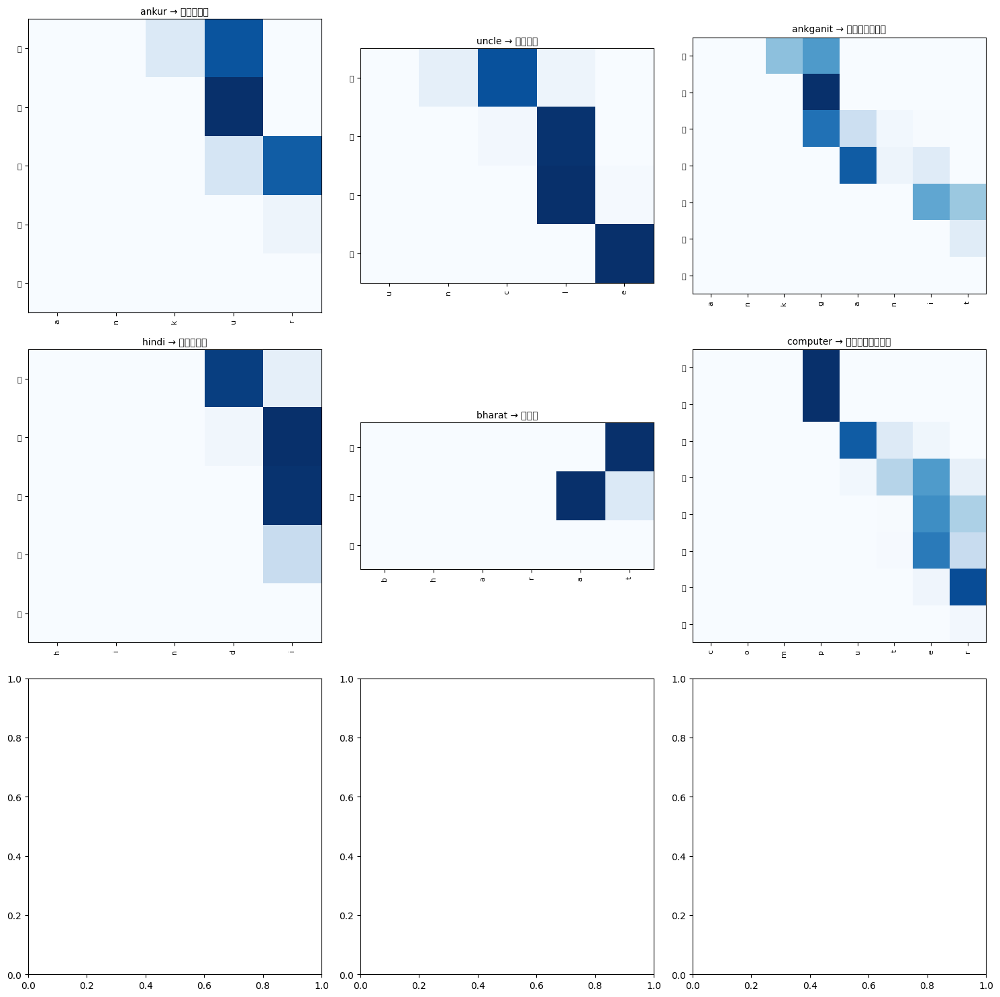

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2344 (\N{DEVANAGARI LETTER NA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2360 (\N{DEVANAGARI LETTER SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2350 (\N{DEVANAGARI LETTER MA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


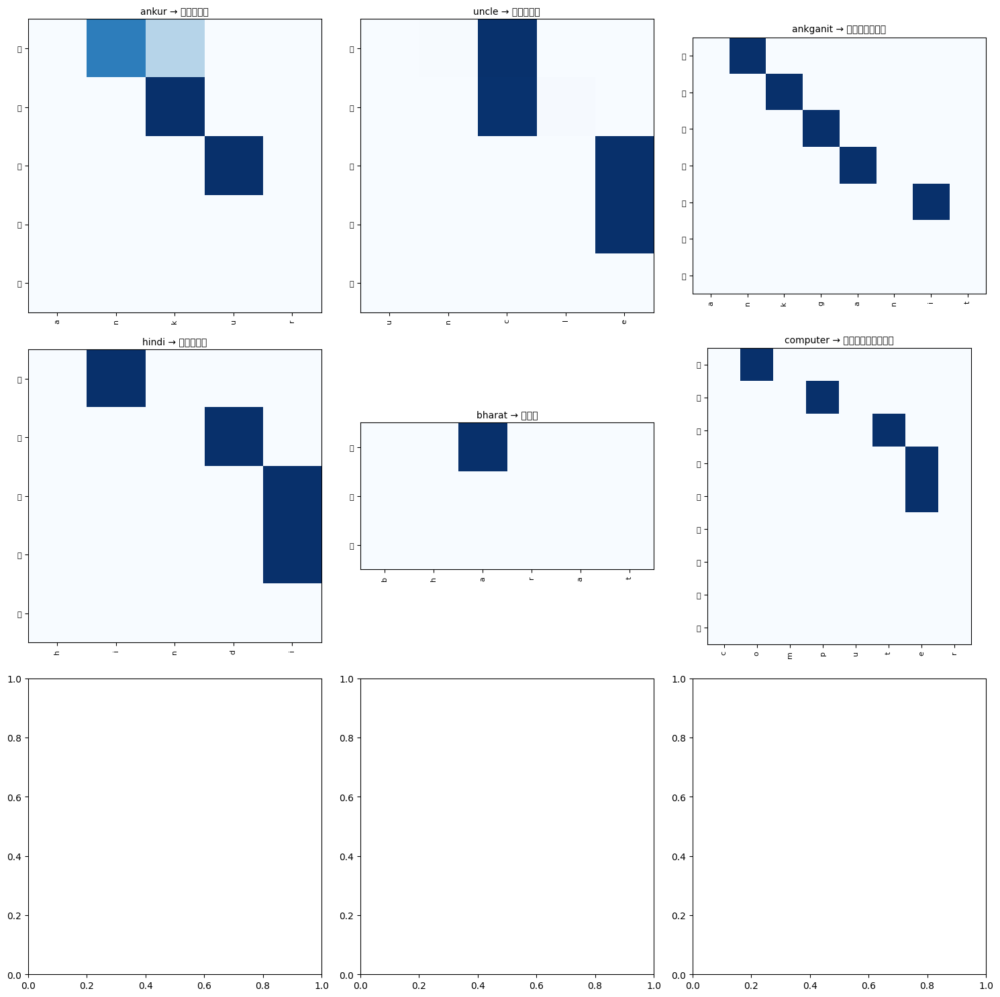

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2375 (\N{DEVANAGARI VOWEL SIGN E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2337 (\N{DEVANAGARI LETTER DDA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2364 (\N{DEVANAGARI SIGN NUKTA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


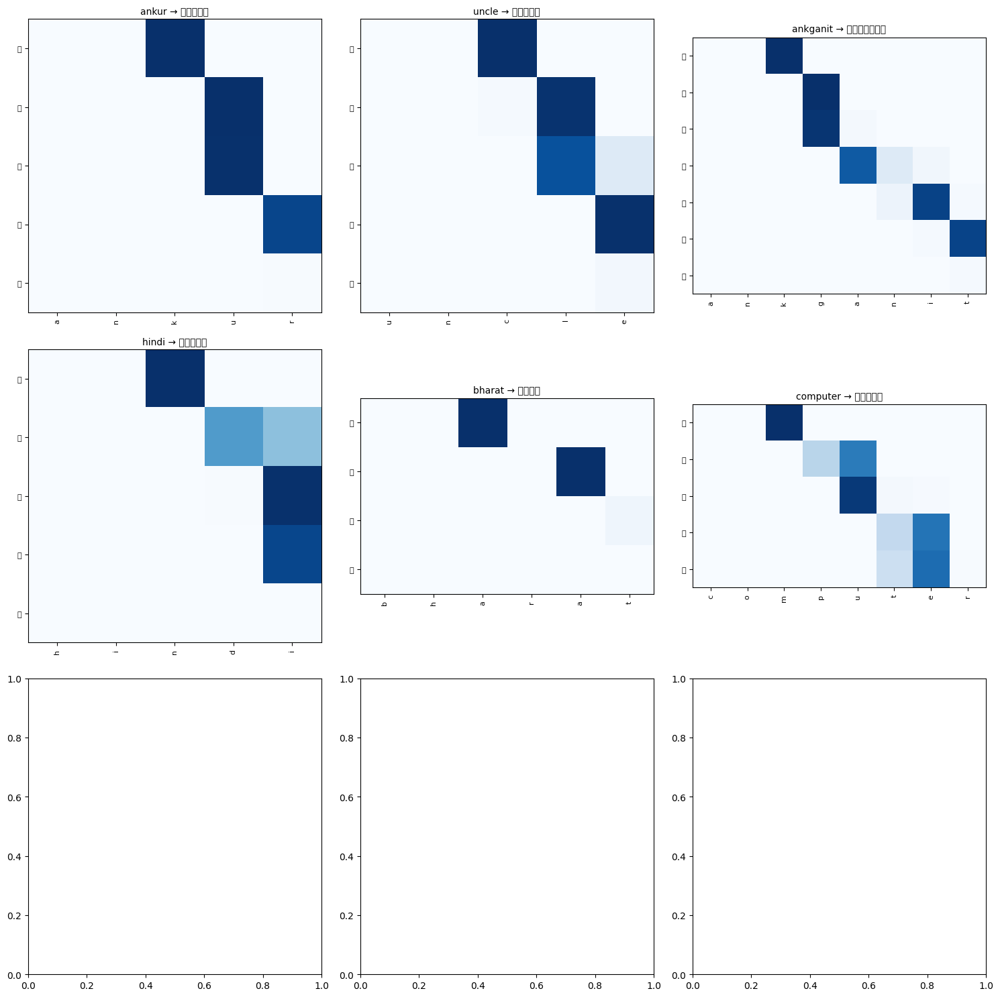

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2379 (\N{DEVANAGARI VOWEL SIGN O}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


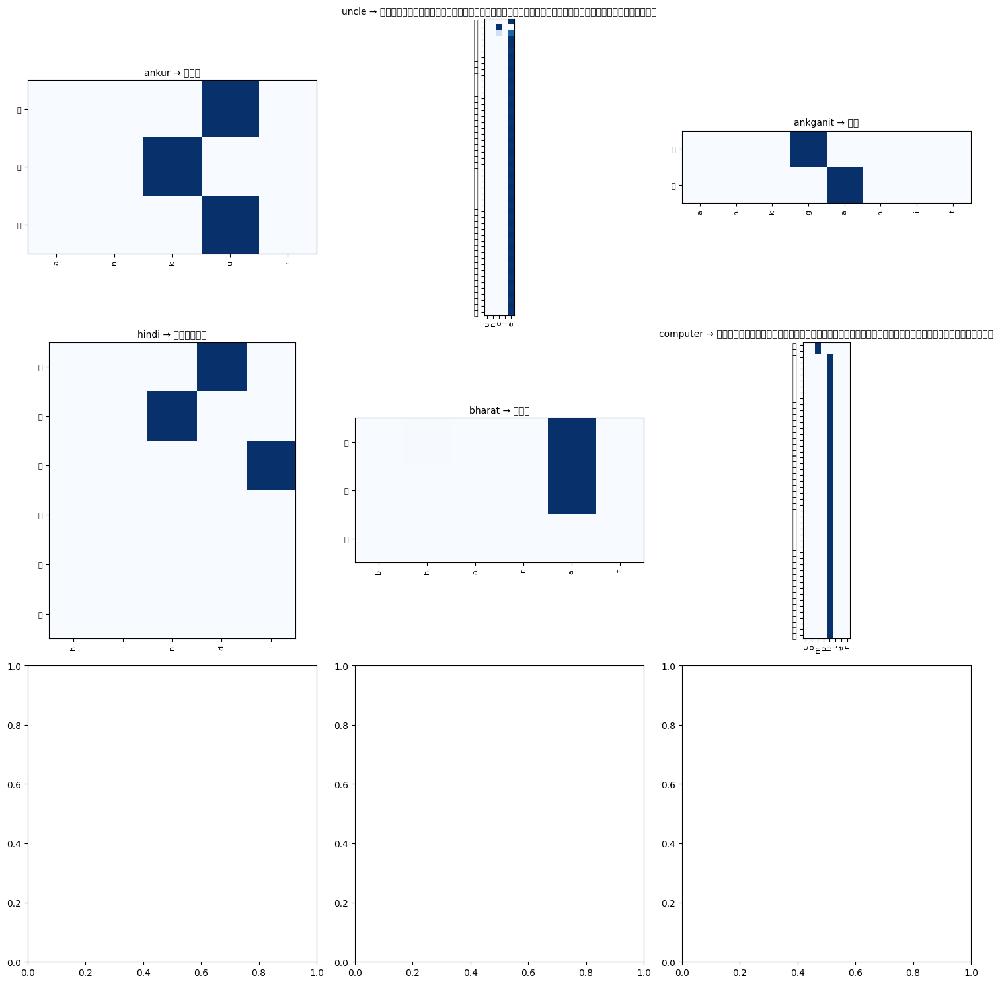

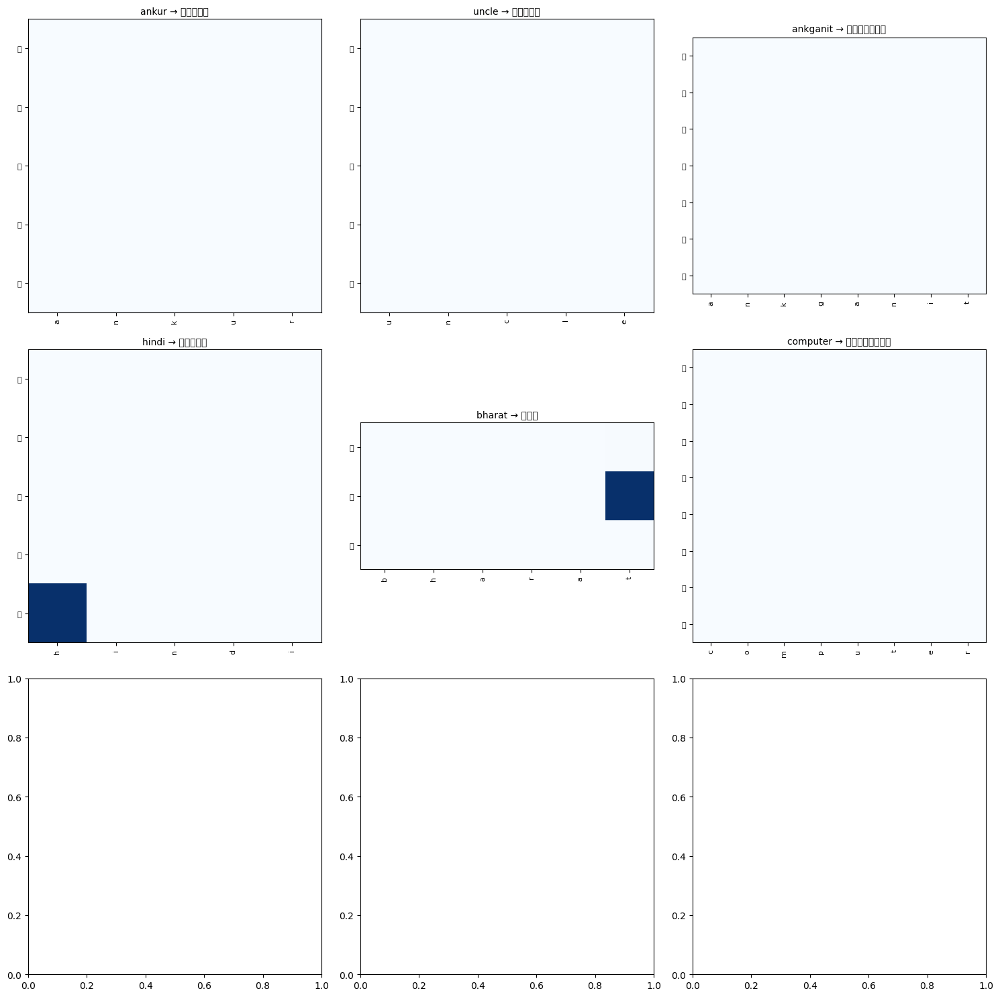

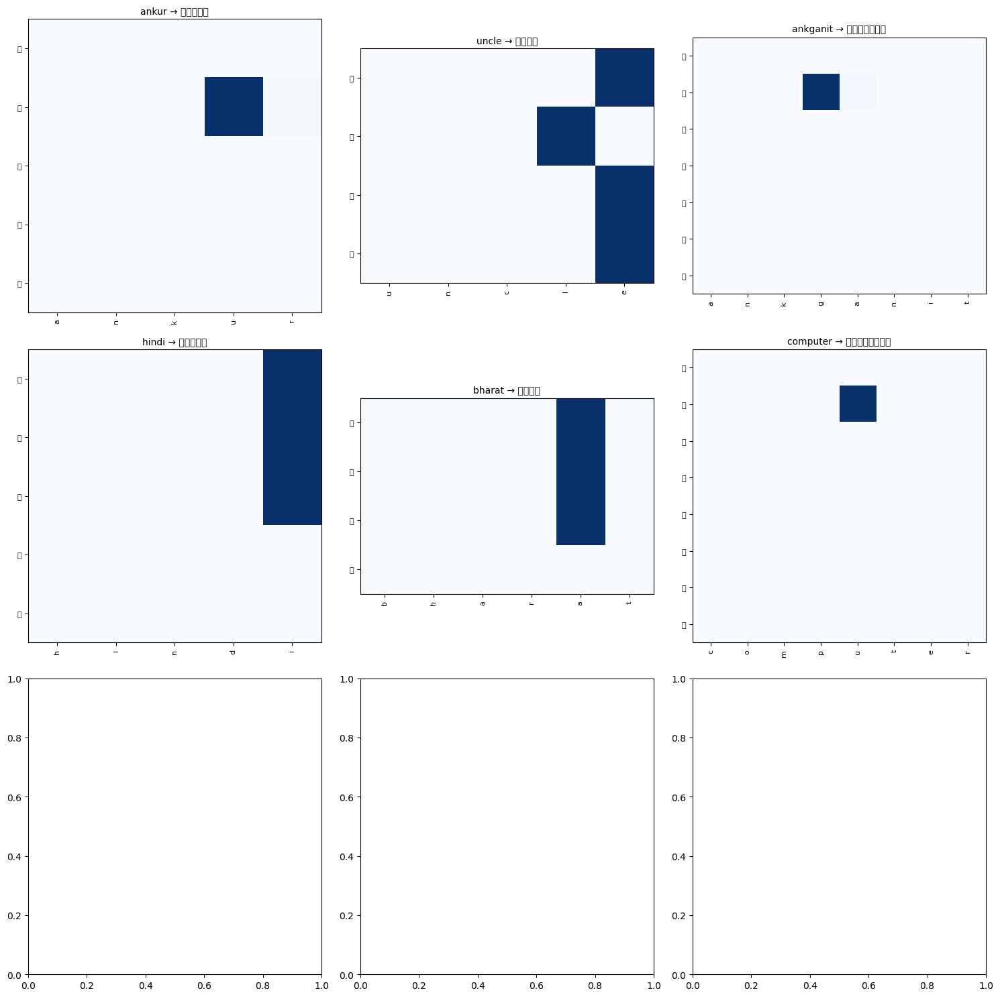

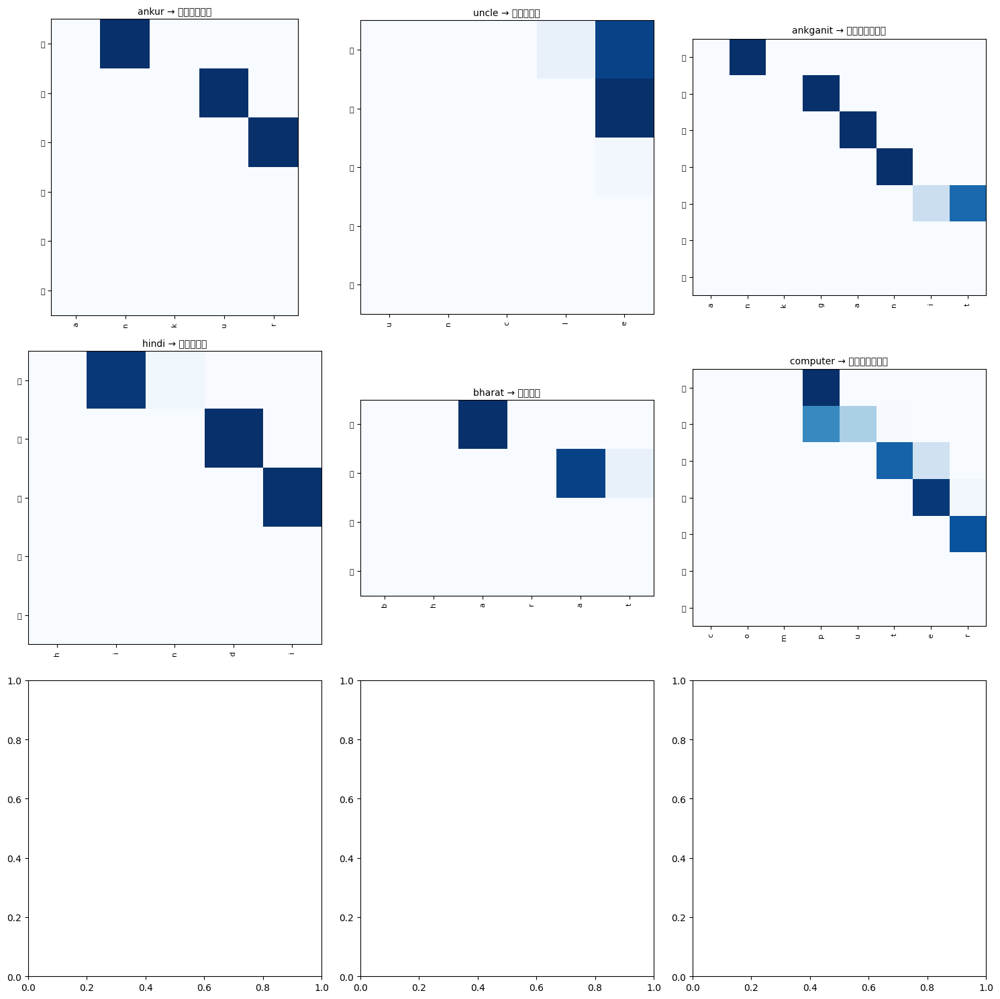

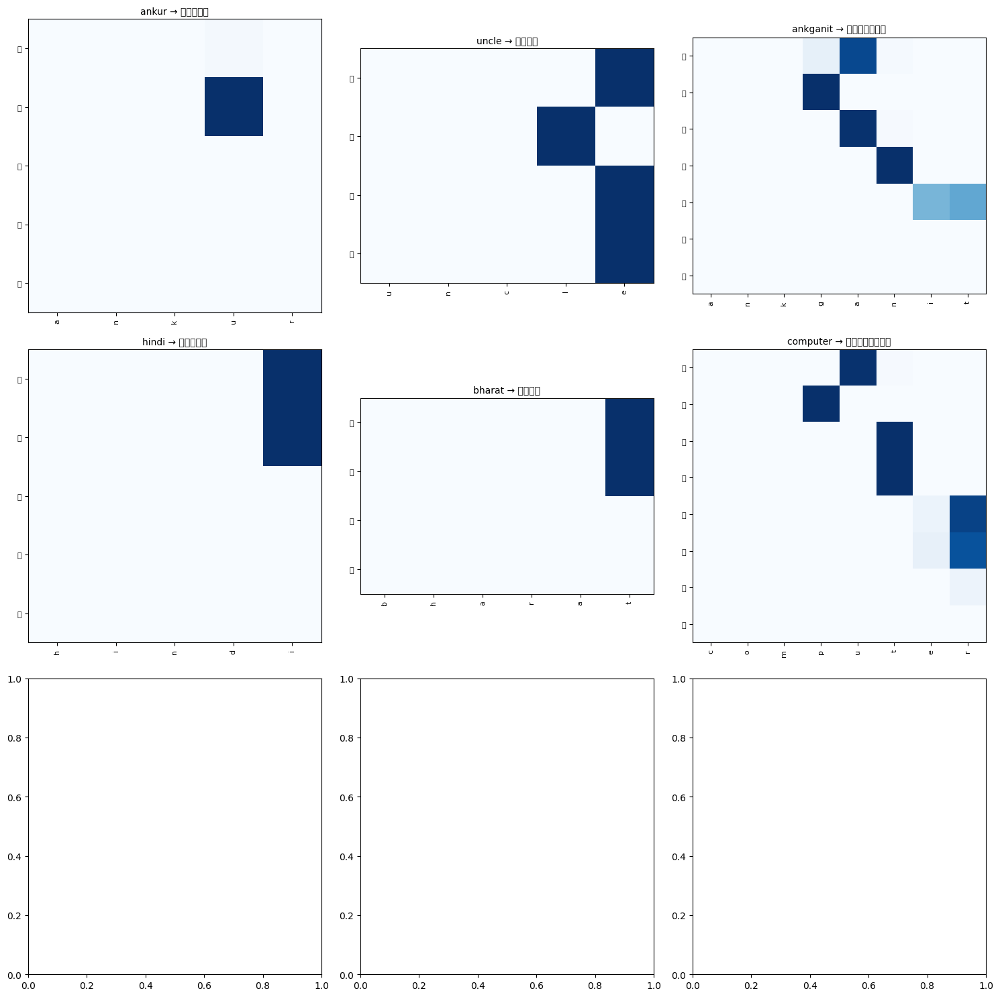

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2313 (\N{DEVANAGARI LETTER U}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


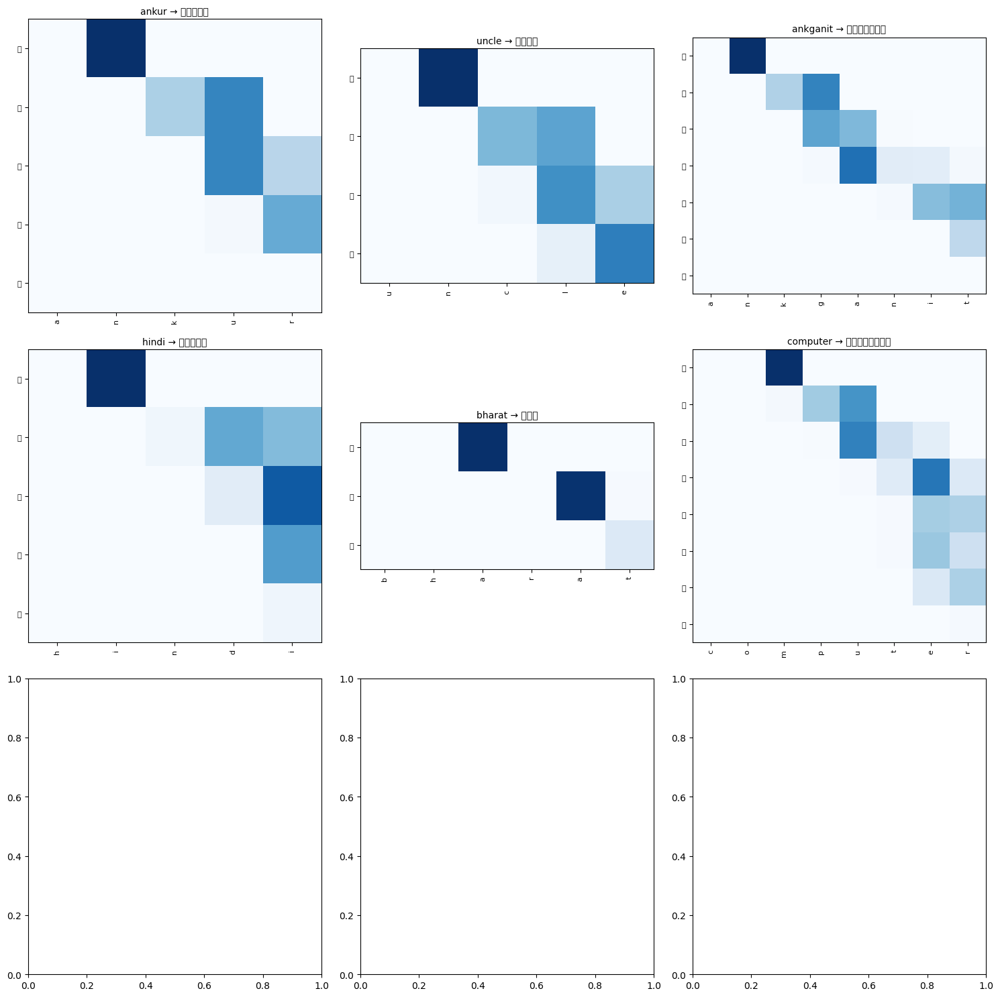

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2343 (\N{DEVANAGARI LETTER DHA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


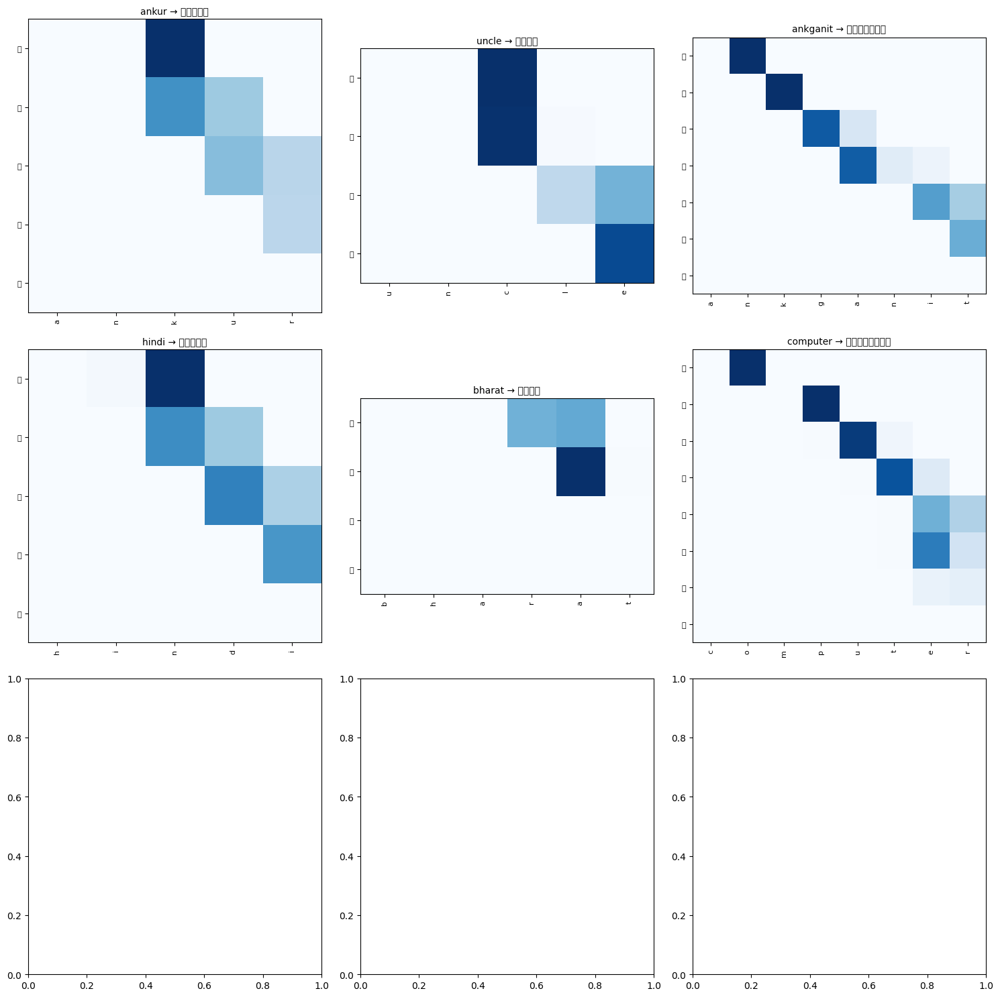

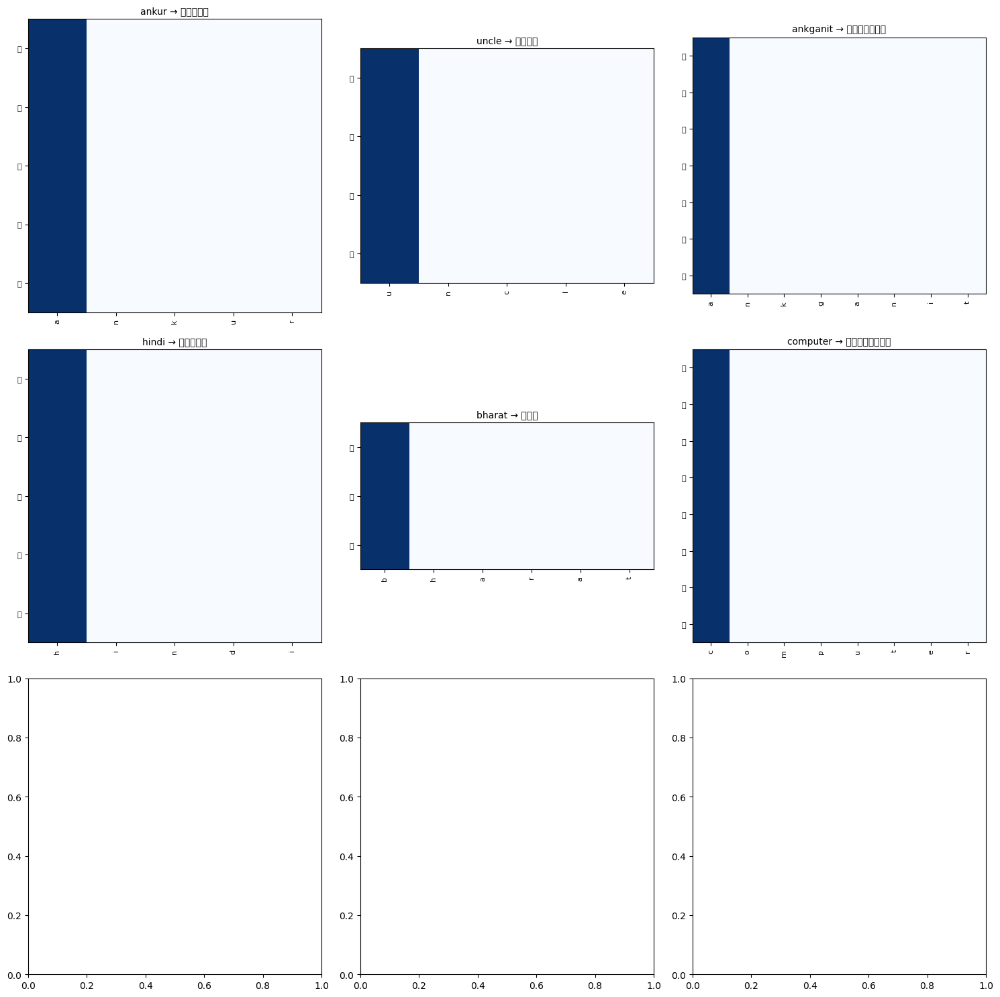

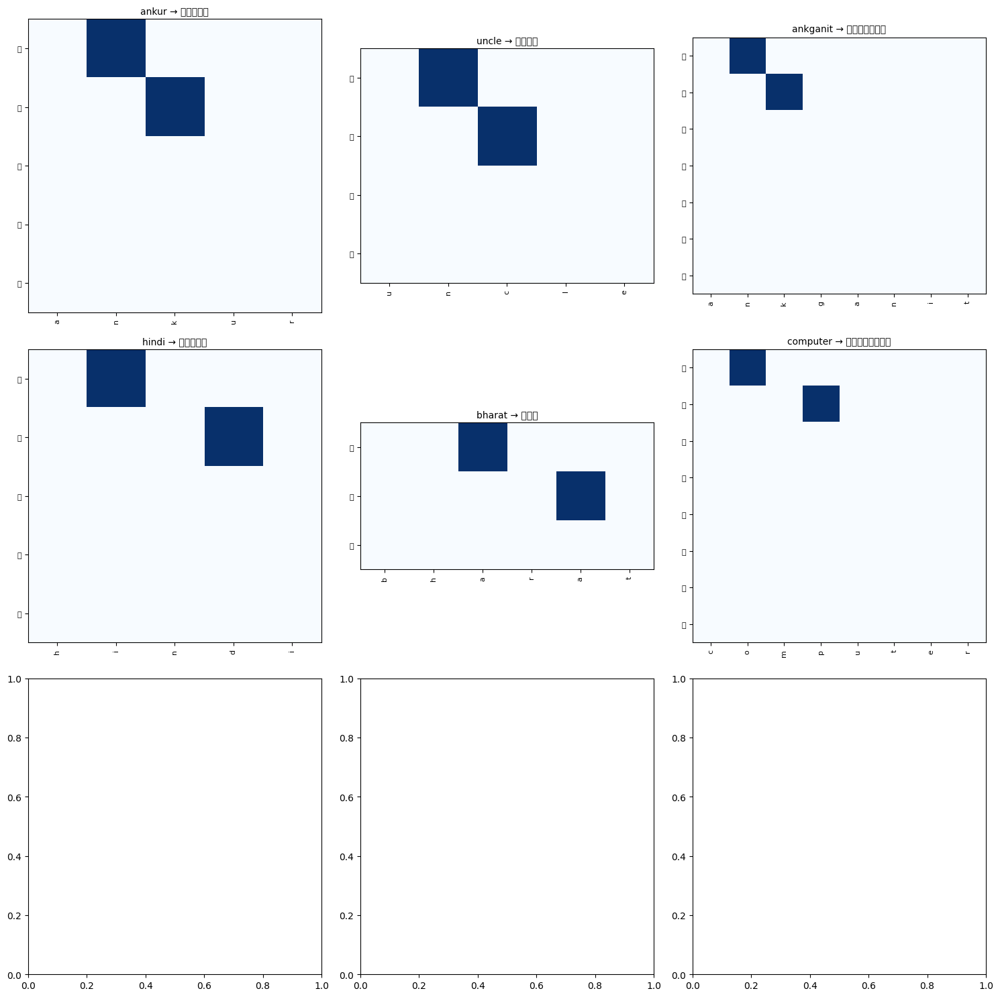

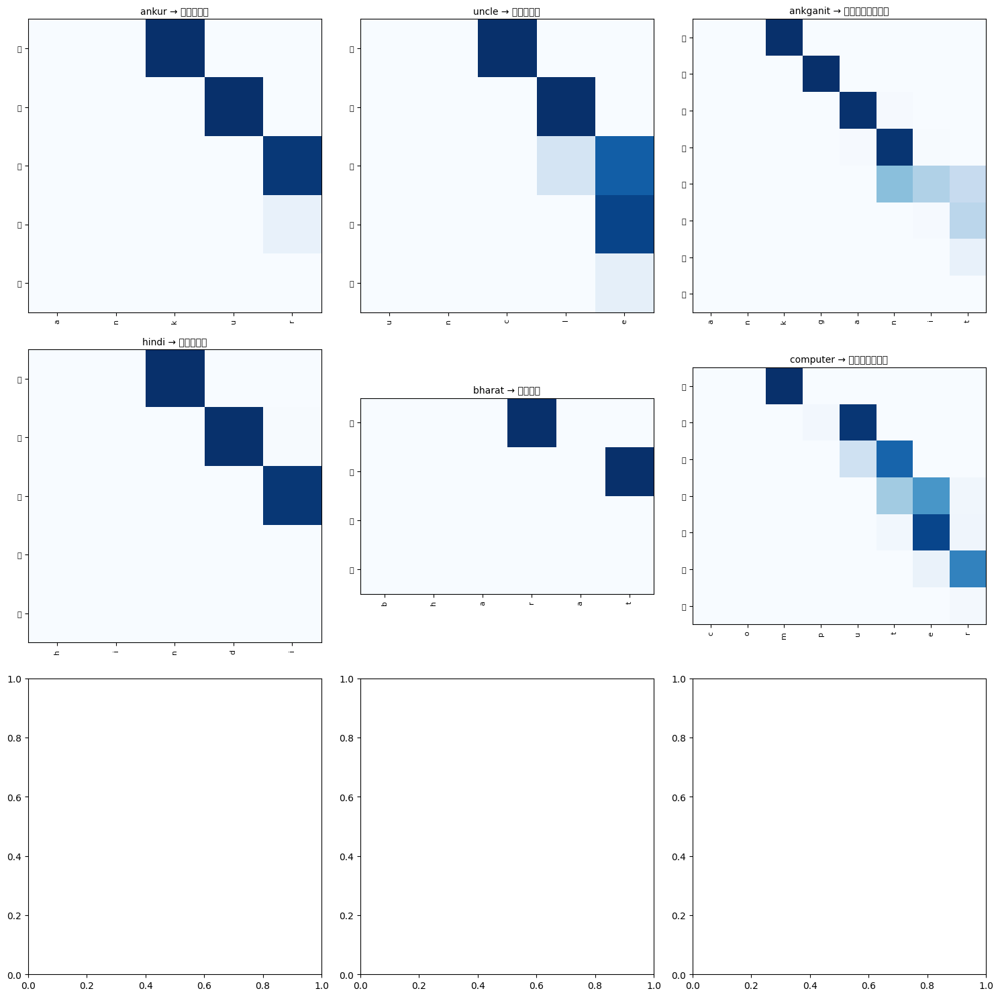

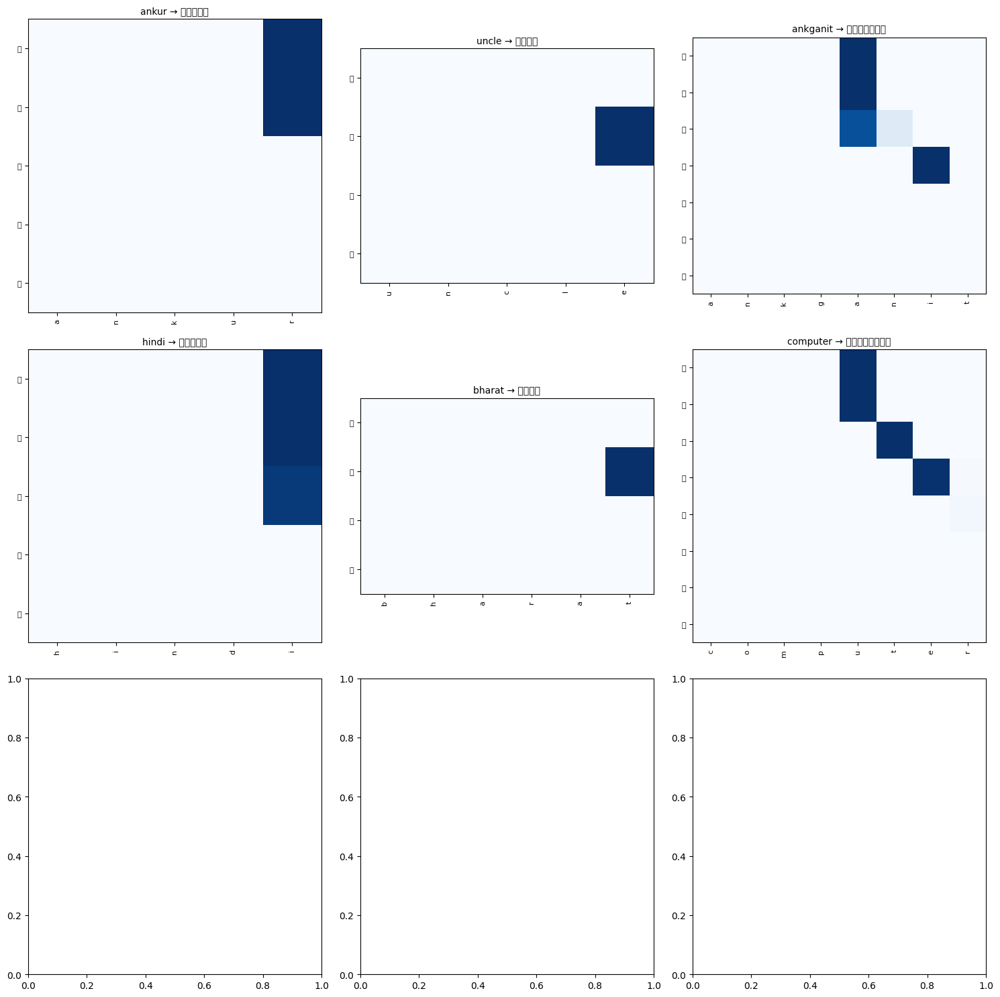

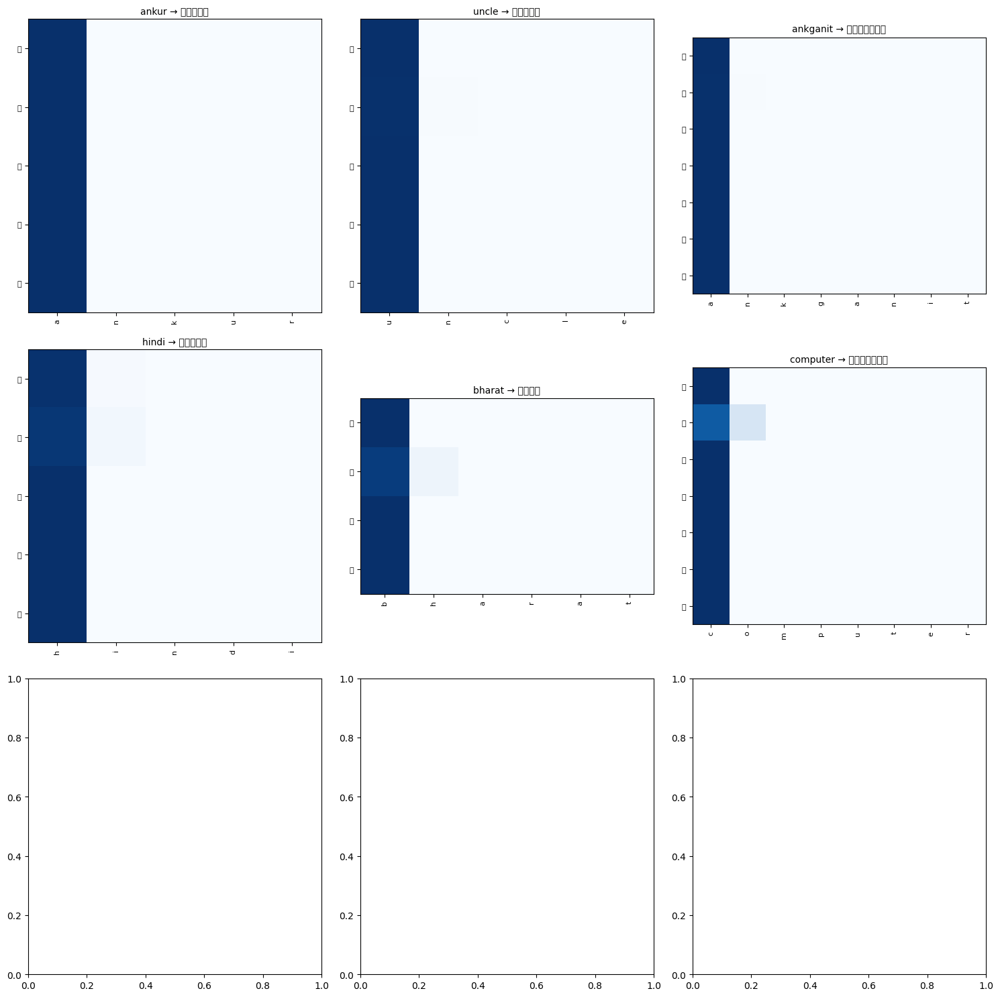

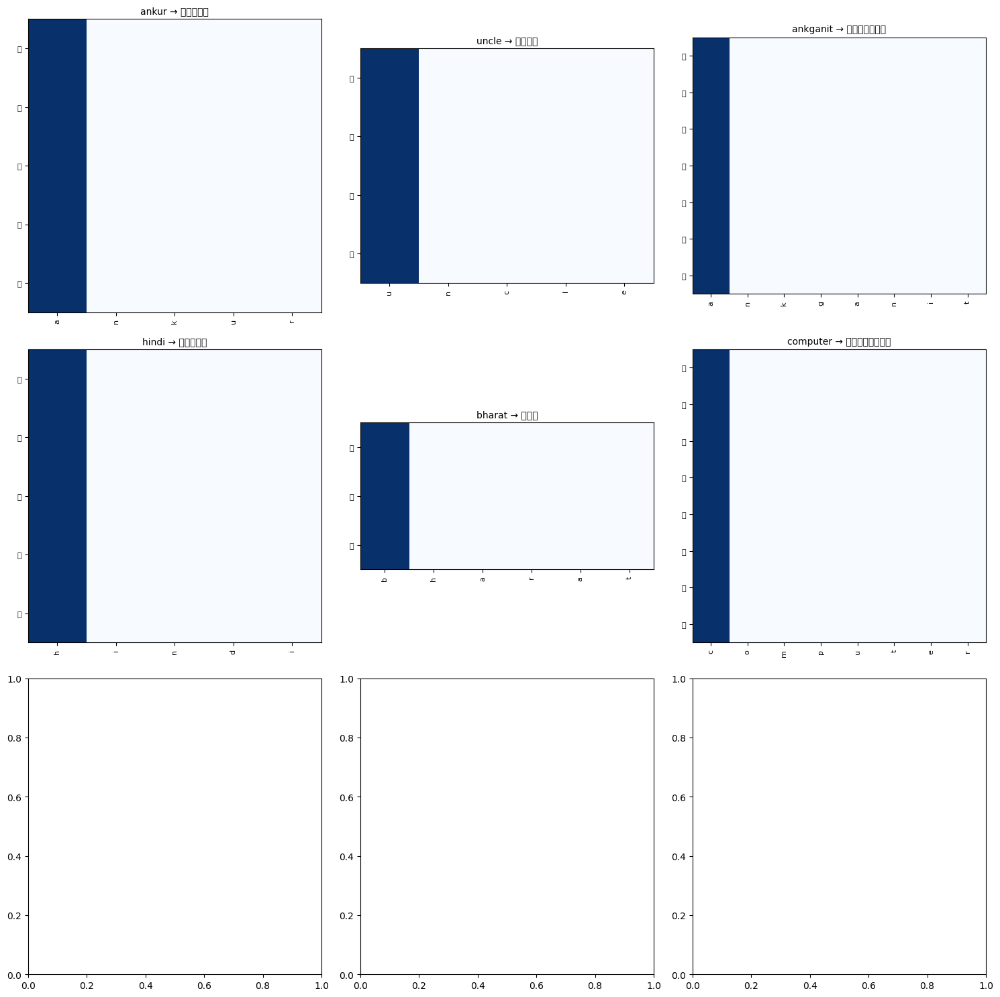

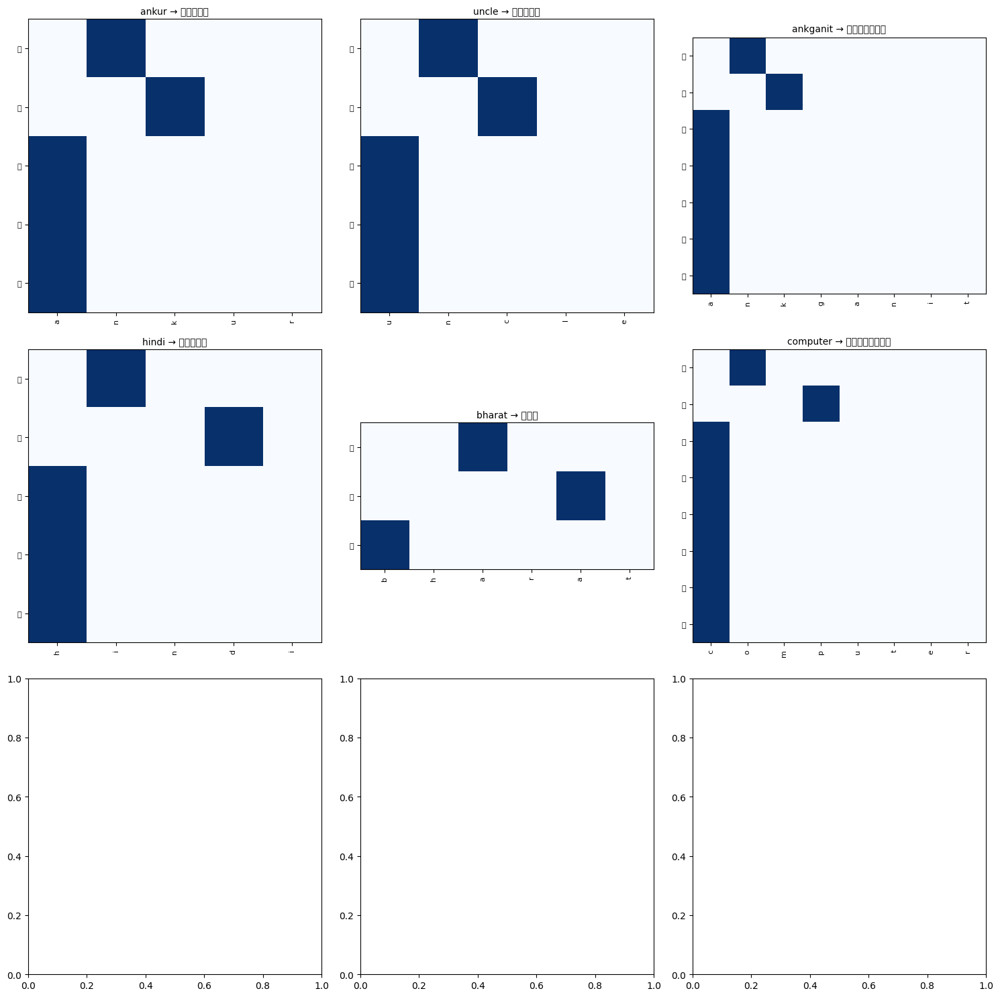

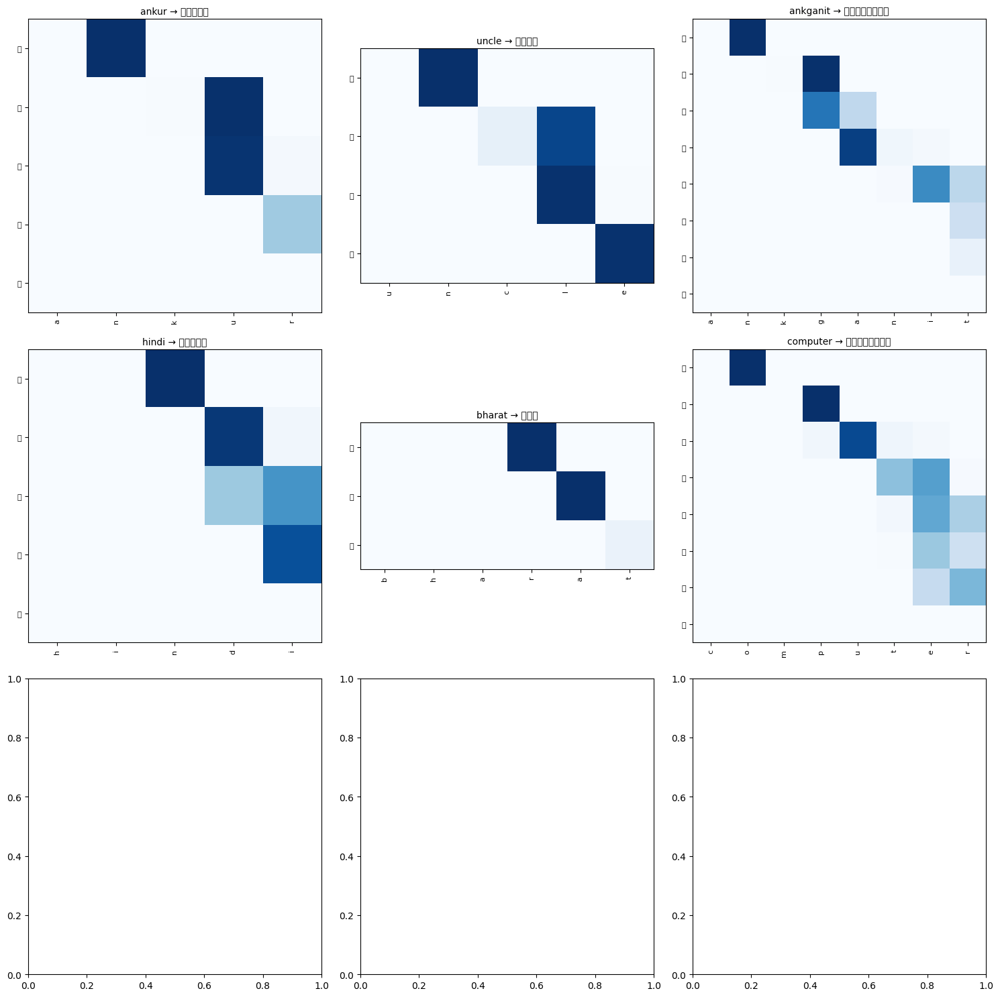

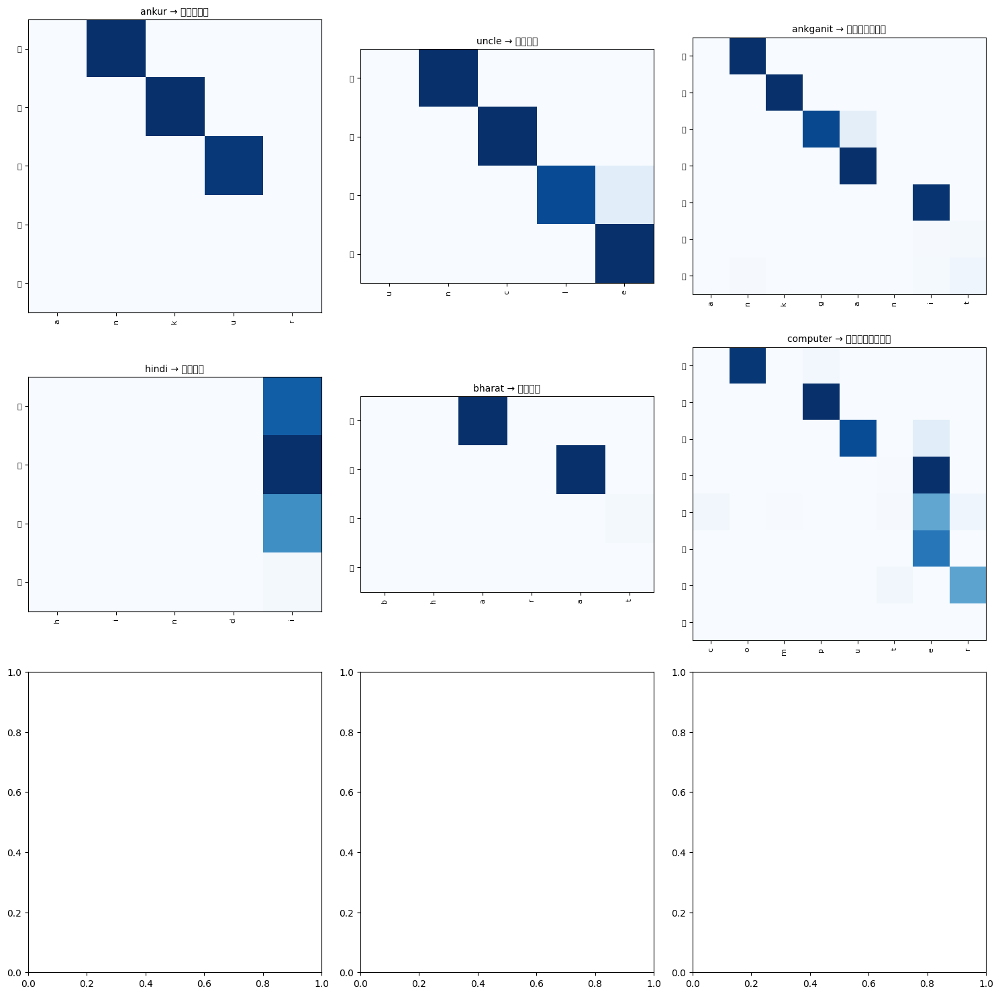

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2359 (\N{DEVANAGARI LETTER SSA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2305 (\N{DEVANAGARI SIGN CANDRABINDU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


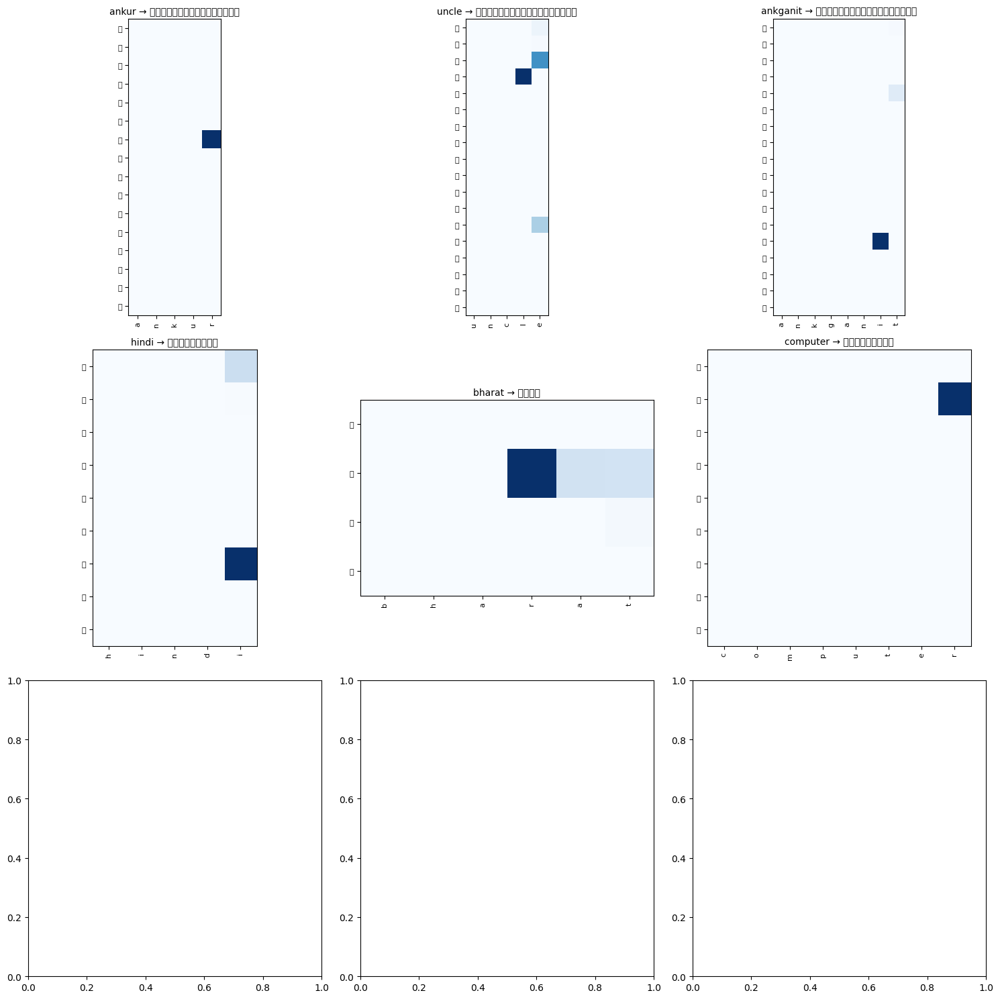

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2377 (\N{DEVANAGARI VOWEL SIGN CANDRA O}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


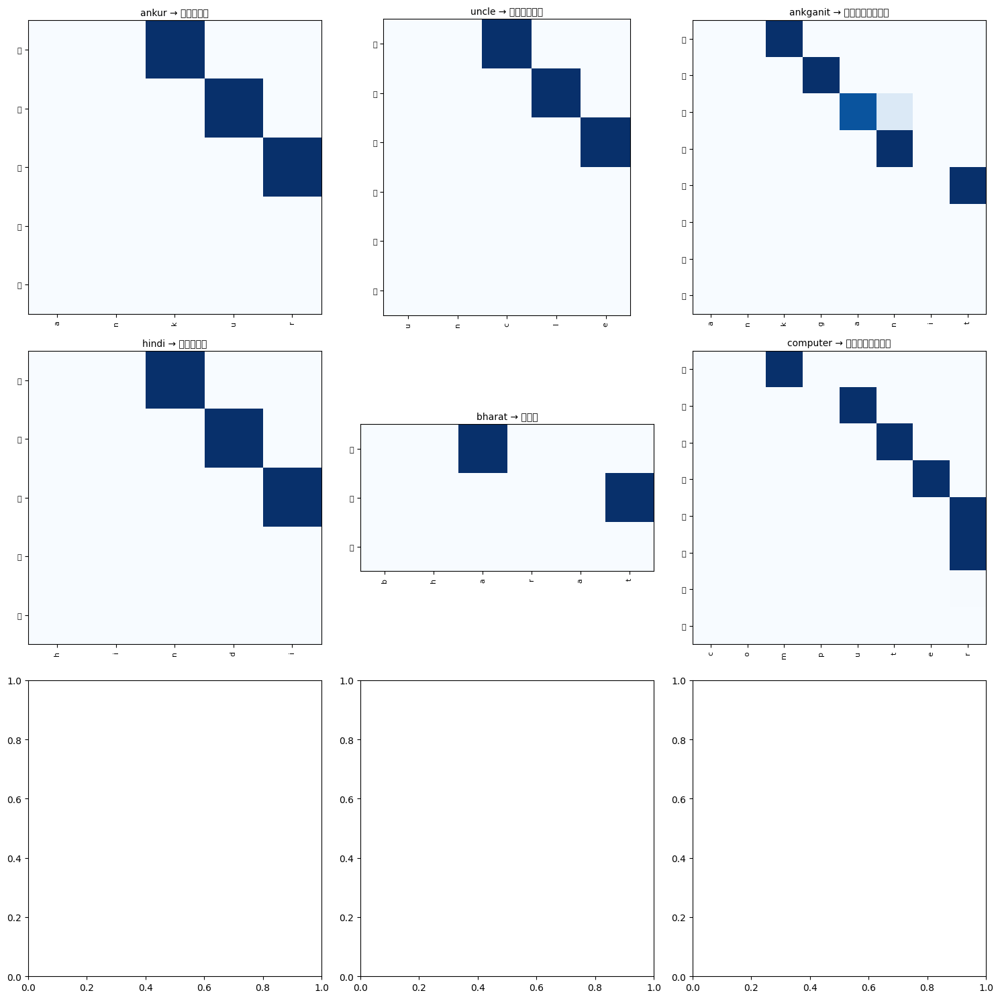

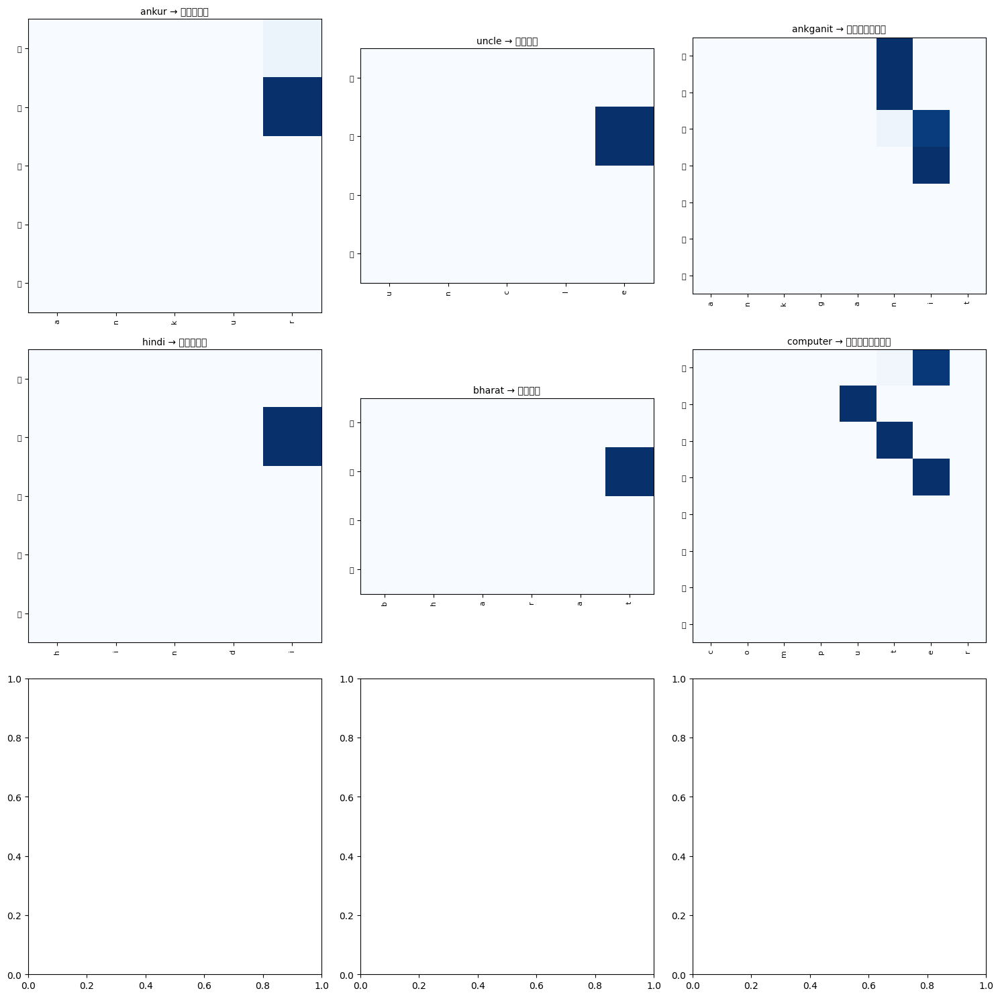

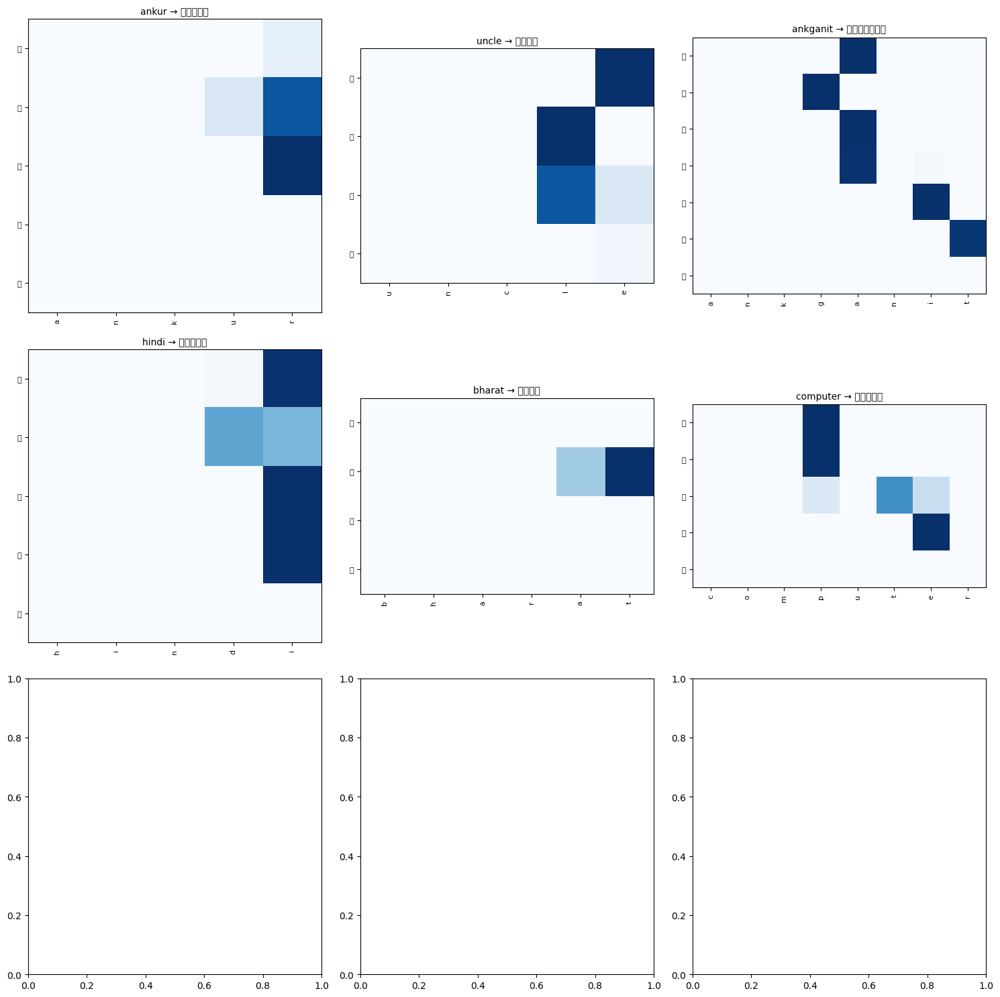

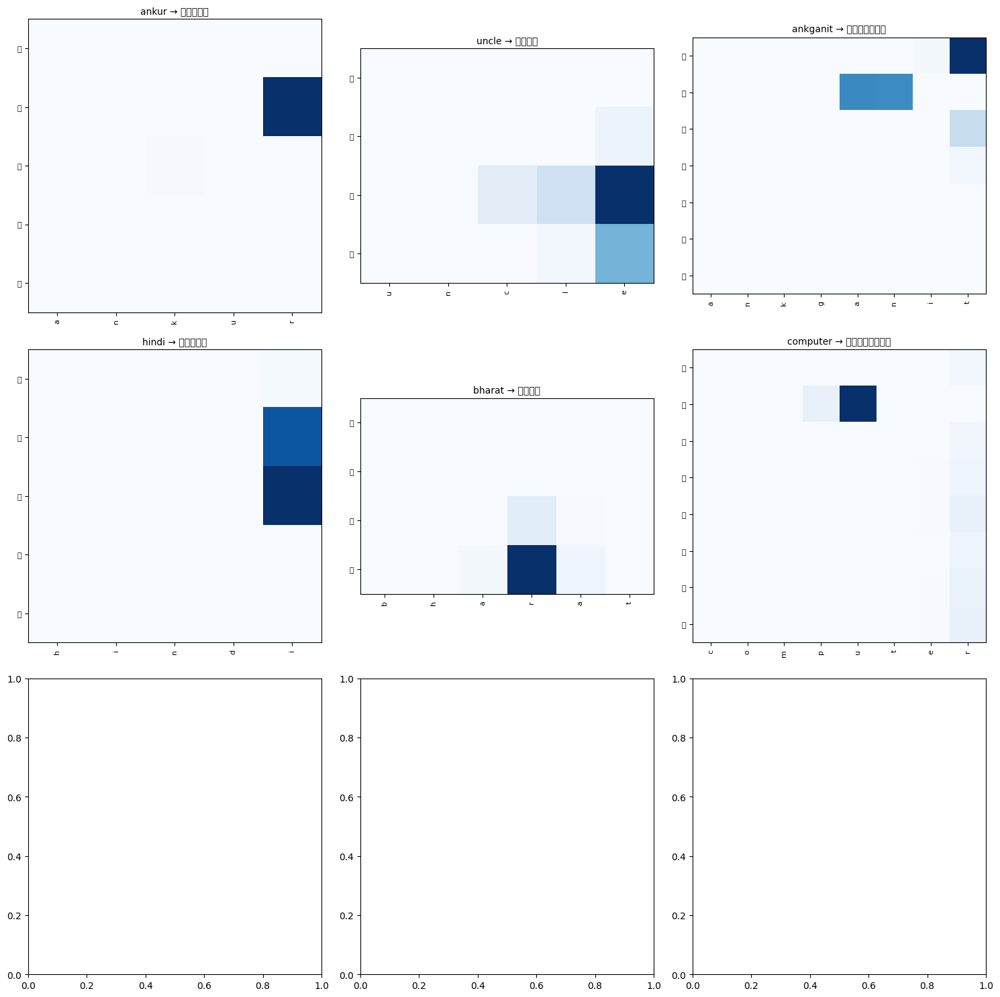

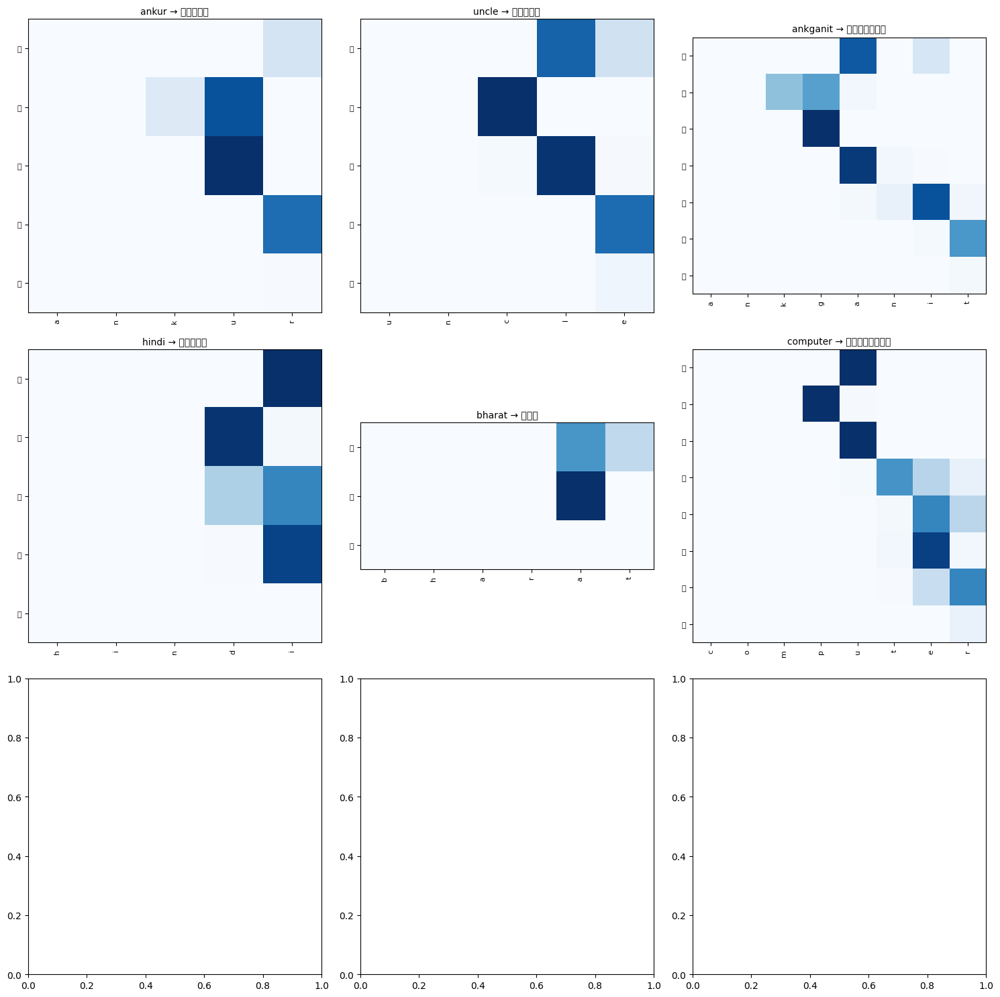

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2314 (\N{DEVANAGARI LETTER UU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


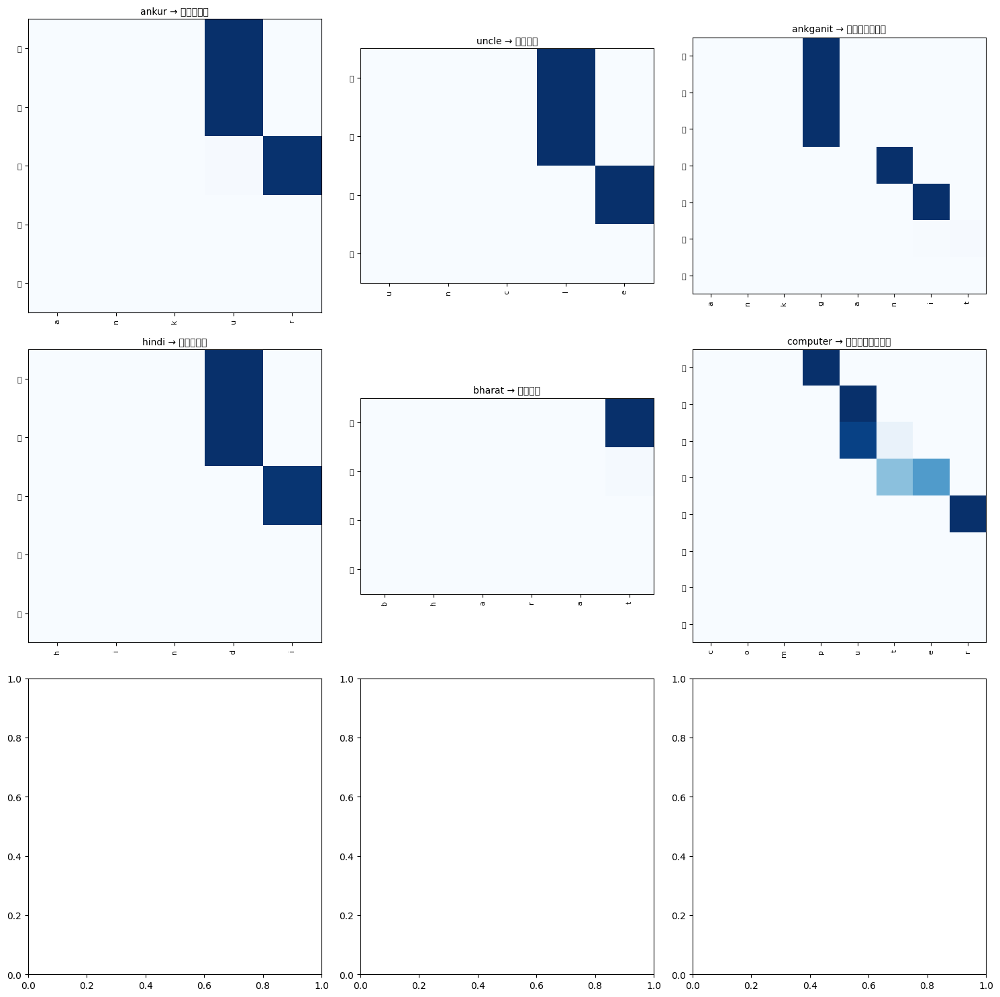

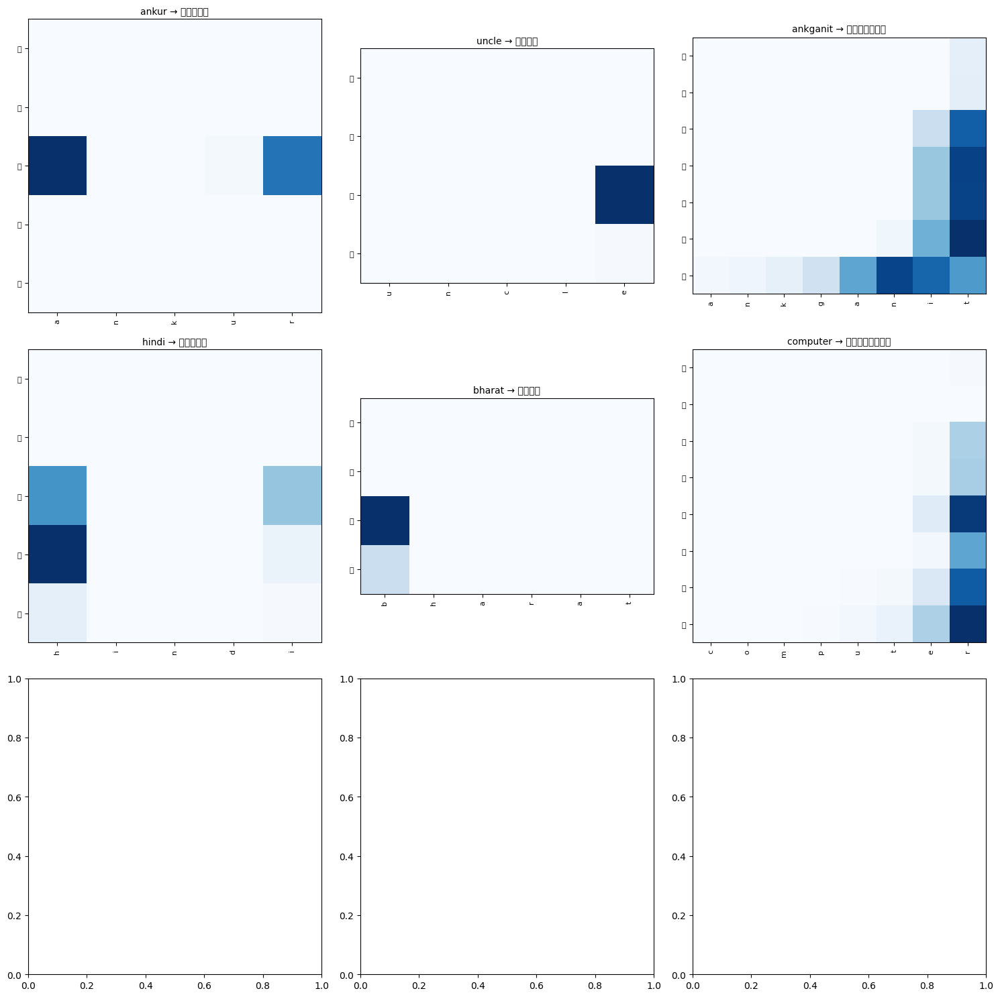

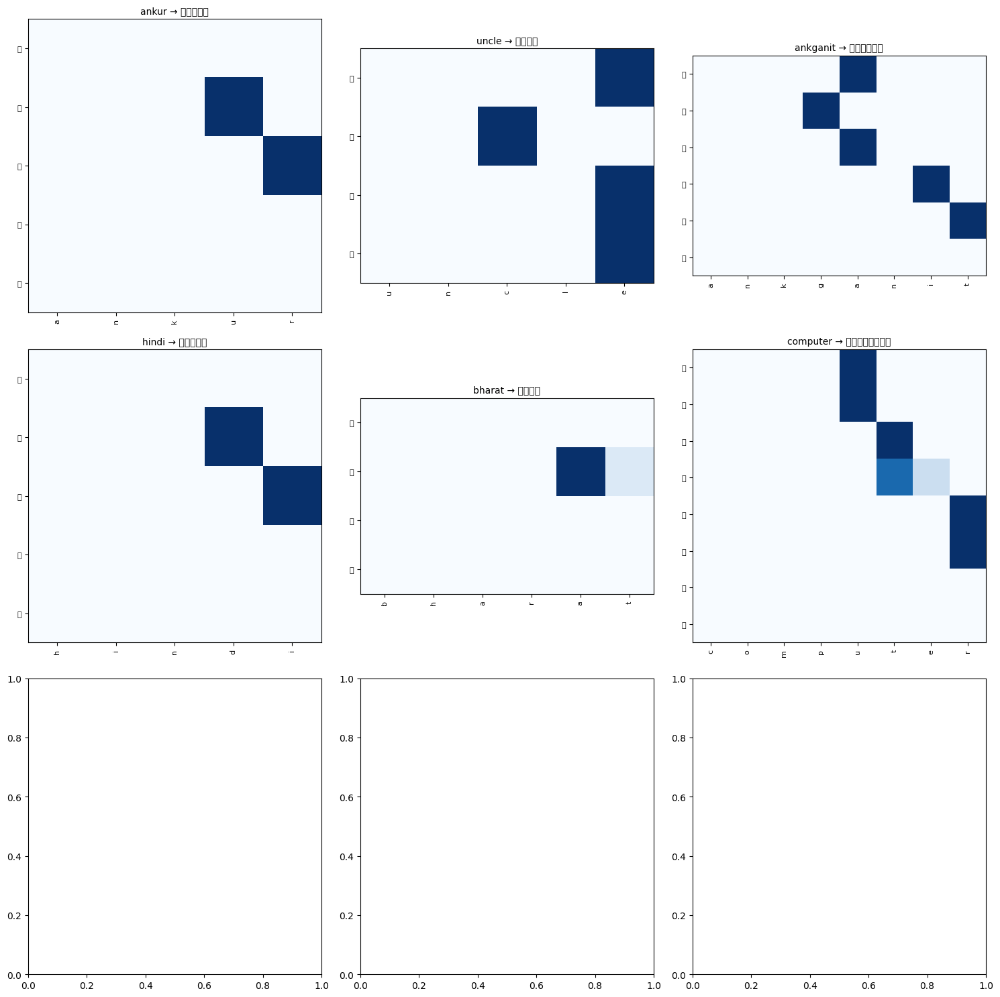

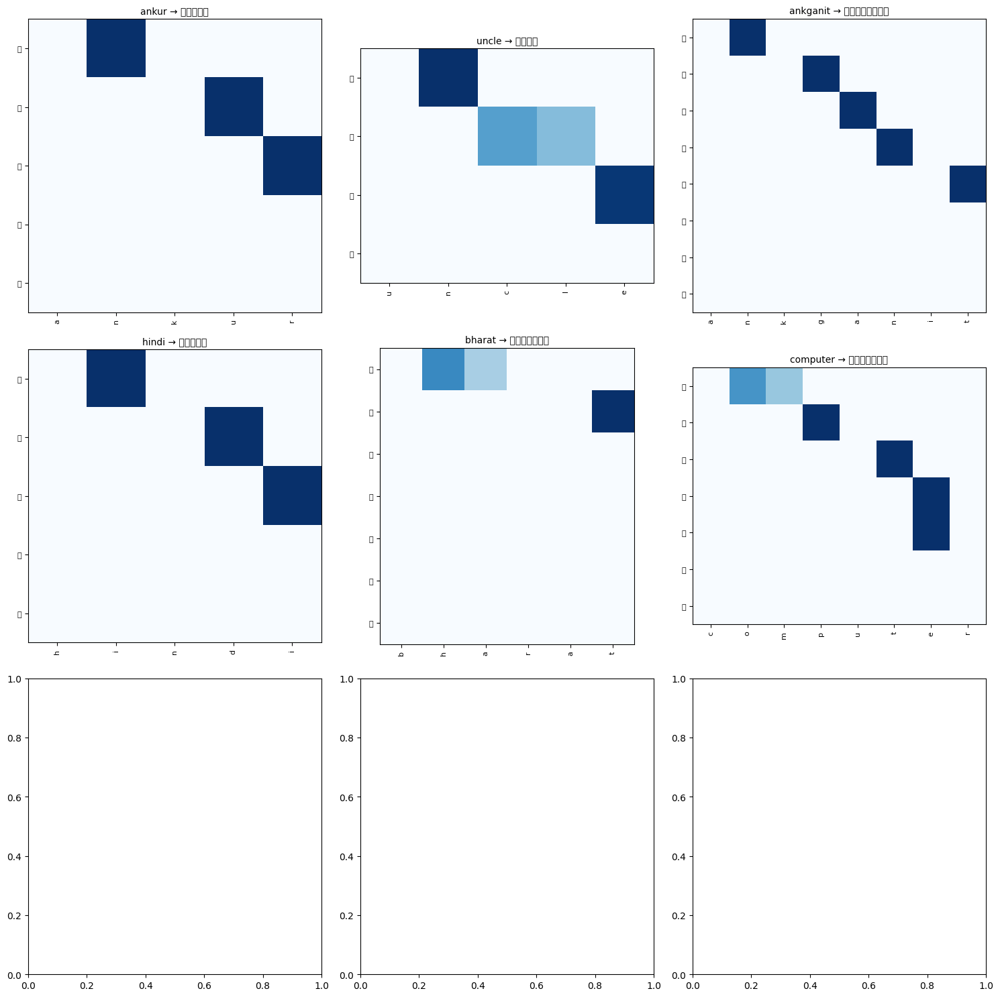

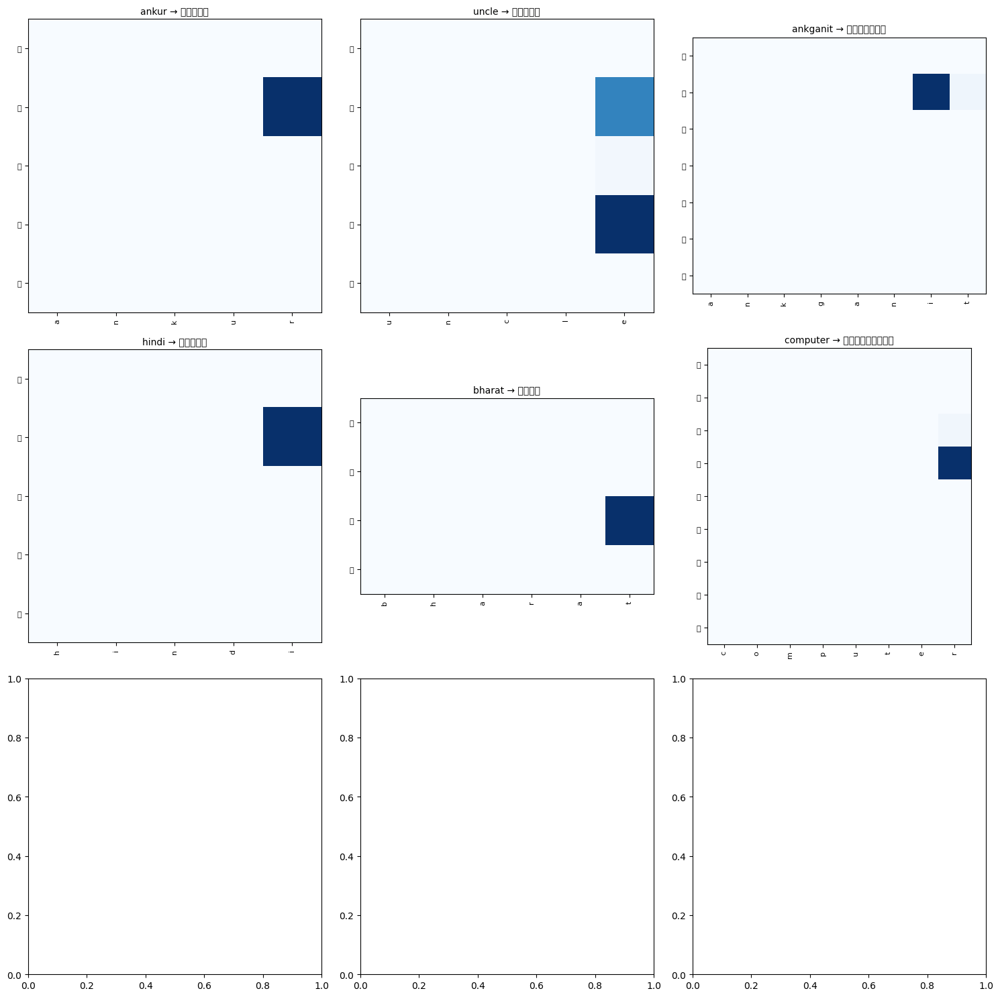

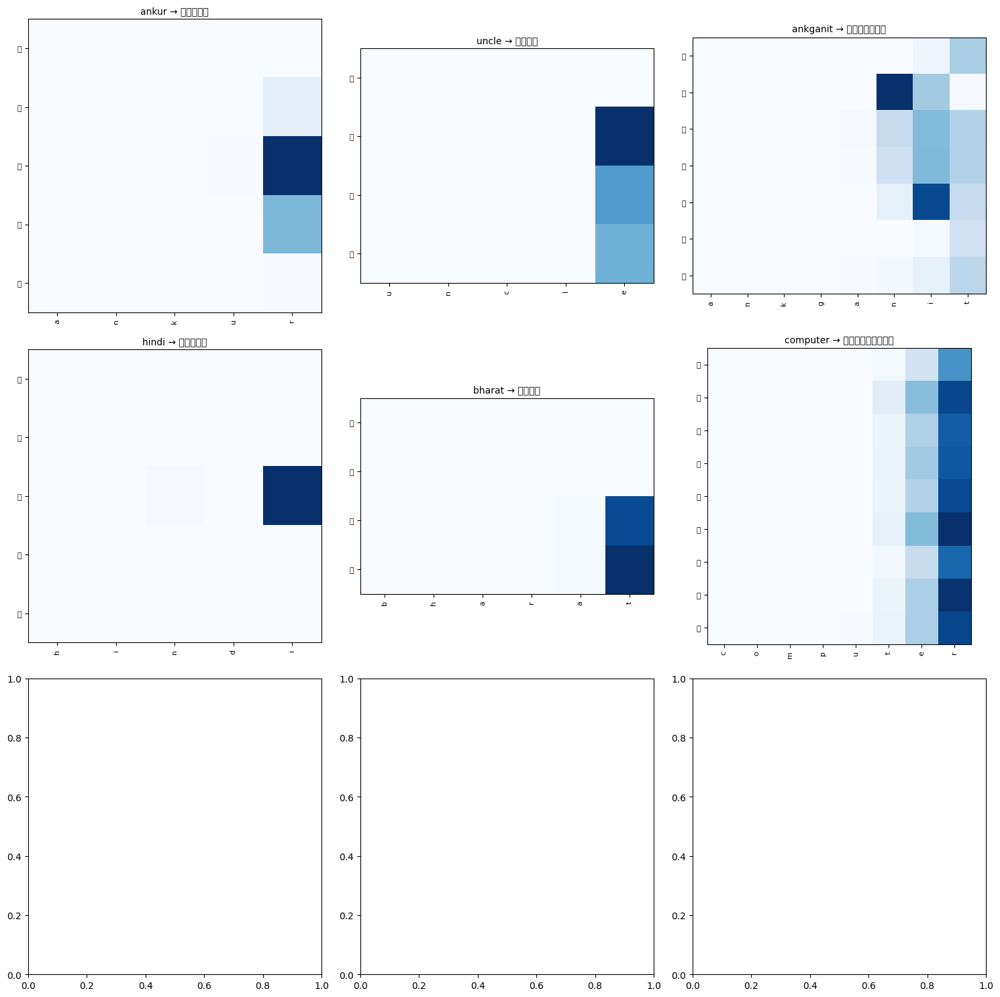

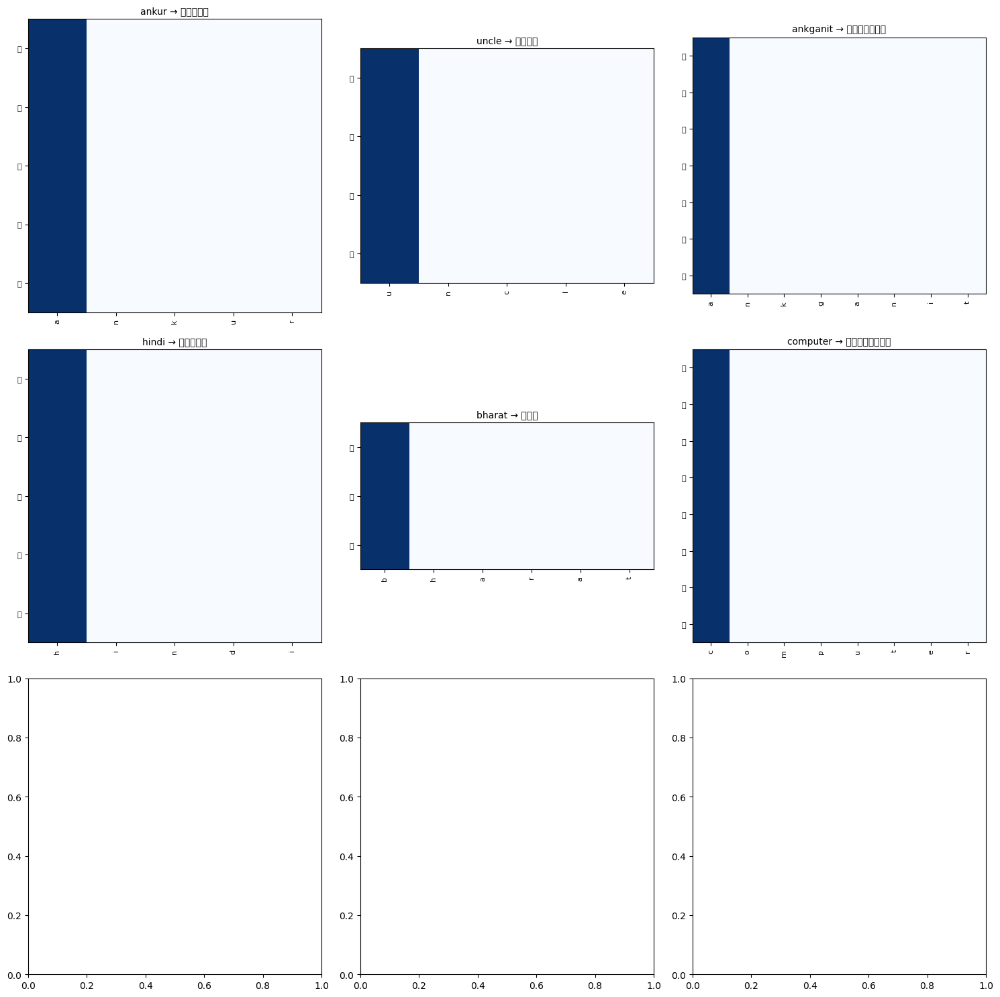

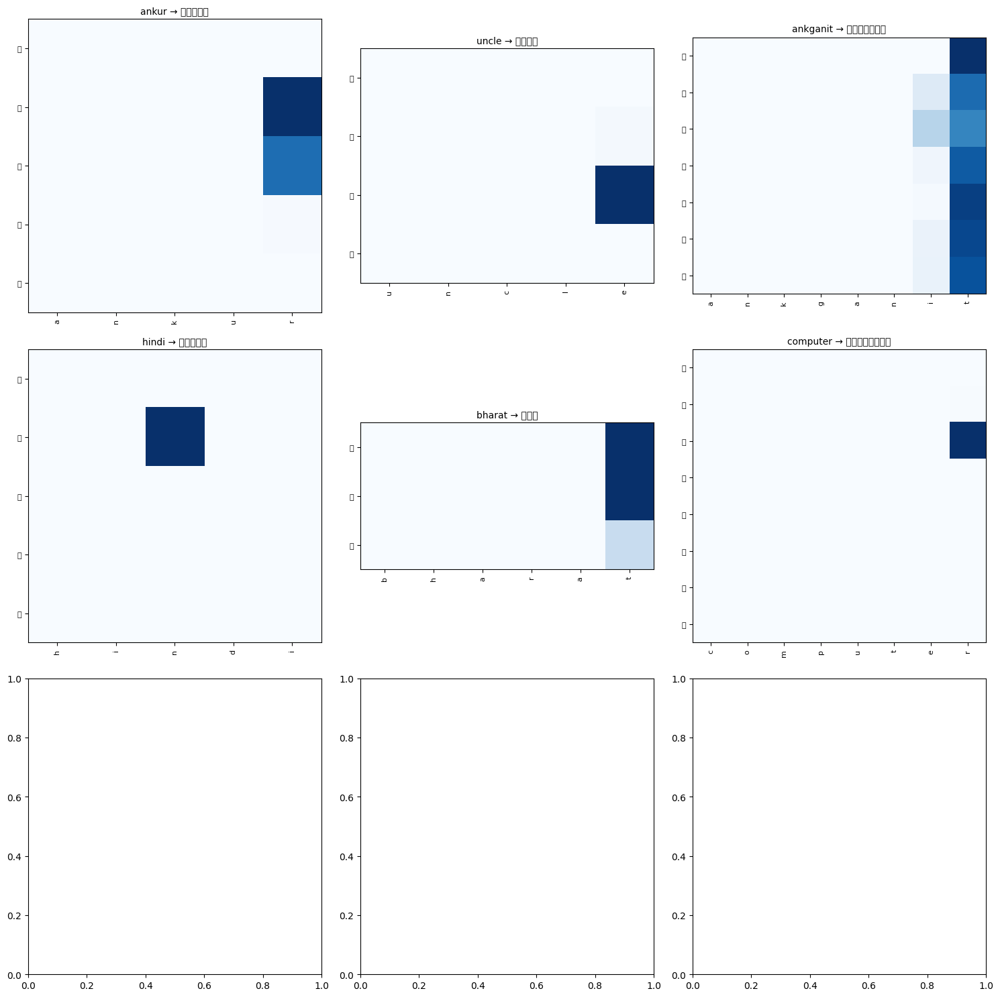

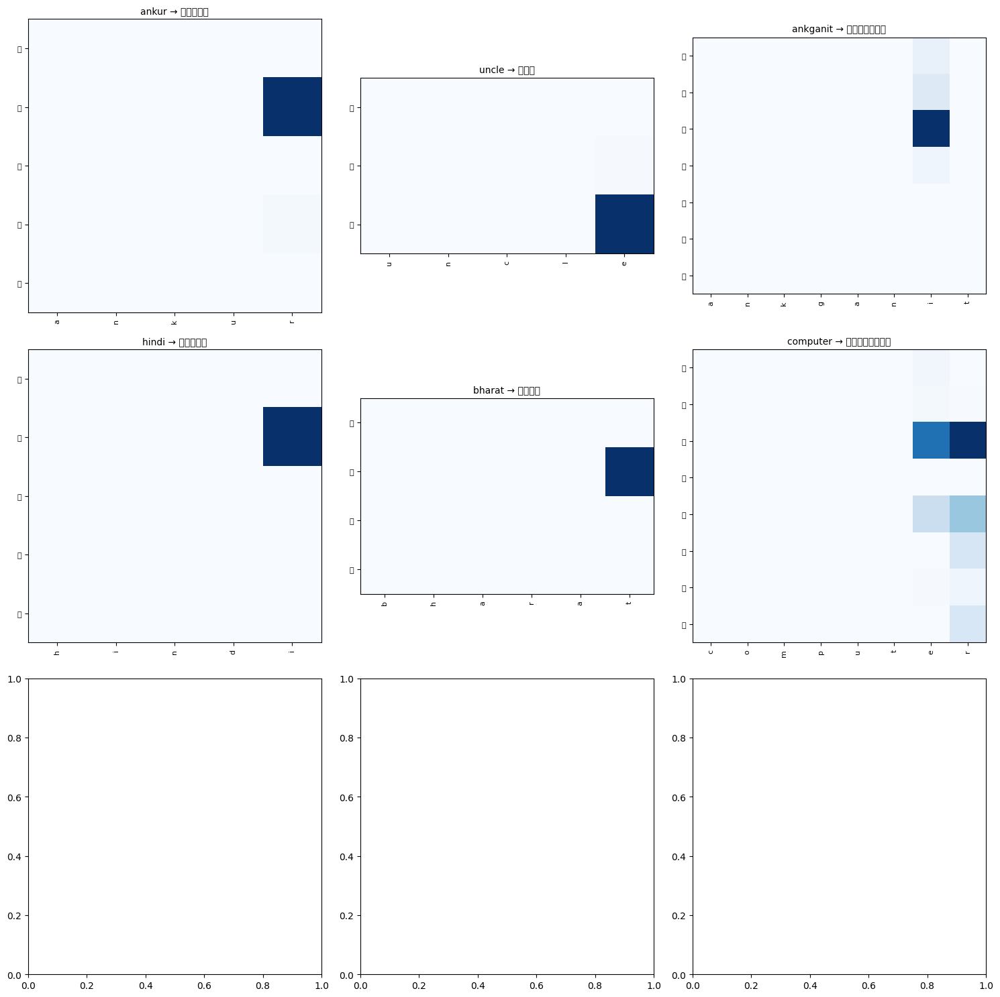

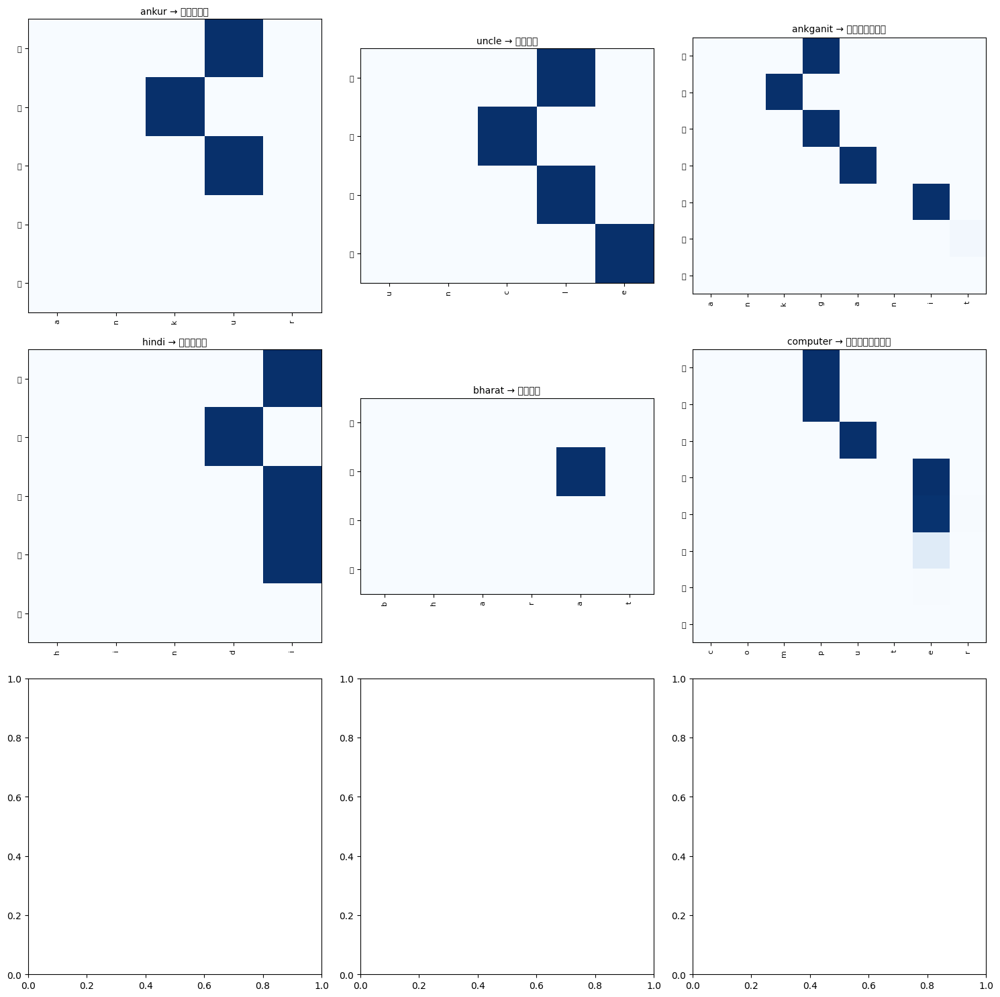

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2330 (\N{DEVANAGARI LETTER CA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


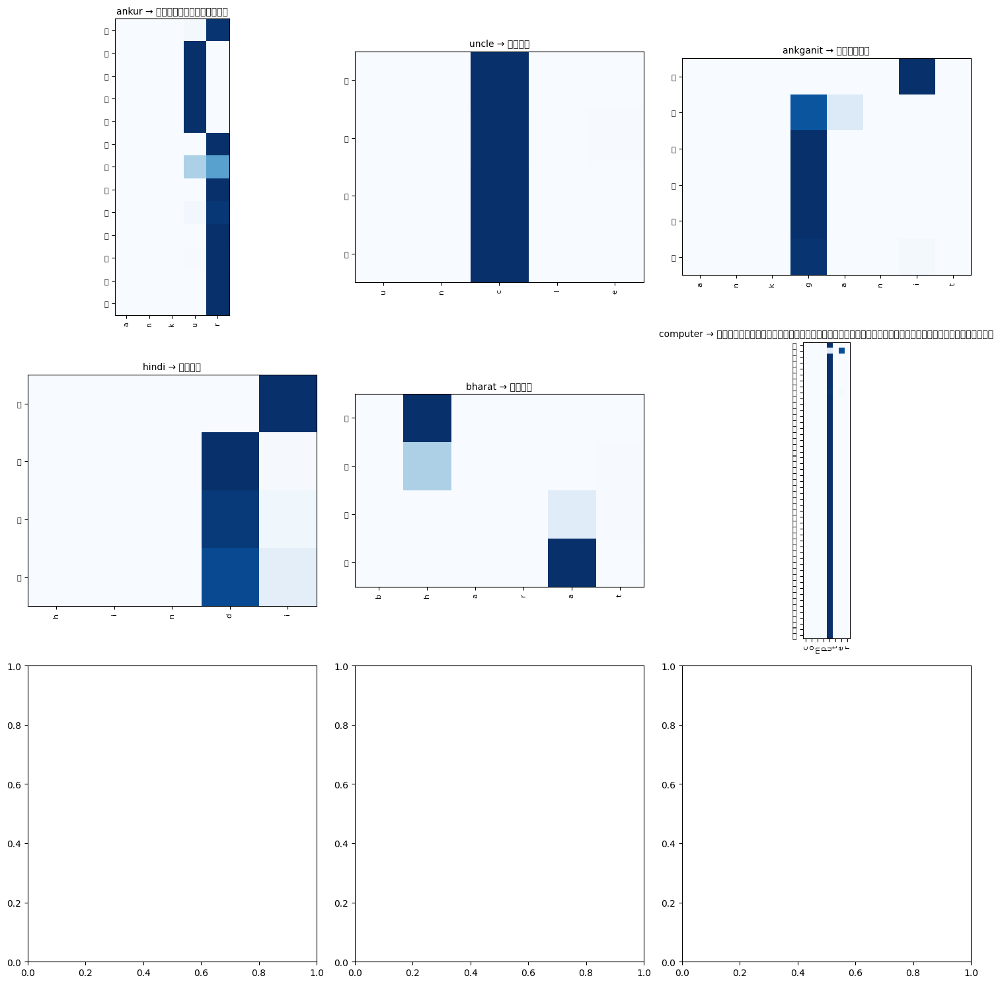

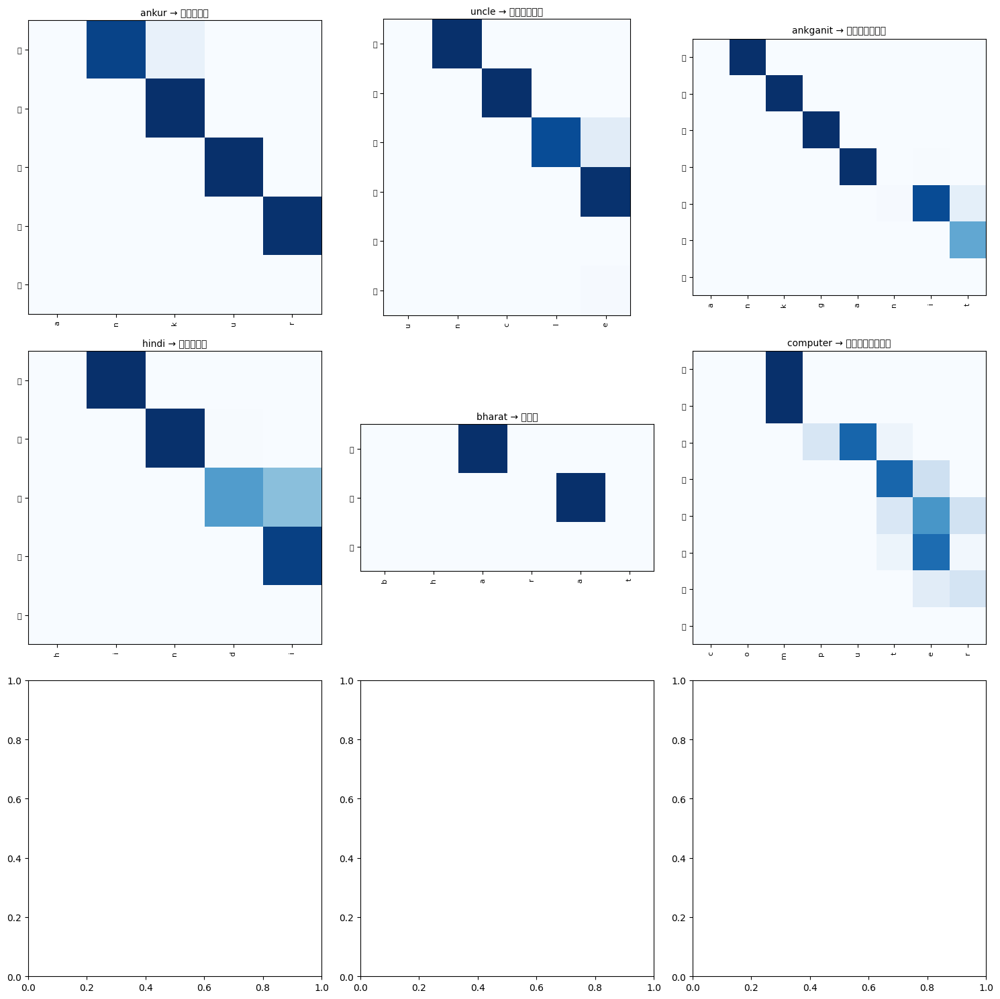

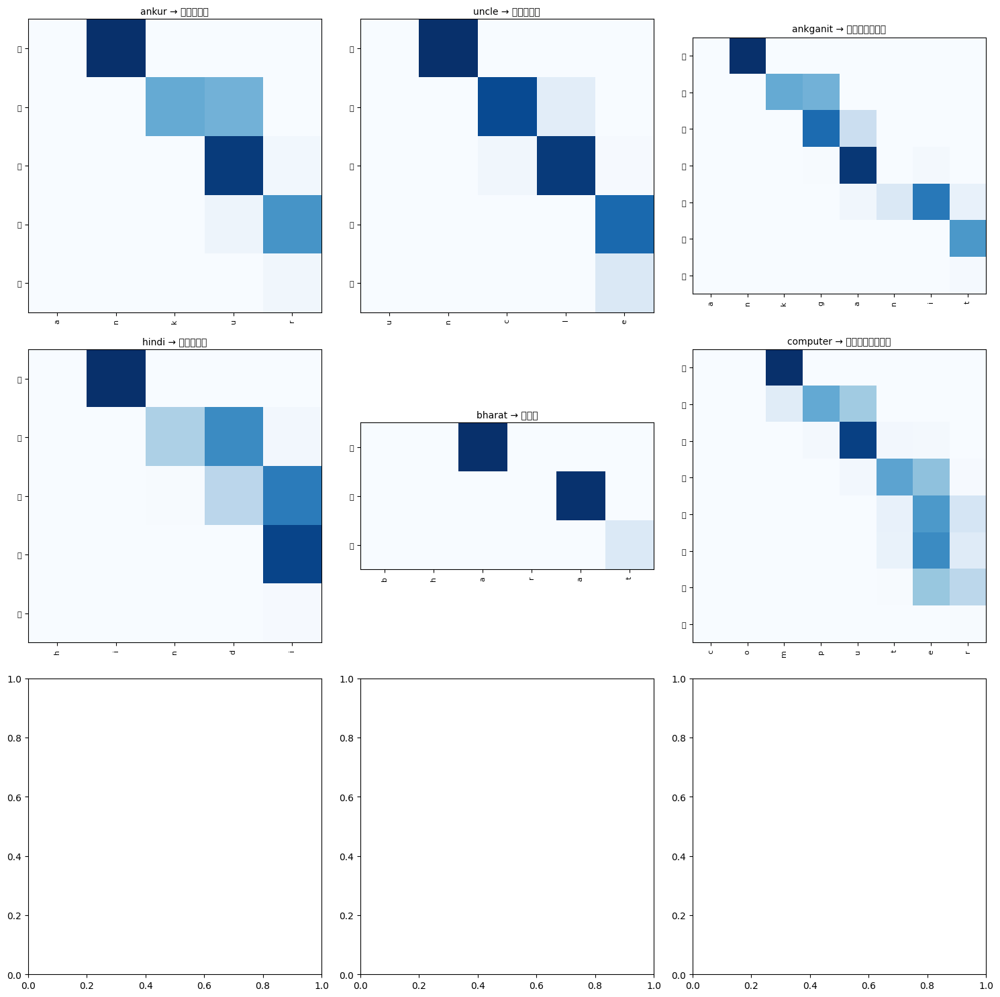

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2348 (\N{DEVANAGARI LETTER BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


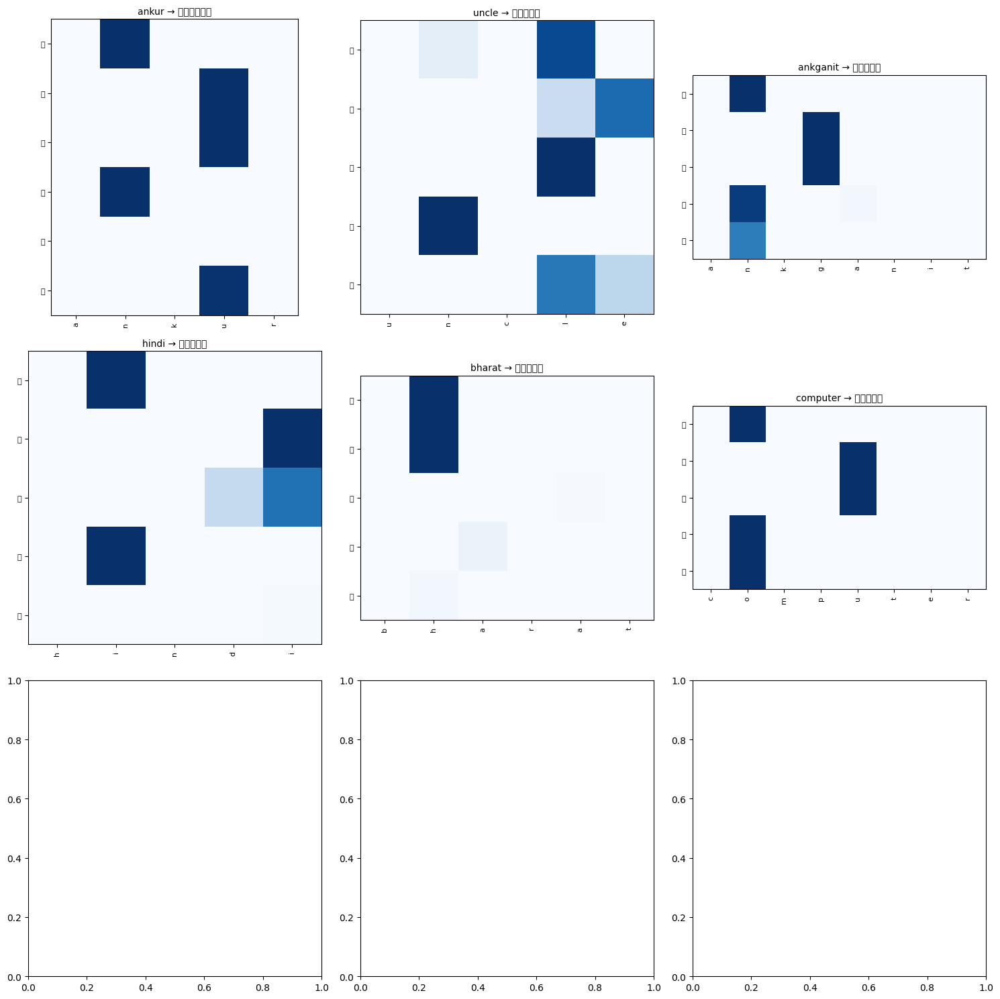

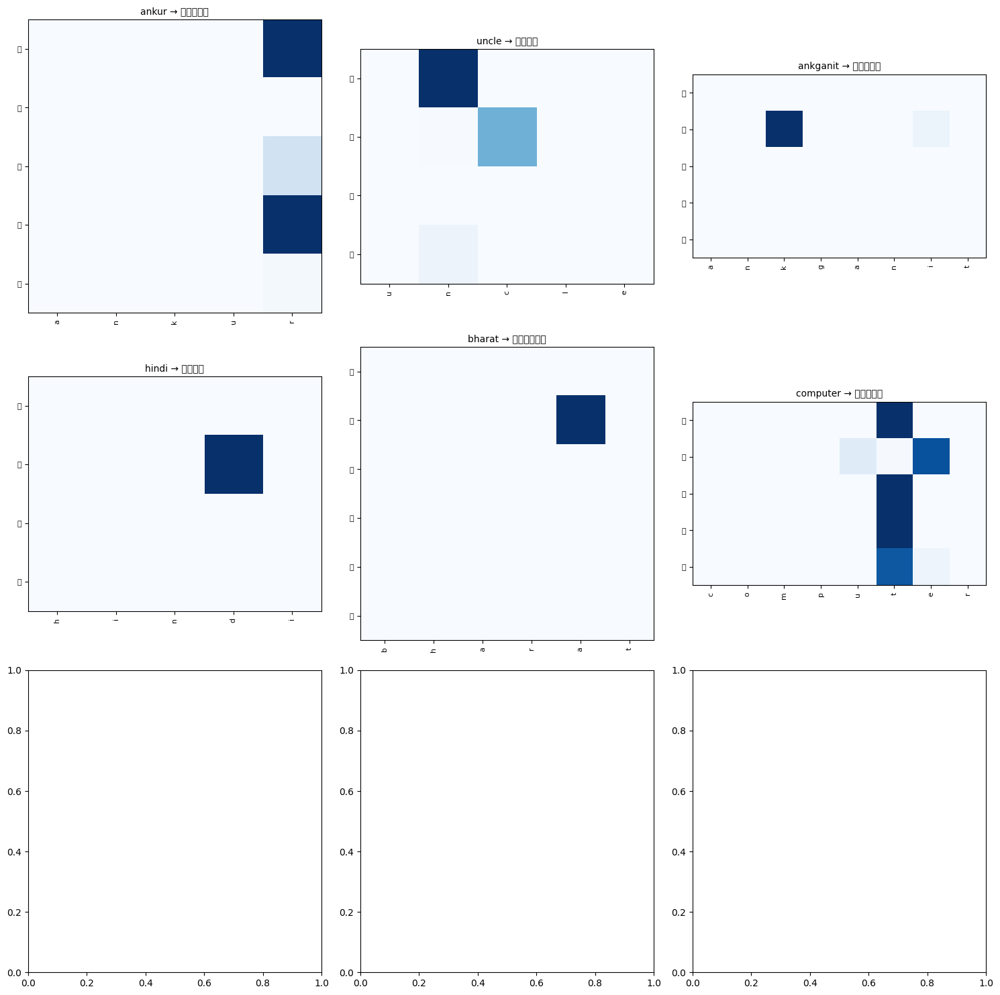

In [14]:
def train_with_config():
    # Initialize wandb run
    run = wandb.init()
    
    # Get hyperparameters from sweep
    config = {
        'input_vocab_size': len(src_vocab),
        'output_vocab_size': len(tgt_vocab),
        'embedding_dim': wandb.config.embedding_dim,
        'hidden_dim': wandb.config.hidden_dim,
        'num_encoding_layers': wandb.config.num_encoding_layers,
        'num_decoding_layers': wandb.config.num_decoding_layers,
        'dropout': wandb.config.dropout,
        'cell_type': wandb.config.cell_type,
        'teacher_forcing_ratio': wandb.config.teacher_forcing_ratio,
        'learning_rate': wandb.config.learning_rate,
        'batch_size': wandb.config.batch_size,
        'device': device
    }
    
    # Create datasets
    train_dataset = TransliterationDataset(train_df, src_vocab, tgt_vocab)
    val_dataset = TransliterationDataset(val_df, src_vocab, tgt_vocab)
    
    # Create data loaders with gradient accumulation
    train_loader = DataLoader(
        train_dataset,
        batch_size=config['batch_size'],
        shuffle=True,
        collate_fn=collate_fn
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        collate_fn=collate_fn
    )
    
    # Initialize model
    model = AttentionSeq2Seq(config).to(device)
    
    # Log model architecture
    wandb.watch(model, log='all')
    
    # Optimizer and criterion
    optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'])
    criterion = nn.CrossEntropyLoss(ignore_index=tgt_vocab['<PAD>'])
    
    # Mixed precision training
    scaler = GradScaler() if device.type == 'cuda' else None
    
    # Training loop
    best_exact_match = 0
    best_char_accuracy = 0
    patience = 0
    
    for epoch in range(15):
        # Train
        train_loss = train_epoch(model, train_loader, optimizer, criterion, scaler)
        
        # Evaluate
        eval_metrics = evaluate(model, val_loader, criterion)
        
        # Log metrics
        wandb.log({
            'epoch': epoch,
            'train_loss': train_loss,
            'val_loss': eval_metrics['loss'],
            'val_exact_match': eval_metrics['exact_match_accuracy'],
            'val_char_accuracy': eval_metrics['char_accuracy']
        })
        
        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {eval_metrics['loss']:.4f}")
        print(f"Exact Match Accuracy: {eval_metrics['exact_match_accuracy']:.4f}, Char Accuracy: {eval_metrics['char_accuracy']:.4f}")
        
        # Save best model
        if eval_metrics['exact_match_accuracy'] > best_exact_match:
            best_exact_match = eval_metrics['exact_match_accuracy']
            best_char_accuracy = eval_metrics['char_accuracy']
            torch.save(model.state_dict(), f'best_attention_model_{wandb.run.id}.pt')
            patience = 0
        else:
            patience += 1
            
        # Early stopping
        if patience >= 8:  # Stop after 8 epochs without improvement
            print(f"Early stopping at epoch {epoch+1}")
            break
    
    # Log best metrics
    wandb.run.summary['best_exact_match'] = best_exact_match
    wandb.run.summary['best_char_accuracy'] = best_char_accuracy
    
    # Test examples and visualize attention
    test_examples = ['ankur', 'uncle', 'ankganit', 'hindi', 'bharat', 'computer']
    results = []
    
    for example in test_examples:
        translation, attentions = translate_sentence(model, example, src_vocab, tgt_vocab, idx2tgt)
        results.append(f"Input: {example}, Translation: {translation}")
        
        # Create attention plot
        if len(attentions) > 0:
            fig = plot_attention(example, translation, np.array(attentions), idx2src)
            wandb.log({f"attention_{example}": wandb.Image(fig)})
            plt.close(fig)
    
    # Create grid of attention plots
    grid_fig = create_attention_grid(model, test_examples, src_vocab, tgt_vocab, idx2src, idx2tgt)
    wandb.log({"attention_grid": wandb.Image(grid_fig)})
    
    wandb.log({"examples": wandb.Table(columns=["Example"], data=[[r] for r in results])})
    
    return model

# Define sweep configuration
sweep_config = {
    'name': 'sweepSeq2SeqAtt',
    'method': 'bayes',  # Bayesian optimization
    'metric': {
        'name': 'val_exact_match',  # Optimize for exact match
        'goal': 'maximize'
    },
    'parameters': {
        'embedding_dim': {'values': [128, 256, 512]},
        'hidden_dim': {'values': [256, 512]},
        'num_encoding_layers': {'values': [1, 2, 3]},
        'num_decoding_layers': {'values': [1, 2, 3]},
        'dropout': {'values': [0.2, 0.3]},
        'cell_type': {'values': ['gru', 'lstm', 'rnn']},
        'teacher_forcing_ratio': {'values': [0.7, 0.9]},
        'learning_rate': {
            'distribution': 'log_uniform',
            'min': -7.6,
            'max': -5.9
        },
        'batch_size': {'values': [64, 128]}
    }
}

# Initialize sweep
sweep_id = wandb.sweep(sweep_config, project="seq2seq-attention-transliteration", entity='da24m005-iit-madras')

# Start the sweep agent
wandb.agent(sweep_id, train_with_config, count=40)  # Run 40 experiments

### Final Training with Best Configuration

In [15]:

def train_best_attention_model(config, epochs=40):
    # Initialize wandb run for final training
    run = wandb.init(project="seq2seq-attention-final", name="best_attention_model_final_training")
    
    # Log the configuration
    wandb.config.update(config)
    
    # Create datasets
    train_dataset = TransliterationDataset(train_df, src_vocab, tgt_vocab)
    val_dataset = TransliterationDataset(val_df, src_vocab, tgt_vocab)
    test_dataset = TransliterationDataset(test_df, src_vocab, tgt_vocab)
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=config['batch_size'],
        shuffle=True,
        collate_fn=collate_fn
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        collate_fn=collate_fn
    )
    
    test_loader = DataLoader(
        test_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        collate_fn=collate_fn
    )
    
    # Initialize model
    model = AttentionSeq2Seq(config).to(device)
    
    # Log model architecture
    wandb.watch(model, log='all')
    
    # Optimizer and criterion
    optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'])
    criterion = nn.CrossEntropyLoss(ignore_index=tgt_vocab['<PAD>'])
    
    # Mixed precision training
    scaler = GradScaler() if device.type == 'cuda' else None
    
    # Training loop
    best_exact_match = 0
    best_model_state = None
    
    for epoch in range(epochs):
        # Train
        train_loss = train_epoch(model, train_loader, optimizer, criterion, scaler)
        
        # Evaluate on validation set
        eval_metrics = evaluate(model, val_loader, criterion)
        
        # Log metrics
        wandb.log({
            'epoch': epoch,
            'train_loss': train_loss,
            'val_loss': eval_metrics['loss'],
            'val_exact_match': eval_metrics['exact_match_accuracy'],
            'val_char_accuracy': eval_metrics['char_accuracy']
        })
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {eval_metrics['loss']:.4f}")
        print(f"Exact Match Accuracy: {eval_metrics['exact_match_accuracy']:.4f}, Char Accuracy: {eval_metrics['char_accuracy']:.4f}")
        
        # Save best model
        if eval_metrics['exact_match_accuracy'] > best_exact_match:
            best_exact_match = eval_metrics['exact_match_accuracy']
            best_model_state = model.state_dict().copy()
            torch.save(model.state_dict(), 'best_attention_model_final.pt')
            wandb.save('best_attention_model_final.pt')
    
    # Load best model for testing
    model.load_state_dict(best_model_state)
    
    # Evaluate on test set
    test_metrics = evaluate(model, test_loader, criterion)
    
    # Log final test metrics
    wandb.run.summary['test_loss'] = test_metrics['loss']
    wandb.run.summary['test_exact_match'] = test_metrics['exact_match_accuracy']
    wandb.run.summary['test_char_accuracy'] = test_metrics['char_accuracy']
    
    print(f"\nFinal Test Results:")
    print(f"Test Loss: {test_metrics['loss']:.4f}")
    print(f"Test Exact Match Accuracy: {test_metrics['exact_match_accuracy']:.4f}")
    print(f"Test Character Accuracy: {test_metrics['char_accuracy']:.4f}")
    
    # Generate predictions and attention visualizations for test examples
    predictions = []
    for i in range(min(100, len(test_df))):
        src_text = test_df.iloc[i]['en']
        tgt_text = test_df.iloc[i]['hi']
        pred_text, attentions = translate_sentence(model, src_text, src_vocab, tgt_vocab, idx2tgt)
        
        predictions.append({
            'Source': src_text,
            'Target': tgt_text,
            'Prediction': pred_text,
            'Correct': pred_text == tgt_text
        })
        
        # Create attention visualization for first 10 examples
        if i < 10 and len(attentions) > 0:
            fig = plot_attention(src_text, pred_text, np.array(attentions), idx2src)
            wandb.log({f"test_attention_{i}": wandb.Image(fig)})
            plt.close(fig)
    
    # Create a grid of attention visualizations
    test_examples = [test_df.iloc[i]['en'] for i in range(9)]
    grid_fig = create_attention_grid(model, test_examples, src_vocab, tgt_vocab, idx2src, idx2tgt)
    wandb.log({"test_attention_grid": wandb.Image(grid_fig)})
    
    # Create a table for predictions
    prediction_table = wandb.Table(dataframe=pd.DataFrame(predictions))
    wandb.log({"test_predictions": prediction_table})
    
    # Save predictions to file for assignment submission
    pd.DataFrame(predictions).to_csv('predictions_attention.csv', index=False)
    wandb.save('predictions_attention.csv')
    
    # Create error analysis
    error_examples = [p for p in predictions if not p['Correct']]
    error_table = wandb.Table(dataframe=pd.DataFrame(error_examples[:20]))
    wandb.log({"error_analysis": error_table})
    
    # Close wandb run
    wandb.finish()
    
    return model, pd.DataFrame(predictions)

In [16]:
def get_best_config(project_name, entity="da24m005-iit-madras"):
    """
    Retrieves the best configuration from a wandb sweep based on validation accuracy.
    
    Args:
        project_name (str): The name of your wandb project
        entity (str, optional): Your wandb username/entity
    
    Returns:
        dict: The configuration of the best performing run
    """
    api = wandb.Api()
    path = f"{entity}/{project_name}" if entity else project_name
    runs = api.runs(path)
    
    best_run = None
    best_metric = float('-inf')
    
    for run in runs:
        if run.state == "finished":
            # Check different possible metric names
            val_metric = (run.summary.get('val_exact_match') or 
                         run.summary.get('val_accuracy') or 
                         run.summary.get('best_val_accuracy'))
            
            if val_metric is not None and val_metric > best_metric:
                best_metric = val_metric
                best_run = run
    
    if best_run:
        print(f"Best run ID: {best_run.id}")
        print(f"Best run name: {best_run.name}")
        print(f"Best validation metric: {best_metric:.4f}")
        
        # Create a clean config dictionary
        best_config = {
            'input_vocab_size': len(src_vocab),
            'output_vocab_size': len(tgt_vocab),
            'embedding_dim': best_run.config['embedding_dim'],
            'hidden_dim': best_run.config['hidden_dim'],
            'num_encoding_layers': best_run.config['num_encoding_layers'],
            'num_decoding_layers': best_run.config['num_decoding_layers'],
            'dropout': best_run.config['dropout'],
            'cell_type': best_run.config['cell_type'],
            'teacher_forcing_ratio': best_run.config['teacher_forcing_ratio'],
            'learning_rate': best_run.config['learning_rate'],
            'batch_size': best_run.config['batch_size'],
            'device': device
        }
        
        print(f"Best config: {best_config}")
        return best_config
    else:
        print("No finished runs found.")
        return None

best_config = get_best_config('seq2seq-attention-transliteration')

Best run ID: 44fdzej7
Best run name: fine-sweep-35
Best validation metric: 0.4449
Best config: {'input_vocab_size': 30, 'output_vocab_size': 67, 'embedding_dim': 128, 'hidden_dim': 512, 'num_encoding_layers': 2, 'num_decoding_layers': 3, 'dropout': 0.3, 'cell_type': 'lstm', 'teacher_forcing_ratio': 0.9, 'learning_rate': 0.0006293179845087059, 'batch_size': 128, 'device': device(type='cuda')}


wandb: WARNING Changes to your `wandb` environment variables will be ignored because your `wandb` session has already started. For more information on how to modify your settings with `wandb.init()` arguments, please refer to https://wandb.me/wandb-init.
wandb: WARNING Ignoring project 'seq2seq-attention-final' when running a sweep.
wandb: Tracking run with wandb version 0.19.9
wandb: Run data is saved locally in /kaggle/working/wandb/run-20250517_164741-vmuez8d2
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run best_attention_model_final_training
wandb: ⭐️ View project at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration
wandb: 🧹 View sweep at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/sweeps/6vex8glo
wandb: 🚀 View run at https://wandb.ai/da24m005-iit-madras/seq2seq-attention-transliteration/runs/vmuez8d2
wandb: WARNING Config item 'embedding_dim' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'hidde

Training:   0%|          | 0/346 [00:00<?, ?it/s]

/tmp/ipykernel_19/1710485381.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1/40, Train Loss: 2.9236, Val Loss: 3.3430
Exact Match Accuracy: 0.0000, Char Accuracy: 0.1719


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2/40, Train Loss: 2.2979, Val Loss: 2.5029
Exact Match Accuracy: 0.0220, Char Accuracy: 0.3715


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3/40, Train Loss: 1.2386, Val Loss: 1.7507
Exact Match Accuracy: 0.2150, Char Accuracy: 0.6014


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4/40, Train Loss: 0.7673, Val Loss: 1.5574
Exact Match Accuracy: 0.2958, Char Accuracy: 0.6550


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5/40, Train Loss: 0.6052, Val Loss: 1.4446
Exact Match Accuracy: 0.3527, Char Accuracy: 0.6938


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6/40, Train Loss: 0.4968, Val Loss: 1.4440
Exact Match Accuracy: 0.3740, Char Accuracy: 0.7082


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7/40, Train Loss: 0.4324, Val Loss: 1.4129
Exact Match Accuracy: 0.3784, Char Accuracy: 0.7148


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8/40, Train Loss: 0.3776, Val Loss: 1.4325
Exact Match Accuracy: 0.3784, Char Accuracy: 0.7169


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9/40, Train Loss: 0.3420, Val Loss: 1.4366
Exact Match Accuracy: 0.3972, Char Accuracy: 0.7276


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10/40, Train Loss: 0.3042, Val Loss: 1.4472
Exact Match Accuracy: 0.4071, Char Accuracy: 0.7339


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11/40, Train Loss: 0.2742, Val Loss: 1.4652
Exact Match Accuracy: 0.3965, Char Accuracy: 0.7323


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12/40, Train Loss: 0.2528, Val Loss: 1.4889
Exact Match Accuracy: 0.4140, Char Accuracy: 0.7357


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13/40, Train Loss: 0.2283, Val Loss: 1.5028
Exact Match Accuracy: 0.4151, Char Accuracy: 0.7380


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14/40, Train Loss: 0.2134, Val Loss: 1.5172
Exact Match Accuracy: 0.4140, Char Accuracy: 0.7375


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15/40, Train Loss: 0.1943, Val Loss: 1.5317
Exact Match Accuracy: 0.4098, Char Accuracy: 0.7404


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 16/40, Train Loss: 0.1846, Val Loss: 1.5286
Exact Match Accuracy: 0.4227, Char Accuracy: 0.7442


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 17/40, Train Loss: 0.1725, Val Loss: 1.5549
Exact Match Accuracy: 0.4149, Char Accuracy: 0.7410


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 18/40, Train Loss: 0.1580, Val Loss: 1.6166
Exact Match Accuracy: 0.4142, Char Accuracy: 0.7398


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 19/40, Train Loss: 0.1425, Val Loss: 1.6136
Exact Match Accuracy: 0.4364, Char Accuracy: 0.7491


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 20/40, Train Loss: 0.1373, Val Loss: 1.6474
Exact Match Accuracy: 0.4160, Char Accuracy: 0.7435


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 21/40, Train Loss: 0.1334, Val Loss: 1.6525
Exact Match Accuracy: 0.4174, Char Accuracy: 0.7441


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 22/40, Train Loss: 0.1244, Val Loss: 1.6863
Exact Match Accuracy: 0.4270, Char Accuracy: 0.7487


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 23/40, Train Loss: 0.1151, Val Loss: 1.7153
Exact Match Accuracy: 0.4201, Char Accuracy: 0.7454


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 24/40, Train Loss: 0.1113, Val Loss: 1.7470
Exact Match Accuracy: 0.4188, Char Accuracy: 0.7448


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 25/40, Train Loss: 0.1086, Val Loss: 1.7481
Exact Match Accuracy: 0.4151, Char Accuracy: 0.7415


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 26/40, Train Loss: 0.1045, Val Loss: 1.7988
Exact Match Accuracy: 0.4197, Char Accuracy: 0.7433


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 27/40, Train Loss: 0.0984, Val Loss: 1.7980
Exact Match Accuracy: 0.4130, Char Accuracy: 0.7447


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 28/40, Train Loss: 0.0944, Val Loss: 1.8389
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7389


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 29/40, Train Loss: 0.0914, Val Loss: 1.8268
Exact Match Accuracy: 0.4183, Char Accuracy: 0.7465


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 30/40, Train Loss: 0.0896, Val Loss: 1.8985
Exact Match Accuracy: 0.4153, Char Accuracy: 0.7392


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 31/40, Train Loss: 0.0869, Val Loss: 1.8913
Exact Match Accuracy: 0.4105, Char Accuracy: 0.7418


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 32/40, Train Loss: 0.0834, Val Loss: 1.8839
Exact Match Accuracy: 0.4110, Char Accuracy: 0.7458


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 33/40, Train Loss: 0.0815, Val Loss: 1.8406
Exact Match Accuracy: 0.4172, Char Accuracy: 0.7470


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 34/40, Train Loss: 0.0806, Val Loss: 1.8798
Exact Match Accuracy: 0.4137, Char Accuracy: 0.7453


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 35/40, Train Loss: 0.0789, Val Loss: 1.8872
Exact Match Accuracy: 0.4101, Char Accuracy: 0.7439


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 36/40, Train Loss: 0.0763, Val Loss: 1.9226
Exact Match Accuracy: 0.4169, Char Accuracy: 0.7446


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 37/40, Train Loss: 0.0737, Val Loss: 1.9375
Exact Match Accuracy: 0.4002, Char Accuracy: 0.7420


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 38/40, Train Loss: 0.0724, Val Loss: 1.9925
Exact Match Accuracy: 0.4119, Char Accuracy: 0.7425


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 39/40, Train Loss: 0.0715, Val Loss: 1.9912
Exact Match Accuracy: 0.4098, Char Accuracy: 0.7398


Training:   0%|          | 0/346 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 40/40, Train Loss: 0.0680, Val Loss: 1.9610
Exact Match Accuracy: 0.4066, Char Accuracy: 0.7422


Evaluating:   0%|          | 0/36 [00:00<?, ?it/s]


Final Test Results:
Test Loss: 2.0273
Test Exact Match Accuracy: 0.4007
Test Character Accuracy: 0.7340


/tmp/ipykernel_19/2168023762.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + sentence_chars, rotation=90)
/tmp/ipykernel_19/2168023762.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + list(translation))
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2309 (\N{DEVANAGARI LETTER A}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Matplotlib currently does not support Devanagari natively.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2325 (\N{DEVANAGARI LETTER KA}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/2168023762.py:19: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from current font.
  plt.tight_layout(

,Source,Target,Prediction,Correct
0,ank,अंक,अंक,True
1,anka,अंक,अंका,False
2,ankit,अंकित,अंकित,True
3,anakon,अंकों,अनाकों,False
4,ankhon,अंकों,आँखों,False
5,ankon,अंकों,आंकों,False
6,angkor,अंकोर,आंगकोर,False
7,ankor,अंकोर,अंकॉर,False
8,angaarak,अंगारक,अंगारक,True
9,angarak,अंगारक,अंगरक,False


/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 2309 (\N{DEVANAGARI LETTER A}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Matplotlib currently does not support Devanagari natively.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 2325 (\N{DEVANAGARI LETTER KA}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 2367 (\N{DEVANAGARI VOWEL SIGN I}) missing from current font.
  func

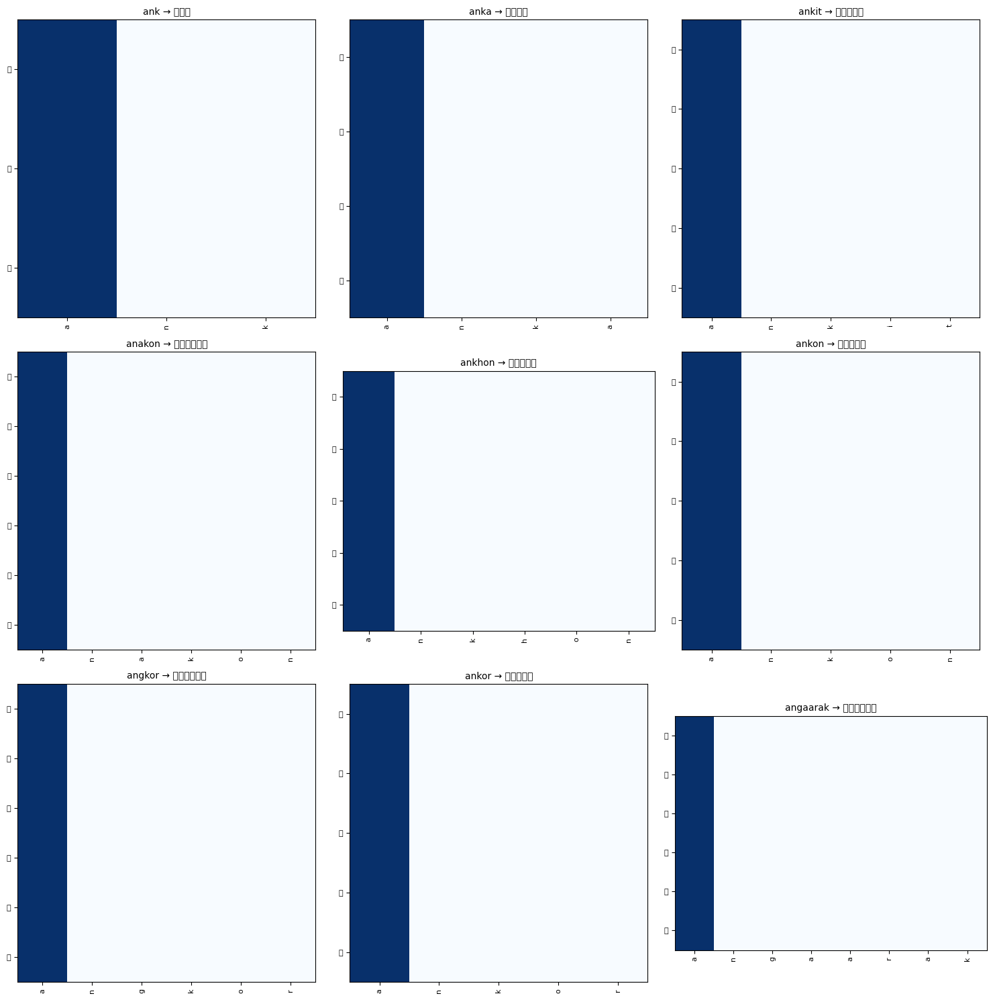

In [17]:
# Train the best model for 40 epochs
best_model, predictions = train_best_attention_model(best_config, epochs=40)

# Display some predictions
predictions.head(10)

In [18]:
predictions.to_csv('transliterationAtt.csv')